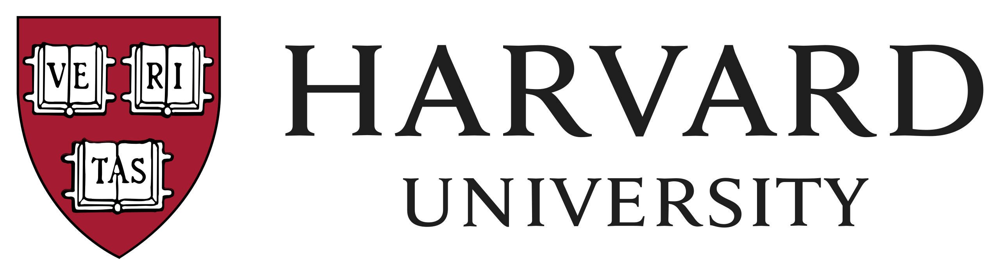

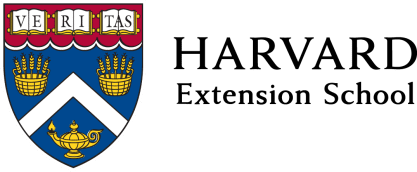

## **Master of Liberal Arts, Data Science**

## **CSCI E-83 Fundamentals of Data Science in Python**

## Professor's name: **Stephen Elston**

## Author's name: **Dai Phuong Ngo (Liam)**

# **Analyzing Housing Affordability: Exploring Key Influential Features by Regression and Statistical Modeling**

# **Introduction and Background**

The housing market has long been a crucial area of interests for businesses, individuals and especially policy makers. In the mortgage banking industry where I am working for at the moment, understanding factors impacting on housing affordability is critical for tailoring financial products, advising clients and managing risks from different perspectives. In Canada particularly, housing affordability has become increasingly challenging due to rising sales prices, limited inventory because of slow construction versus high demand, and economic uncertainty. This triggered the requirement for mortgage providers and underwriters, real estate brokers, consumers to evaluate the most influential factors driving housing affordability.

The issues might face complexity due to the wide range of direct features impacting on sales price, such as living space, condition, property type or less obvious features, such as, year remodeled or basement size. An unwanted fact is that the distribution of sales price is often skewed with extreme outlers complicating further analysis. Traditional evalutions might not succeed in understanding all of these variations, therefore, empowering advanced statistical techniques is important to understand and diagnose affordability better.



# **Project Goal**

This project aims to analyze the key housing features that affect sales prices and housing affordability to provide actionable insights. Inferences retrieved from the data can help to identify features having greatest impact on affordability and generate further insights for homebuyers, who have to make informed decision on which housing option is compatible with their affordability, real estate brokers, who have to customize advice and recommendations to individual needs, and mortgage providers or banks, like my current company, who have to set up financing solutions based on metrics of housing affordability. Therefore, the final goal of this project is to develop statistical solutions with sampling techniques, OLS regression models and Bayesian analysis to assess contributions from the most influential housing features to housing affordability. This emphasis will be on inference, rather than prediction, and will address upcoming challenges expressed by skew distributions in prices and their outliers to make sure conclusions are drawn in a statistically reliable, practical and relevant way.


# **What This Project Is Not About**

It is import to clarify that this project is not about price prediction or prediction's optimization. Instead, it concentrates on statistical inference, which determines the impact of different features on affordability and provides a statistical framework to interpret their impacts to indentify the most crucial influencers. Machine Learning algorithms such as tree-nased models or neural networks are not applicable in this project as it focus on capturing relationships among features. Also, this project does not set certain affordability thresholds manually and affordability's classification.

# **Data**

A challenge arises with the data availability for the Canadian context that I am unable to find a good enough or ready-to-consume data with domain in Canadian housing affordability. I tried to look through websites of Government of Canada or Canada Statistics but their data are scattered, not yet combined, time series type and require significant amount of time to find enough data aspects for manipulationa and combination, regarless of their individual dataset's completeness across features. Therefore, I decided to focus on statiscal modelling techniques analyzing housing affordability with usage of this data from the American housing context of Ames city.

The data comes directly from Kaggle with two sets: training and testing. I will use the training for data exploration, preparation, assessment and model development before applying the best model on the testing set. The data has 79 explanatory variables which are manageable and describe aspects of residential properties in Ames, Iowa. This data provides an excellent source to study housing trends and affordability with a good amount of meaningful features and data records describing different aspects of housing. The modelling will take all features as influencers to be analyzed, visualized, sampled and modelled to assess the final set of best features on different samples of the US house prices and affordability in Ames. Later, the training data can be split into 2 samples: training and testing for further model evaluation.

https://www.kaggle.com/competitions/house-prices-advanced-regression-techniques


# Import Libraries

In [ ]:
import time
import sys
import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from datetime import datetime
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
import math
np.set_printoptions(precision=3)
import statsmodels.api as sm
import scipy.stats as stats
import pymc as pm
import arviz as az

In [ ]:
# Ensure all rows are displayed
pd.set_option('display.max_rows', None)

In [ ]:
# Adjust pandas display options
pd.set_option('display.max_columns', None)

# Load Data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
PATH = "/content/drive/My Drive/Colab Notebooks/Nordic Coder/Python for Data Analysis/House Price Prediction"

# Part 1: EXPLORATORY DATA ANALYSIS

In [ ]:
df = pd.read_csv(PATH + "/train.csv")

temp = df.columns.tolist() # list out all columns names

In [ ]:
df_original = df.copy()

In [ ]:
df.head(5)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [ ]:
temp

['Id',
 'MSSubClass',
 'MSZoning',
 'LotFrontage',
 'LotArea',
 'Street',
 'Alley',
 'LotShape',
 'LandContour',
 'Utilities',
 'LotConfig',
 'LandSlope',
 'Neighborhood',
 'Condition1',
 'Condition2',
 'BldgType',
 'HouseStyle',
 'OverallQual',
 'OverallCond',
 'YearBuilt',
 'YearRemodAdd',
 'RoofStyle',
 'RoofMatl',
 'Exterior1st',
 'Exterior2nd',
 'MasVnrType',
 'MasVnrArea',
 'ExterQual',
 'ExterCond',
 'Foundation',
 'BsmtQual',
 'BsmtCond',
 'BsmtExposure',
 'BsmtFinType1',
 'BsmtFinSF1',
 'BsmtFinType2',
 'BsmtFinSF2',
 'BsmtUnfSF',
 'TotalBsmtSF',
 'Heating',
 'HeatingQC',
 'CentralAir',
 'Electrical',
 '1stFlrSF',
 '2ndFlrSF',
 'LowQualFinSF',
 'GrLivArea',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'KitchenQual',
 'TotRmsAbvGrd',
 'Functional',
 'Fireplaces',
 'FireplaceQu',
 'GarageType',
 'GarageYrBlt',
 'GarageFinish',
 'GarageCars',
 'GarageArea',
 'GarageQual',
 'GarageCond',
 'PavedDrive',
 'WoodDeckSF',
 'OpenPorchSF'

### Review data type & Cast MSSubClass

In [ ]:
data_types = df.dtypes

print("Column Data Types:\n")
print(data_types)

print("\nSummary of Data Types:")
print(data_types.value_counts())

Column Data Types:

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
Street            object
Alley             object
LotShape          object
LandContour       object
Utilities         object
LotConfig         object
LandSlope         object
Neighborhood      object
Condition1        object
Condition2        object
BldgType          object
HouseStyle        object
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
RoofStyle         object
RoofMatl          object
Exterior1st       object
Exterior2nd       object
MasVnrType        object
MasVnrArea       float64
ExterQual         object
ExterCond         object
Foundation        object
BsmtQual          object
BsmtCond          object
BsmtExposure      object
BsmtFinType1      object
BsmtFinSF1         int64
BsmtFinType2      object
BsmtFinSF2         int64
BsmtUnfSF          int64
TotalBsmtSF        int64
Heati

As SubClass was initially identified as int64, I will cast it as object although its values are numeric.

In [ ]:
# Cast MSSubClass to object type
df['MSSubClass'] = df['MSSubClass'].astype('object')

print("Data type of MSSubClass after casting:", df['MSSubClass'].dtype)

Data type of MSSubClass after casting: object


## Check for null or NaN

In [ ]:
df.shape

(1460, 81)

In [ ]:
# Check for missing (NaN) values in numerical and categorical columns
numerical_nulls = df.select_dtypes(include=['int64', 'float64']).isnull().sum()
numerical_nulls = numerical_nulls[numerical_nulls > 0]  # Filter columns with NaN values

categorical_nulls = df.select_dtypes(include=['object', 'category']).isnull().sum()
categorical_nulls = categorical_nulls[categorical_nulls > 0]  # Filter columns with NaN values

print("Missing values in numerical features:")
print(numerical_nulls)

print("\nMissing values in categorical features:")
print(categorical_nulls)

Missing values in numerical features:
LotFrontage    259
MasVnrArea       8
GarageYrBlt     81
dtype: int64

Missing values in categorical features:
Alley           1369
MasVnrType       872
BsmtQual          37
BsmtCond          37
BsmtExposure      38
BsmtFinType1      37
BsmtFinType2      38
Electrical         1
FireplaceQu      690
GarageType        81
GarageFinish      81
GarageQual        81
GarageCond        81
PoolQC          1453
Fence           1179
MiscFeature     1406
dtype: int64


As NaN values exist in some features, I will provide some treatments to fill with 0 or median values or certain values based on the Data Dictionary, depending on certain features. For some features related to Year, I will leave them as they are for now.

In [ ]:


# Replace missing values for LotFrontage with the median value grouped by Neighborhood
if 'Neighborhood' in df.columns:
    df['LotFrontage'] = df.groupby('Neighborhood')['LotFrontage'].transform(lambda x: x.fillna(x.median()))
else:
    df['LotFrontage'] = df['LotFrontage'].fillna(df['LotFrontage'].median())

In [ ]:


# Fill "No Basement" for Basement-related features
fill_with_no_basement = ['BsmtQual', 'BsmtCond']
for feature in fill_with_no_basement:
    df[feature] = df[feature].fillna('No Basement')

# Fill other categorical features with specific values
df['Electrical'] = df['Electrical'].fillna('No Information')
df['FireplaceQu'] = df['FireplaceQu'].fillna('No Fireplace')

garage_related_features = ['GarageType', 'GarageFinish', 'GarageQual', 'GarageCond']
for feature in garage_related_features:
    df[feature] = df[feature].fillna('No Garage')

df['PoolQC'] = df['PoolQC'].fillna('No Pool')
df['Fence'] = df['Fence'].fillna('No Fence')
df['MiscFeature'] = df['MiscFeature'].fillna('No Feature')

# Fill GarageYrBlt with the Most Common Year
most_common_year = df['GarageYrBlt'].mode()[0]
df['GarageYrBlt'] = df['GarageYrBlt'].fillna(most_common_year)

# Verify all steps
print("Missing values after adjustments:")
print(df.isnull().sum()[df.isnull().sum() > 0])

Missing values after adjustments:
Alley           1369
MasVnrType       872
MasVnrArea         8
BsmtExposure      38
BsmtFinType1      37
BsmtFinType2      38
dtype: int64


## Create Total Living Area feature

In [ ]:
df['TotalLivingArea'] = (
    df['GrLivArea'] + df['1stFlrSF'] + df['2ndFlrSF']
)
# Drop original living area-related features
df.drop(columns=['GrLivArea', '1stFlrSF', '2ndFlrSF'], inplace=True)

## Create Total Bath feature

In [ ]:
# Create Total Bath feature
df['TotalBath'] = (
    df['FullBath'] + df['HalfBath'] * 0.5 +
    df['BsmtFullBath'] + df['BsmtHalfBath'] * 0.5
)
# Drop individual bath features
df.drop(columns=['FullBath', 'HalfBath', 'BsmtFullBath', 'BsmtHalfBath'], inplace=True)

By creating two new features as above, relationships in data can be more effectively captured by aggregated features with combined effects. Total living area can explain house prices better than splitting it across individual floor areas. Total bath count incorporates the effects of full and half bathrooms in a more meaningful way. This is as expected as home buyers tend to care more about the total living space and the total number of bathrooms that could include both full bath and half bath. These two new features simplify the model while preserving the total living space's explanatory power. Also, they can eliminate the correlation between the original features and stabilize the latter models as high correlation between independent variables leads to multicollinearity which inflates standard errors of coefficients and makes coefficients unstable and difficult to interpret.

## Recode Building Type and House Style

In [ ]:
# Recode Building Type and House Style
df['BuildingType_Simplified'] = df['BldgType'].apply(lambda x: 'Multi_Family' if x in ['2fmCon', 'Duplex', 'Twnhs'] else 'Single_Family')
df['HouseStyle_Simplified'] = df['HouseStyle'].apply(lambda x: 'Single_Family' if x in ['1Story', '1.5Unf', '1.5Fin'] else 'Multi_Family')

# Drop the original columns
df = df.drop(columns=['BldgType', 'HouseStyle'])
# Rename the new columns back to the original names
df = df.rename(columns={
    'BuildingType_Simplified': 'BldgType',
    'HouseStyle_Simplified': 'HouseStyle'
})

## Histogram before Convertion

In [ ]:
# Exclude all year-type columns, Id, and MSSubClass
columns_to_exclude = [col for col in df.columns if 'Year' in col or 'Yr' in col or 'Mo' in col or col in ['Id']]
numerical_features = df.select_dtypes(include=["float64", "int64"]).drop(columns=columns_to_exclude, axis=1).columns.tolist()

print("Numerical Features Excluding Year-Type Columns, Id, and MSSubClass:")
print(numerical_features)

Numerical Features Excluding Year-Type Columns, Id, and MSSubClass:
['LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'LowQualFinSF', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'SalePrice', 'TotalLivingArea', 'TotalBath']


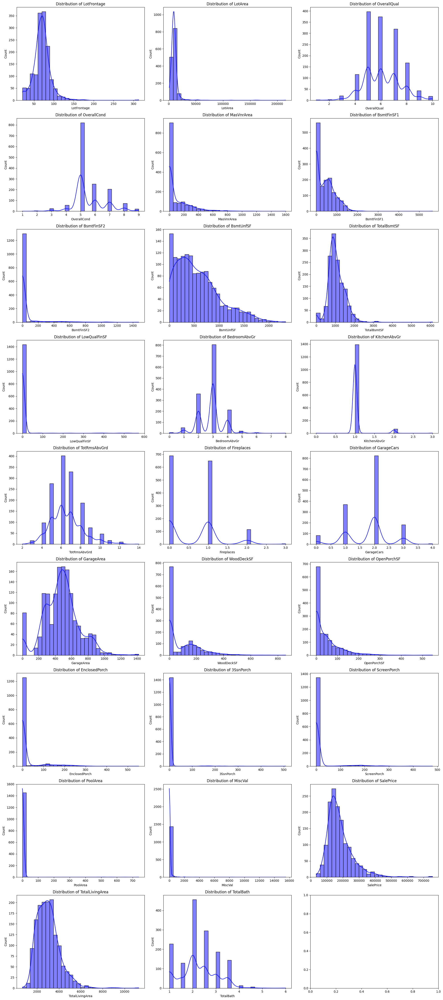

In [ ]:
cols = 3
rows = math.ceil(len(numerical_features) / cols)

fig, axes = plt.subplots(rows, cols, figsize=(20, 5 * rows))
axes = axes.flatten()

for i, feature in enumerate(numerical_features):
    sns.histplot(df[feature], kde=True, ax=axes[i], bins=30, color='blue')
    axes[i].set_title(f"Distribution of {feature}")
    axes[i].set_xlabel(feature)

plt.tight_layout()
plt.show()

## Address & Remove Zero Inflated Features

In [ ]:
# Dropping all zero-inflated and unnecessary features
unnecessary_features = ["Id", "Utilities", "LotShape", "Alley", "LandContour", "LotConfig", "LandSlope",
                        "Condition1", "Condition2", "RoofStyle", "RoofMatl", "Exterior1st", "Exterior2nd",
                        "MasVnrType", "MasVnrArea", "ExterQual", "ExterCond", "Foundation", "BsmtQual",
                        "BsmtCond", "BsmtExposure", "BsmtFinType1", "BsmtFinType2", "BsmtUnfSF", "TotalBsmtSF",
                        "Heating", "HeatingQC", "CentralAir", "Electrical", "Functional", "Fireplaces", "FireplaceQu",
                        "PavedDrive", "PoolQC", "Fence", "MiscFeature", "SaleType", "SaleCondition",
                        "BsmtFinSF1", "BsmtFinSF2", "LowQualFinSF", "WoodDeckSF", "OpenPorchSF",
                        "EnclosedPorch", "3SsnPorch", "ScreenPorch", "PoolArea", "MiscVal",
                        'KitchenQual', 'GarageType', 'GarageFinish', 'GarageQual',
                        "GarageArea", "GarageCond", "OverallQual", "OverallCond"]

df.drop(columns=unnecessary_features, inplace=True)

### Explanation for removing the columns


As per the Histogram plots and domain knowledge:

Due to low explanatory power or redundancy:

- Utilities: almost all properties have basic ulities with minor differences.

- Street: differences between paved or unpaved streets might not significantly impact the sale price.

- Foundation: minor change of this feature is less likely to impact the target as most properties tend to have same major foundation.

Due to high dimensional features with excessive levels:

- Condition1 and Condition2 have many levels but might not significantly the target in terms of affordability.

- RoofStyle, RoofMatl, Exterior1st, Exterior2nd: Materials and styles of roofs and exteriors are less likely to have major impact on values.

- MiscFeature: Rare features of properties that can affect target with major explanatory power.

- PoolQC: Pools are rare in this dataset so properties with high prices tend to have pools and they can be outliers driving some sale price. Outliers can be examined later to consider for exclusion if necessary.

Due to minimal relationship with target:

- Fence: having fence or not and where is it placed will not significantly impact sale price as most property on the ground level tend to have fence fully or partially.

- CentralAir and HeatingQC: Most homes may already have heating and air conditioning, insignificantly impacting sale price or affordability.

- KitchenQual and FireplaceQu: home buyers generally need kitchen as basic and common essential but fireplace can be excluded for savings concern.

Due to zero-inflated effects:

- Alley, MasVnrType, BsmtExposure, etc.: These features often explain insignificant variance due to their zero inflation nature and uncommon preferences or priorities of home buyers.



In [ ]:
df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Neighborhood,YearBuilt,YearRemodAdd,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,GarageYrBlt,GarageCars,MoSold,YrSold,SalePrice,TotalLivingArea,TotalBath,BldgType,HouseStyle
0,60,RL,65.0,8450,Pave,CollgCr,2003,2003,3,1,8,2003.0,2,2,2008,208500,3420,3.5,Single_Family,Multi_Family
1,20,RL,80.0,9600,Pave,Veenker,1976,1976,3,1,6,1976.0,2,5,2007,181500,2524,2.5,Single_Family,Single_Family
2,60,RL,68.0,11250,Pave,CollgCr,2001,2002,3,1,6,2001.0,2,9,2008,223500,3572,3.5,Single_Family,Multi_Family
3,70,RL,60.0,9550,Pave,Crawfor,1915,1970,3,1,7,1998.0,3,2,2006,140000,3434,2.0,Single_Family,Multi_Family
4,60,RL,84.0,14260,Pave,NoRidge,2000,2000,4,1,9,2000.0,3,12,2008,250000,4396,3.5,Single_Family,Multi_Family


## Add new calculated features

Creating new features like Sale Price by Total Living Area can provide meaningful insights into the relative cost and value of properties. There are several reasons why creating such new features is important for further analysis that I will describe as below:

First, it helps to normalize sale price for better comparison across properties of varying sizes. As sale prices of properties can vary greatly as per their living area. If we use the absolute prices directly, it might lead to misleading comparisons. For example, a small house with a high sale price might seem expensive but it might actually have lower cost per square foot than a larger house with a slightly higher sale price.

Secondly, it captures affordability in a more meaningful way. The sale price per square foot reflects affordability mroe realistically than total sale price. Buyers used to consider the cost per square foot as their own benchmark for affordability and value for purchase. When they are considering two houses at the same price, different sizes of them can differ in perceived affordability.

Thirdly, these calculations helps to handle skewness and outliers better in sale price distribution by reducing skewness and mitigating the outliers' influence. If a very large house with an unsually high sale price appear on the listing, it can skew the results. Therefore, by normalizing with new calculations, it makes features of this property more interpretable and statistically stable.

Fourthly, it can help improve predictive models like OLS regression to explain variations in sale price better by incorporating both price and area into a single metric which yield stronger predictos and reducing collinearity.

Furtheremore, it aligns with domain knowledge in real estate to evaluate property value and market trends and makes results more interpretable for buyers, sellers and mortgage providers.

In this practice, the codes and calculation can ensure this features as denominators to be non-zero before dividing. However, even after generating new metric, it can still be skewed. Later on, a log transformation can normalize them further and a scaling technique can help scale it in a standard way to enhance model performance before plotting in correlation matrices to confirm it significance.


In [ ]:
# Create a new feature: Sale Price by TotalLivingArea
df["Price_Per_TotalLivingArea"] = df["SalePrice"] / df["TotalLivingArea"]

# Handle potential division by zero
df["Price_Per_TotalLivingArea"].replace([float('inf'), -float('inf')], np.nan, inplace=True)

print("Missing or Invalid Values in Price_Per_TotalLivingArea:", df["Price_Per_TotalLivingArea"].isnull().sum())

df.drop(columns=['SalePrice', 'TotalLivingArea'], inplace=True)

Missing or Invalid Values in Price_Per_TotalLivingArea: 0


<ipython-input-143-b0505fe7c497>:5: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df["Price_Per_TotalLivingArea"].replace([float('inf'), -float('inf')], np.nan, inplace=True)


## Select numerical features excluding ID, Year-type columns

In [ ]:
df.dtypes

,0
MSSubClass,object
MSZoning,object
LotFrontage,float64
LotArea,int64
Street,object
Neighborhood,object
YearBuilt,int64
YearRemodAdd,int64
BedroomAbvGr,int64
KitchenAbvGr,int64


Any datetime type features will be excluded for further EDA as they should be used for Time Series Analysis.

In [ ]:
# Exclude all year-type columns, Id, and MSSubClass
columns_to_exclude = [col for col in df.columns if 'Year' in col or 'Yr' in col or 'Mo' in col or col in ['Id']]
numerical_features = df.select_dtypes(include=["float64", "int64"]).drop(columns=columns_to_exclude, axis=1).columns.tolist()

print("Numerical Features Excluding Year-Type Columns, Id, and MSSubClass:")
print(numerical_features)

Numerical Features Excluding Year-Type Columns, Id, and MSSubClass:
['LotFrontage', 'LotArea', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'GarageCars', 'TotalBath', 'Price_Per_TotalLivingArea']


## Histogram before Transformation

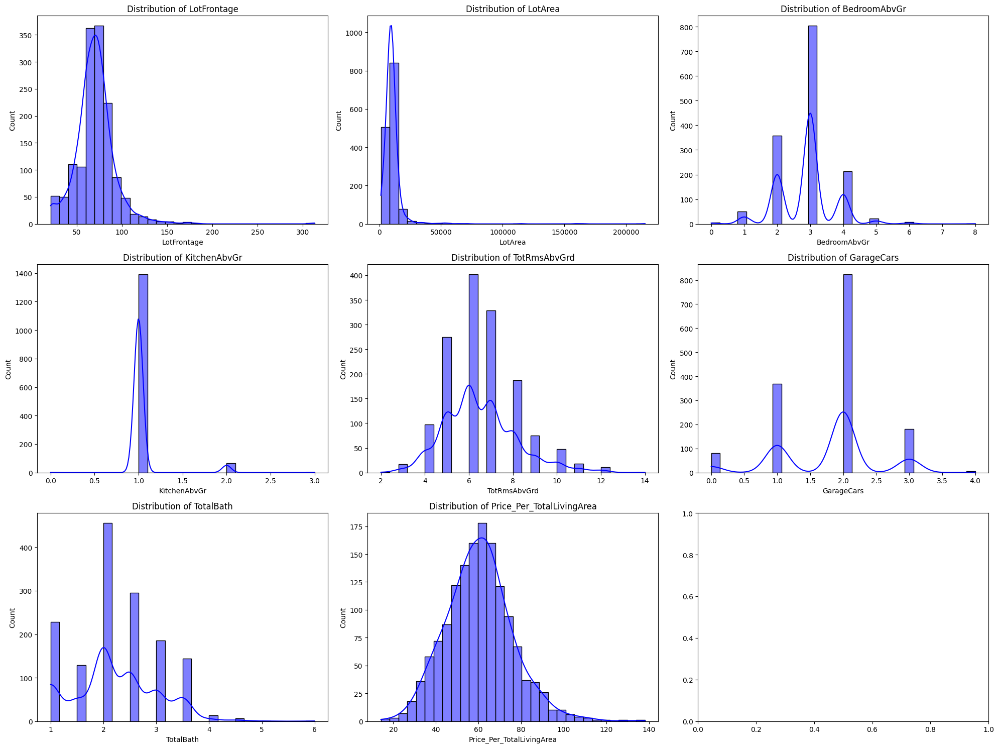

In [ ]:
cols = 3
rows = math.ceil(len(numerical_features) / cols)

fig, axes = plt.subplots(rows, cols, figsize=(20, 5 * rows))
axes = axes.flatten()

for i, feature in enumerate(numerical_features):
    sns.histplot(df[feature], kde=True, ax=axes[i], bins=30, color='blue')
    axes[i].set_title(f"Distribution of {feature}")
    axes[i].set_xlabel(feature)

plt.tight_layout()
plt.show()

## QQ Plot before Transformation

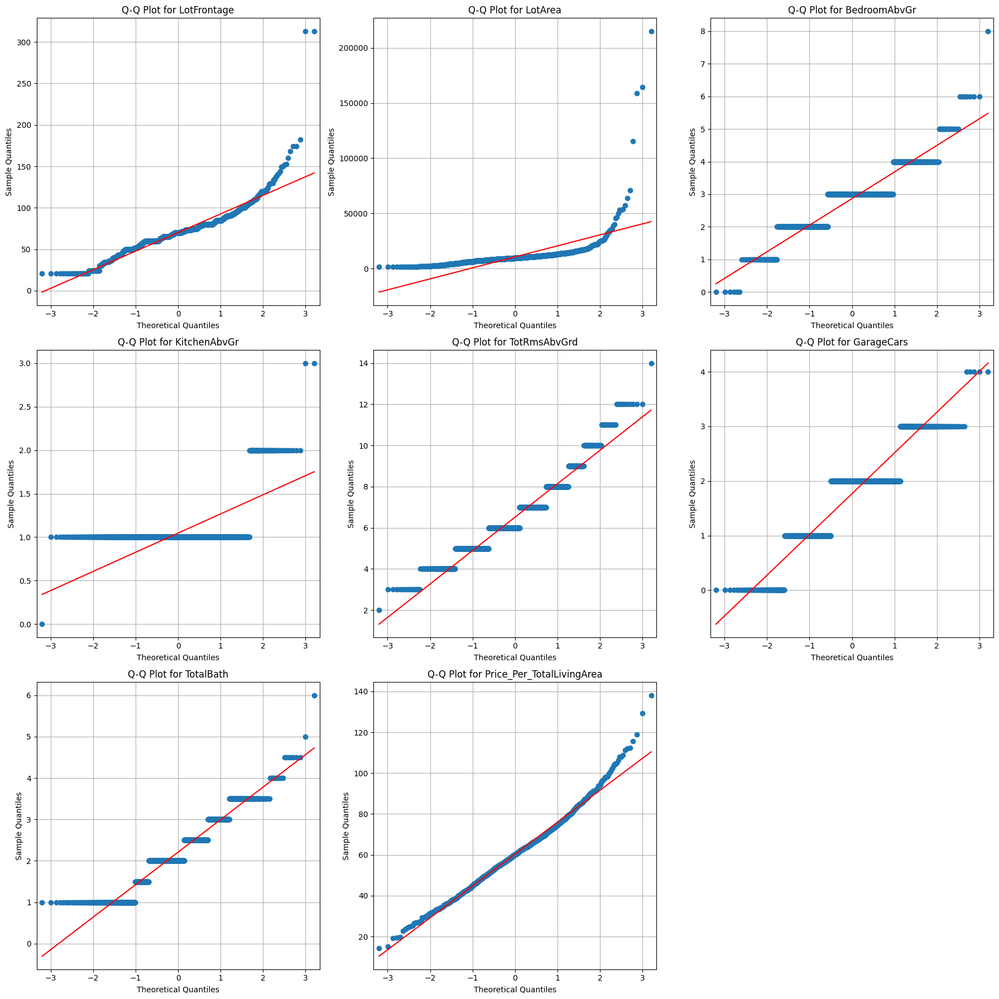

In [ ]:
def plot_qq_plots_before_log(df, features):

    num_features = len(features)
    cols = 3
    rows = -(-num_features // cols)

    fig, axes = plt.subplots(rows, cols, figsize=(18, 6 * rows))
    axes = axes.flatten()

    for i, feature in enumerate(features):
        sm.qqplot(df[feature].dropna(), line='s', ax=axes[i])
        axes[i].set_title(f"Q-Q Plot for {feature}")
        axes[i].grid()

    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

features_before_log = df[numerical_features].columns.tolist()
plot_qq_plots_before_log(df[numerical_features], features_before_log)

Before any transformations, many features such as SalePrice, LotArea, LotFrontageArea, TotalLivingArea exhibit heavy skewness, especially towards the right. Features like Price_Per_LotArea and Price_Per_TotalLivingArea illustrate a non-normal distribution with long tails. Also, features such as OpenPorchSF, EnclosedPorch and Fireplaces exhibit a significant proportion of zero values, whose presence contribute to skewness and non-normal distribution with a lack of linearity. Even when looking at the QQ plots, many features demonstrate significant deviations from the diagonal line, suggesting non-normal distributions, with extreme tail deviations. These deviations suggest that linear assumptions for features are not met.



## Transformations

In [ ]:
from scipy.stats import boxcox

In [ ]:
df_adjusted = df.copy()

In [ ]:
df_adjusted.columns

Index(['MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Neighborhood', 'YearBuilt', 'YearRemodAdd', 'BedroomAbvGr',
       'KitchenAbvGr', 'TotRmsAbvGrd', 'GarageYrBlt', 'GarageCars', 'MoSold',
       'YrSold', 'TotalBath', 'BldgType', 'HouseStyle',
       'Price_Per_TotalLivingArea'],
      dtype='object')

In [ ]:
df_adjusted.dtypes

,0
MSSubClass,object
MSZoning,object
LotFrontage,float64
LotArea,int64
Street,object
Neighborhood,object
YearBuilt,int64
YearRemodAdd,int64
BedroomAbvGr,int64
KitchenAbvGr,int64


In [ ]:
df_adjusted.head(20)

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Neighborhood,YearBuilt,YearRemodAdd,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,GarageYrBlt,GarageCars,MoSold,YrSold,TotalBath,BldgType,HouseStyle,Price_Per_TotalLivingArea
0,60,RL,65.0,8450,Pave,CollgCr,2003,2003,3,1,8,2003.0,2,2,2008,3.5,Single_Family,Multi_Family,60.964912
1,20,RL,80.0,9600,Pave,Veenker,1976,1976,3,1,6,1976.0,2,5,2007,2.5,Single_Family,Single_Family,71.909667
2,60,RL,68.0,11250,Pave,CollgCr,2001,2002,3,1,6,2001.0,2,9,2008,3.5,Single_Family,Multi_Family,62.569989
3,70,RL,60.0,9550,Pave,Crawfor,1915,1970,3,1,7,1998.0,3,2,2006,2.0,Single_Family,Multi_Family,40.768783
4,60,RL,84.0,14260,Pave,NoRidge,2000,2000,4,1,9,2000.0,3,12,2008,3.5,Single_Family,Multi_Family,56.869882
5,50,RL,85.0,14115,Pave,Mitchel,1993,1995,1,1,5,1993.0,2,10,2009,2.5,Single_Family,Single_Family,52.496329
6,20,RL,75.0,10084,Pave,Somerst,2004,2005,3,1,7,2004.0,2,8,2007,3.0,Single_Family,Single_Family,90.613932
7,60,RL,80.0,10382,Pave,NWAmes,1973,1973,3,1,7,1973.0,2,11,2009,3.5,Single_Family,Multi_Family,47.846890
8,50,RM,51.0,6120,Pave,OldTown,1931,1950,2,2,8,1931.0,2,4,2008,2.0,Single_Family,Single_Family,36.612176
9,190,RL,50.0,7420,Pave,BrkSide,1939,1950,2,2,5,1939.0,1,1,2008,2.0,Multi_Family,Single_Family,54.781801


In [ ]:
# Log Transformation for Select Features
log_transform_features = ['Price_Per_TotalLivingArea', 'LotFrontage', 'LotArea']
for feature in log_transform_features:
    df_adjusted[f'Log_{feature}'] = np.log1p(df_adjusted[feature])
    df_adjusted.drop(columns=[feature], inplace=True)  # Remove original feature

In [ ]:
# Select Remaining Numerical Features
excluded_patterns = ["Yr", "Year", "Mo", "Month"]  # exclude these datetime features

# Dynamically exclude features containing the specified patterns
remaining_numerical_features = [
    col for col in df_adjusted.select_dtypes(include=['int64', 'float64']).columns
    if not any(pattern in col for pattern in excluded_patterns)
]

# Remove the 'SalePrice' column from df_adjusted if it exists
if 'SalePrice' in df_adjusted.columns:
    df_adjusted.drop(columns=['SalePrice'], inplace=True)

# Final DataFrame after Adjustments
print("Adjusted DataFrame Info:")
print(df_adjusted.info())

# Print the remaining numerical features
print("Remaining Numerical Features:")
print(remaining_numerical_features)

Adjusted DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 19 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   MSSubClass                     1460 non-null   object 
 1   MSZoning                       1460 non-null   object 
 2   Street                         1460 non-null   object 
 3   Neighborhood                   1460 non-null   object 
 4   YearBuilt                      1460 non-null   int64  
 5   YearRemodAdd                   1460 non-null   int64  
 6   BedroomAbvGr                   1460 non-null   int64  
 7   KitchenAbvGr                   1460 non-null   int64  
 8   TotRmsAbvGrd                   1460 non-null   int64  
 9   GarageYrBlt                    1460 non-null   float64
 10  GarageCars                     1460 non-null   int64  
 11  MoSold                         1460 non-null   int64  
 12  YrSold                 

## Histogram and QQ after Transformation

In [ ]:
df_adjusted.dtypes

,0
MSSubClass,object
MSZoning,object
Street,object
Neighborhood,object
YearBuilt,int64
YearRemodAdd,int64
BedroomAbvGr,int64
KitchenAbvGr,int64
TotRmsAbvGrd,int64
GarageYrBlt,float64


In [ ]:
import scipy.stats as stats

['Log_Price_Per_TotalLivingArea', 'Log_LotFrontage', 'Log_LotArea']
['BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'GarageCars', 'TotalBath', 'Log_Price_Per_TotalLivingArea', 'Log_LotFrontage', 'Log_LotArea']


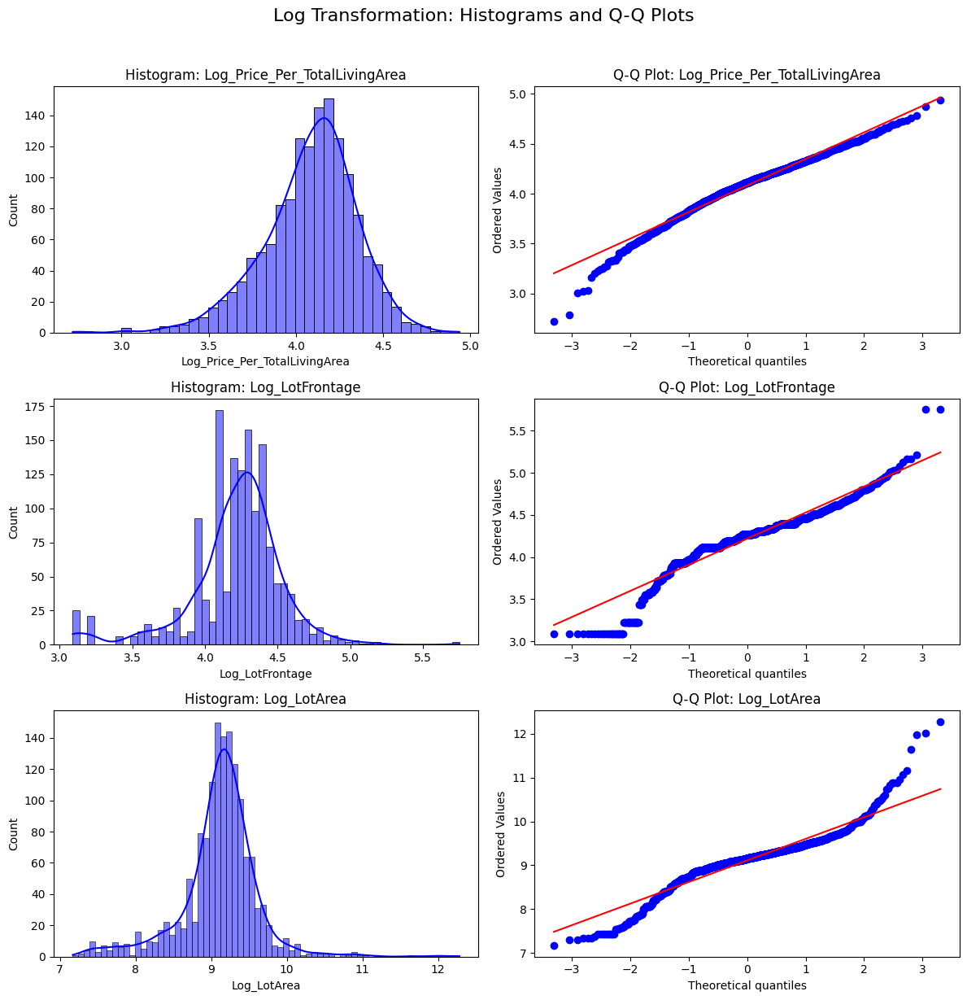

In [ ]:
def plot_histograms_and_qqplots(df, feature_list, transformation_type):

    num_features = len(feature_list)
    rows = num_features
    cols = 2

    fig, axes = plt.subplots(rows, cols, figsize=(12, 4 * rows))
    fig.suptitle(f"{transformation_type} Transformation: Histograms and Q-Q Plots", fontsize=16, y=1.02)

    for i, feature in enumerate(feature_list):
        # Histogram
        sns.histplot(df[feature].dropna(), kde=True, ax=axes[i, 0], color='blue')
        axes[i, 0].set_title(f"Histogram: {feature}")
        axes[i, 0].set_xlabel(feature)

        # Q-Q Plot
        stats.probplot(df[feature].dropna(), dist="norm", plot=axes[i, 1])
        axes[i, 1].set_title(f"Q-Q Plot: {feature}")

    plt.tight_layout()
    plt.show()


log_transformed_features = [f'Log_{col}' for col in log_transform_features]
#boxcox_transformed_features = [f'BoxCox_{col}' for col in boxcox_transform_features]
print(log_transformed_features)
#print(boxcox_transformed_features)
print(remaining_numerical_features)

# Plot histograms and Q-Q plots for each transformation type
plot_histograms_and_qqplots(df_adjusted, log_transformed_features, "Log")
#plot_histograms_and_qqplots(df_adjusted, boxcox_transformed_features, "Box-Cox")
#plot_histograms_and_qqplots(df_adjusted, z_scaled_features_final, "Z-Scaled")
#plot_histograms_and_qqplots(df_adjusted, remaining_numerical_features, "Remaining Numerical Features")

After the Log Transformation, the transformed features like Log_LotArea, Log_Price_Per_1stFlrSF, Log_Price_Per_TotalLivingArea and Log_GrLivArea appear much more symmetrical and closer to a bell shaped distribution. Meanwhile, a feature like Log_2ndFlrSF still shows non-normal distrbution and residual non-symmetry due to its heavily zero-inflated features. This makes sense as a number of properties might not have garage, basement or 2nd floor so I will retain them as they are.

Even outliers are mitigated and compressed, making sure that they will not heavily affect the analysis. The data spread becomes more even, which is better for variability. Likewise, the normality becomes more obvious, especially that the log transformed Sales price has a more balanced target variable for the latter regression models. Therefore, the log transformation did help to improve feature scaling and limits heteroscedasticity that will improve model performance and interpretation in the next phase of this project. In contrast, features with lower skewness after log transformation might be retained such as Log_1stFlrSF, Log_LotFrontage, Log_LotArea potentially impact on the affordability modeling significantly.

It is noteworthy that these improved normality helps to determine the assumptions for regression models including linearlity, normality of residuals are better satisfied. Nevertheless, there are still remaining effects of zero-inflation and outliers in some features, potentially causing skew regression results so they should be treated with caution.



## Scaling

At this step, I will apply Z-scaling to transform numerical features to have a mean of 0 and a standard deviation of 1 to ensure all features contribute equally to the model, avoiding cases of features with larger magnitudes or units from domination regarding of these aspects.

In terms of consistency across features, models like linear regression are sensitive to the scale of numerical features. In the linear models' cases, scaling helps gradient descent algorithms converge faster. Without scaling, optimization will find it challenging to find the global minimum because of uneven gradients across dimensions. Even after scaling, coefficients in linear models reflect the importance of each feature in standardized units, helping feature importance easier to compare. Scaling also help ensure penalities on coefficients to be applied uniformly for models like Ridge, Lasso and ElasticNet in the next phase. For OLS and interpretable linear models, scaling might not be required as the coefficients will adjust it. However, cross model comparison will be conducted so scaling the target might also be needed in the same method of my inputs.

In [ ]:
from sklearn.preprocessing import StandardScaler

# numerical_features = [
#     'Log_Price_Per_TotalLivingArea', 'Log_LotFrontage', 'Log_TotalBsmtSF',
#     'Log_LotArea', 'Log_1stFlrSF', 'Log_GrLivArea', 'Log_BsmtUnfSF',
#     'Log_2ndFlrSF', 'Log_GarageArea', 'Log_LotFrontage', 'Log_BsmtFinSF1'
# ]
numerical_features_scaling = [
    'Log_Price_Per_TotalLivingArea', 'BedroomAbvGr', 'KitchenAbvGr',
    'TotRmsAbvGrd', 'GarageCars', 'TotalBath'
]
#numerical_features = ['Log_Price_Per_TotalLivingArea']
scaler = StandardScaler()
df_adjusted[numerical_features_scaling] = scaler.fit_transform(df_adjusted[numerical_features_scaling])

## Correlation Matrix after Transformation

In [ ]:
# Convert 'BldgType' and 'HouseStyle' to numerical values
df_adjusted['BldgType'] = df_adjusted['BldgType'].apply(lambda x: 1 if x == 'Single_Family' else 0)  # 1 for Single_Family, 0 for Multi_Family
df_adjusted['HouseStyle'] = df_adjusted['HouseStyle'].apply(lambda x: 1 if x == 'Single_Family' else 0)  # 1 for Single_Family, 0 for Multi_Family

# Validate the conversion
print(df_adjusted[['BldgType', 'HouseStyle']].head())


   BldgType  HouseStyle
0         1           0
1         1           1
2         1           0
3         1           0
4         1           0


In [ ]:
excluded_patterns = ["Year", "Yr", "Mo", "Month"]

numerical_features = [
    col for col in df_adjusted.select_dtypes(include=['int64', 'float64']).columns
    if not any(pattern in col for pattern in excluded_patterns)
]

In [ ]:
# numerical_features = ['BedroomAbvGr', 'KitchenAbvGr', 'GarageCars', 'TotalBath', 'Log_LotArea', 'BldgType', 'HouseStyle']


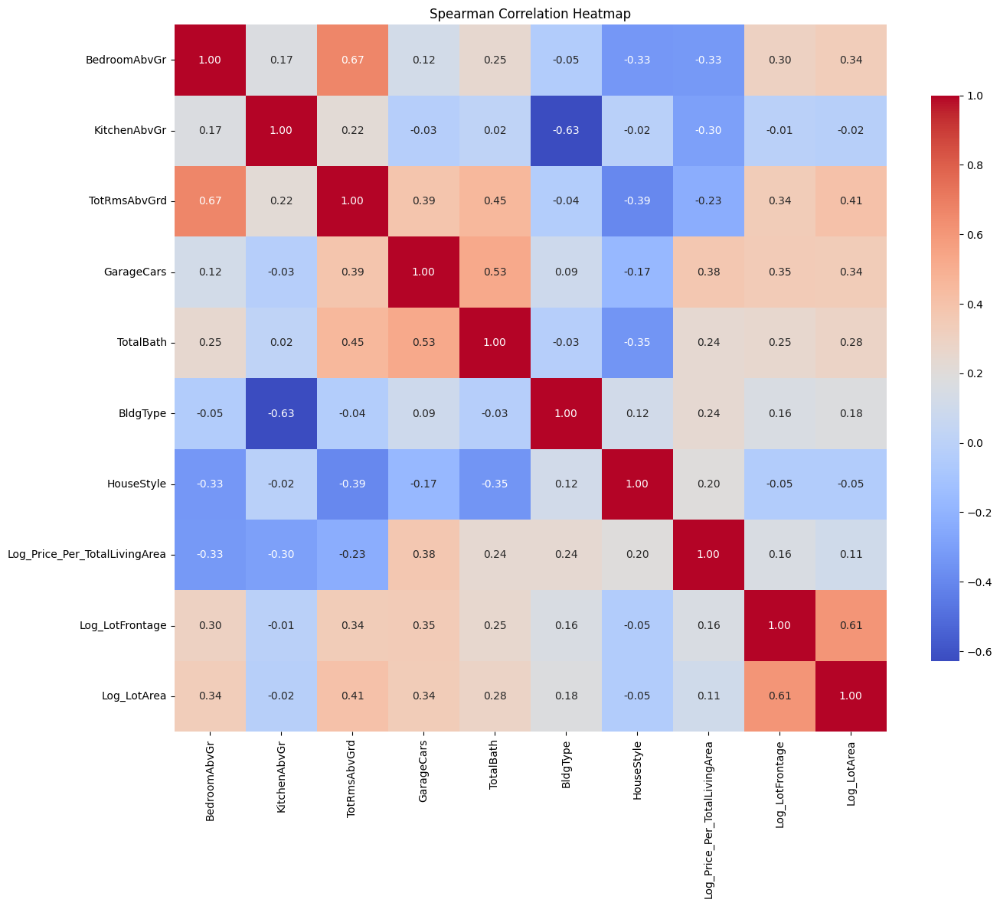

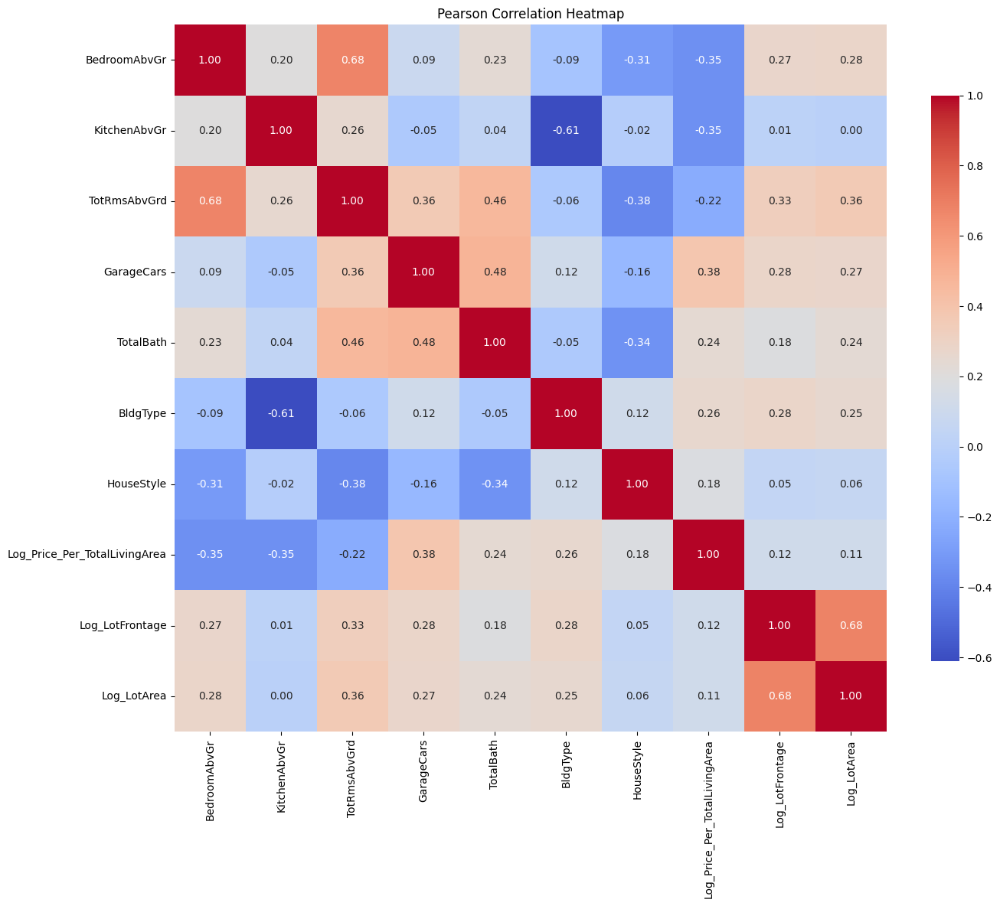

In [ ]:
# Compute Spearman and Pearson correlations
spearman_corr = df_adjusted[numerical_features].corr(method='spearman')
pearson_corr = df_adjusted[numerical_features].corr(method='pearson')

# Plot both correlation matrices

plt.figure(figsize=(15, 12))
sns.heatmap(spearman_corr, annot=True, cmap='coolwarm', fmt=".2f", cbar_kws={'shrink': 0.8})
plt.title("Spearman Correlation Heatmap")
plt.show()

plt.figure(figsize=(15, 12))
sns.heatmap(pearson_corr, annot=True, cmap='coolwarm', fmt=".2f", cbar_kws={'shrink': 0.8})
plt.title("Pearson Correlation Heatmap")
plt.show()

Looking at this new Correlation Matrix, these features has strong correlation with the other, suggesting multicollinearity. Therefore, the bolded features below will be dropped to minimize model complexity and increase interpretability.

- Log_LotArea vs **Log_LotAreaFrontage**

- Log_Total Living_Area vs **Log_GrdLivArea**

- Log_Total Living_Area vs **TotRmsAbvGrd**

- **TotRmsAbvGrd** vs BedroomsAbvGrd


There is a very low correlation between HouseStyle and BldgType, not suggesting multicollinearity, so both features will be retained for further analysis.

In [ ]:
# List of columns to drop
columns_to_drop = ['Log_GrLivArea', 'Log_LotFrontage', 'Log_2ndFlrSF']

# Drop the columns
df_adjusted.drop(columns=columns_to_drop, inplace=True, errors='ignore')

# Verify the remaining columns
print("Updated DataFrame Columns:")
print(df_adjusted.columns)

Updated DataFrame Columns:
Index(['MSSubClass', 'MSZoning', 'Street', 'Neighborhood', 'YearBuilt',
       'YearRemodAdd', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd',
       'GarageYrBlt', 'GarageCars', 'MoSold', 'YrSold', 'TotalBath',
       'BldgType', 'HouseStyle', 'Log_Price_Per_TotalLivingArea',
       'Log_LotArea'],
      dtype='object')


### Explanation for weak or no correlation

Log_TotalLivingArea with Log_Price_Per_TotalLivingArea

This feature reflects the total living area, a fundamental determinant of price and the new metric. So its low correlation makes sense.

Log_LotArea and Log_LotFrontage with Log_Price_Per_TotalLivingArea

The low positive correlation suggests that larger lot areas impact price per square foot mildly. This might reflect economies of scale, where larger lots have a insignificantly marginal impact on price per square foot.

### Explanation for moderate correlation

GarageCars with Log_Price_Per_TotalLivingArea

Garage area shows a moderately positive correlation with price per square foot. While larger garages are desirable, they may not contribute as strongly to pricing compared to living spaces as Garage capacity in terms of number of cars it can hold is more meaningful and impactful on sale price.

TotalBath with Log_Price_Per_TotalLivingArea

This features shows moderately positive correlation with the target. The fact is almost all housing properties must have at least a full bath or a half bath and buyers care about the number of bathrooms. So they do impact the sale price moderately.

Log_Price_Per_1stFlrSF with Log_Price_Per_TotalLivingArea

Price per square foot for the first floor strongly correlates with overall price per living area. This feature directly influences the target because larger or higher quality first floors generally increase the price.
The stronger Pearson correlation suggests that the relationship is more linear in this case.

Log_Price_Per_LotArea with Log_Price_Per_TotalLivingArea

This feature indicates value per land area, particularly relevant in high-demand neighborhoods. This makes sense as larger lot area tends to have larger living area.



Pearson Correlation can help to measure linear relationships between features. However, it assumes normally dsitributed data and sensitivity to outliers. So it is suited for numerical features that I have transformed to approximate normality.

Meanwhile, Spearman Correlation can help to measure monotonic relationships including linear and non-linear that it does not assume normality or linearity. So it is more robust against outliers and better for ordinal or skewed numerical data.

As my numerical features were applied with Log transformation to approximate normality and some of these features' relationships with the target might not be linear, as well as my whole data include a mixed feature types with both categorical and numerical, Spearman correlation is a more comprehensive perspective.

At the moment, as per Spearman correlation, Log_2ndFlrSF, Garage Cars have the highest positive correlation with the target at moderate levels, respectively. This is partially true in the real market as properties having 2nd floor or more space of cars in garage tend to affect the price per square feet. However,
it is not always true and does not mean that both of them should be the sole two features having the highest correlation among the selected features with the target as other factors in reality such as other space or number of rooms in the house should have more impact based on domain knowledge. Also, properties do not always have 2nd floor or garage so their existence might impact the target moderately. But as the size of the 2nd floor contributes directly to the target and suffers heavily from the zero inflation. This feature should be removed for further model simplification. Further assessment is needed to evaluate this hypothesis.

In the next phase, for features with low correlation, I will assess their importance during feature selection in regression models.





## Statistical Summary for Building Type and House Style

In [ ]:
building_type_summary = df_adjusted.groupby('BldgType').agg(
    Total_Count=('Log_Price_Per_TotalLivingArea', 'count'),
    Mean_Price=('Log_Price_Per_TotalLivingArea', 'mean'),
    Median_Price=('Log_Price_Per_TotalLivingArea', 'median'),
    Std_Dev=('Log_Price_Per_TotalLivingArea', 'std'),
    Min_Price=('Log_Price_Per_TotalLivingArea', 'min'),
    Max_Price=('Log_Price_Per_TotalLivingArea', 'max')
).reset_index()

housing_style_summary = df_adjusted.groupby('HouseStyle').agg(
    Total_Count=('Log_Price_Per_TotalLivingArea', 'count'),
    Mean_Price=('Log_Price_Per_TotalLivingArea', 'mean'),
    Median_Price=('Log_Price_Per_TotalLivingArea', 'median'),
    Std_Dev=('Log_Price_Per_TotalLivingArea', 'std'),
    Min_Price=('Log_Price_Per_TotalLivingArea', 'min'),
    Max_Price=('Log_Price_Per_TotalLivingArea', 'max')
).reset_index()

print("Building Type Summary")
print(building_type_summary)

print("\nHousing Style Summary")
print(housing_style_summary)

Building Type Summary
        BldgType  Total_Count  Mean_Price  Median_Price   Std_Dev  Min_Price  \
0   Multi_Family          126   -0.851500     -1.055851  1.041157  -3.998568   
1  Single_Family         1334    0.080427      0.171324  0.958444  -5.072465   

   Max_Price  
0   1.491372  
1   3.174538  

Housing Style Summary
      HouseStyle  Total_Count  Mean_Price  Median_Price   Std_Dev  Min_Price  \
0   Multi_Family          566   -0.224569     -0.108894  0.942645  -5.072465   
1  Single_Family          894    0.142177      0.292752  1.010215  -3.940040   

   Max_Price  
0   2.101482  
1   3.174538  


These two features can be helpful categorical features for explaining the variability in the house prices as they are strongly correlated with the target. In order to achive our goal of inference purposes, there are some hypotheses to test with single family houses having greater average prices than townhouses. Later, linear regression can be used to assess their impact on SalePrice.

Bootstrap sampling can join later to to estimate confidence intervals for mean and median prices for each category, such as 1Fam vs Twnhs.

Bayesian modeling can incorporate prior knowledge about the expected impact of these two features by using prior distributions with the observed means and standard deviations for each group of 1Fam, 1Story. Then the Bayesian infrence can update predictions when new data comes in and quantify uncertaincy in price predictions for a certain category.

## Violin plot after Log Transformation

The log transformation helps to compress the range of outliers for these features, bringing them closer to the main distribution. Likewise, it compresses the scale, making interquartile range more pronounced and showcasing the central tendency of the data. As a result, the symmetry has more balanced whisters and medians staying closer to the IQR's center as well as more uniform variability. Therefore, log transformation improve the scale consitency while tackling with skewness, outliers and model suitability.

In [ ]:
# Using a loop to identify categorical features
categorical_features = [col for col in df_adjusted.columns if df_adjusted[col].dtype in ['object', 'category']]

print(categorical_features)

['MSSubClass', 'MSZoning', 'Street', 'Neighborhood', 'BldgType', 'HouseStyle']


<ipython-input-254-c06c478a3ec1>:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
<ipython-input-254-c06c478a3ec1>:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
<ipython-input-254-c06c478a3ec1>:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
<ipython-input-254-c06c478a3ec1>:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
<ipython-input-254-c06c478a3ec1>:10: FutureWarni

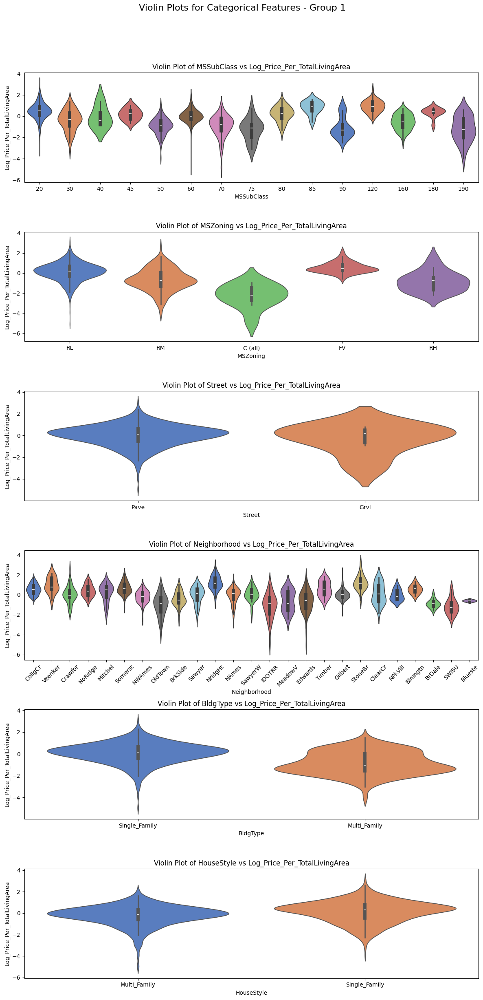

In [ ]:
# Break categorical features into chunks
chunks = [categorical_features[i:i + 10] for i in range(0, len(categorical_features), 10)]  # Group by 10 features

for chunk_index, chunk in enumerate(chunks):
    fig, axes = plt.subplots(len(chunk), 1, figsize=(12, len(chunk) * 4), sharex=False)
    fig.suptitle(f"Violin Plots for Categorical Features - Group {chunk_index + 1}", fontsize=16, y=1.02)

    for i, feature in enumerate(chunk):
        if feature in df_adjusted.columns:
            sns.violinplot(
                data=df_adjusted,
                x=feature,
                y='Log_Price_Per_TotalLivingArea',
                palette='muted',
                ax=axes[i]
            )
            axes[i].set_title(f"Violin Plot of {feature} vs Log_Price_Per_TotalLivingArea")
            axes[i].set_xlabel(feature)
            axes[i].set_ylabel('Log_Price_Per_TotalLivingArea')

            # Rotate x-axis labels if the feature is Neighborhood
            if feature == 'Neighborhood':  # Adjust based on feature names needing rotation
                axes[i].tick_params(axis='x', rotation=45)

    plt.tight_layout()
    plt.subplots_adjust(top=0.95)  # Add space for the main title
    plt.show()


## Exclude some categorical features (without explanatory power for the target) TBA

### Explanation for retaining the selected columns

As per the Violin plots:

- MSSubClass categories like 20, 60, 120, and 85 show relatively higher log price per living area, while others like 50, 190, and 75 have lower median values.

- MSZoning reflects zoning classification, directly impacting land use, building type and certainly property value or sale price or affordability. The violin plot illustrate distinct differences in the distribution of target values across zoning types. The FV (Floating Village) zoning type has the highest median price and smallest spread, suggesting it is a premium zoning classification. RL (Residential Low Density) is common but has moderate log prices. C (all) has a much lower median value with greater variability.

- Neigborhood reflects the property location, strongly associates with value and affordability, capturing socioeconomic factors, life essentials due to schooling, grocery, shopping, employment , commuting and desirability. Neighborhoods like NoRidge, NridgHt and StoneBr exhibit the highest log prices and relatively smaller spreads. Lower-performing neighborhoods like IDOTRR, MeadowV and BrDale show significantly lower log prices. Some neighborhoods have more variability, such as OldTown and Sawyer, indicating mixed property values.

- BldgType and HouseStyle capture building type and architectural style which affect market segment, intended use, aesthetic value and buyer preferences, as well as price and affordability. 1Fam (single-family homes) have the highest median price and a smaller spread. 2fmCon (two-family conversions) and Duplex have lower medians and more variability, indicating mixed values. TwnhsE (townhouse-end unit) performs better than standard Townhouses. Therefore, single-family homes dominate price performance, while other building types like Duplexes and 2-family types tend to have lower prices. Meanwhile, 1Story and 2Story styles show relatively higher prices, with a tighter distribution in 1Story. Styles like 1.5Unf and 2.5Unf show lower medians and larger spreads, indicating lower-valued properties. SLvl (Split Level) and SFoyer styles also show moderate to high values as properties with splitting and foyer designs tend to be more expensive.

- GarageCars (numerical) represents the garage capacity which is usable for multi-car households, adding more cost for sale price but reducing costs of renting parking space and dependence on a sole car driver.

- PaveDrive represents if the driveway is paved, impacting usability and exterior appeal.

In summary, categorical features like MSZoning, Neighborhood, and HouseStyle strongly influence price per living area. Neighborhood has the largest impact with significant variability across different categories. Features like Street and BldgType highlight distinctions between premium and lower-valued properties.

## VIF for further Feature Selection

I will use VIF analysis to reduce the number of predictors as the encoding can explode the number of data shape.

In [ ]:
categorical_features = df_adjusted.select_dtypes(include=['object']).columns
print("Categorical Features to Encode:")
print(categorical_features)

Categorical Features to Encode:
Index(['MSSubClass', 'MSZoning', 'Street', 'Neighborhood', 'BldgType',
       'HouseStyle'],
      dtype='object')


In [ ]:
print(df_adjusted.isnull().sum())  # Check for missing values
print(df_adjusted.describe(include='all'))  # Check for unexpected values

MSSubClass                       0
MSZoning                         0
Street                           0
Neighborhood                     0
YearBuilt                        0
YearRemodAdd                     0
BedroomAbvGr                     0
KitchenAbvGr                     0
TotRmsAbvGrd                     0
GarageYrBlt                      0
GarageCars                       0
MoSold                           0
YrSold                           0
TotalBath                        0
BldgType                         0
HouseStyle                       0
Log_Price_Per_TotalLivingArea    0
Log_LotArea                      0
dtype: int64
        MSSubClass MSZoning Street Neighborhood    YearBuilt  YearRemodAdd  \
count       1460.0     1460   1460         1460  1460.000000   1460.000000   
unique        15.0        5      2           25          NaN           NaN   
top           20.0       RL   Pave        NAmes          NaN           NaN   
freq         536.0     1151   1454          2

In [ ]:
# Identify features to exclude based on substrings
excluded_patterns = ["Yr", "Year", "Mo", "Month", "_Binary"]

# Filter out features that contain any of the excluded patterns
df_adjusted = df_adjusted.loc[:, ~df_adjusted.columns.str.contains('|'.join(excluded_patterns), case=False)]

# Verify the remaining features
print(f"Remaining features for VIF calculation: {df_adjusted.columns.tolist()}")

# Ensure no infinite or NaN values
df_adjusted.replace([np.inf, -np.inf], np.nan, inplace=True)
df_adjusted.dropna(inplace=True)  # Alternatively, fill missing values

Remaining features for VIF calculation: ['MSSubClass', 'MSZoning', 'Street', 'Neighborhood', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'GarageCars', 'TotalBath', 'BldgType', 'HouseStyle', 'Log_Price_Per_TotalLivingArea', 'Log_LotArea']


<ipython-input-257-ac8b379d5b51>:11: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_adjusted.replace([np.inf, -np.inf], np.nan, inplace=True)
<ipython-input-257-ac8b379d5b51>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_adjusted.replace([np.inf, -np.inf], np.nan, inplace=True)
<ipython-input-257-ac8b379d5b51>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_adjusted.dropna(inpl

In [ ]:
df_adjusted.dtypes

,0
MSSubClass,int64
MSZoning,object
Street,object
Neighborhood,object
BedroomAbvGr,float64
KitchenAbvGr,float64
TotRmsAbvGrd,float64
GarageCars,float64
TotalBath,float64
BldgType,object


In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

numerical_features = df_adjusted.select_dtypes(include=["float64", "int64"]).columns
df_numerical = df_adjusted[numerical_features]

# Calculate VIF for filtered dataset
vif_data = pd.DataFrame()
vif_data["feature"] = df_numerical.columns
vif_data["VIF"] = [variance_inflation_factor(df_numerical.values, i) for i in range(df_numerical.shape[1])]
print(vif_data)
# high_vif_features = vif_data[vif_data["VIF"] > 10]
# print("Features with high VIF (greater than 10):")
# print(high_vif_features)

                         feature       VIF
0                     MSSubClass  3.117901
1                   BedroomAbvGr  2.064011
2                   KitchenAbvGr  1.252601
3                   TotRmsAbvGrd  2.668322
4                     GarageCars  1.665397
5                      TotalBath  1.689168
6  Log_Price_Per_TotalLivingArea  1.791759
7                    Log_LotArea  2.935190


As per the VIF analysis, Log_TotalLivingArea, MSSubClass and Log_LotArea show moderate multicollinearity (VIF > 3). BedroomAbvGr, KitchenAbvGr and GarageCars are well-behaved predictors (VIF > 2) and can remain in the model. As these features show VIF < 10, which is acceptable and not a considerably high multicollinearity in general, I will retain them for latter analysis. In the next phase, I will conduct further models and regularizations to check their relationships with the target if exclusion of any of them is necessary or not.

## Feature Encoding for categorical features TBA

Feature Encoding is necessary as categorical features need to be treated to convert into numerical representations, such as with one hot encoding.

In [ ]:
df_adjusted.dtypes

,0
MSSubClass,int64
MSZoning,object
Street,object
Neighborhood,object
BedroomAbvGr,float64
KitchenAbvGr,float64
TotRmsAbvGrd,float64
GarageCars,float64
TotalBath,float64
BldgType,object


In [ ]:
# Define columns to exclude based on patterns
columns_to_exclude = ["Year", "Yr", "Mo", "Month", "_Binary", "_NonZero"]

# Identify categorical features
categorical_features = df_adjusted.select_dtypes(include=['object']).columns

# Filter out columns with "Year", "Yr", "Mo", or "Month_Binary" from the DataFrame
columns_to_drop = [col for col in df_adjusted.columns if any(excluded in col for excluded in columns_to_exclude)]
df_adjusted_filtered = df_adjusted.drop(columns=columns_to_drop, errors="ignore")

# Identify features to treat as categorical explicitly (e.g., numerical features treated as categories)
#explicit_categorical_features = ["BsmtFullBath", "BsmtHalfBath", "BedroomAbvGr", "KitchenAbvGr"] # not including them anymore
explicit_categorical_features = []

# Cast these features to category type
for feature in explicit_categorical_features:
    if feature in df_adjusted_filtered.columns:
        df_adjusted_filtered[feature] = df_adjusted_filtered[feature].astype('category')

# Combine the existing and explicit categorical features for encoding
all_categorical_features = list(categorical_features) + explicit_categorical_features

# Filter to only include features present in the updated DataFrame
all_categorical_features = [col for col in all_categorical_features if col in df_adjusted_filtered.columns]

# Perform one-hot encoding on categorical features
df_adjusted_encoded = pd.get_dummies(
    df_adjusted_filtered,
    columns=all_categorical_features,
    drop_first=True
)

# Convert any boolean columns to numerical (True -> 1, False -> 0)
boolean_columns = df_adjusted_encoded.select_dtypes(include=['bool']).columns
df_adjusted_encoded[boolean_columns] = df_adjusted_encoded[boolean_columns].astype(int)

print("Categorical Features (One-Hot Encoded):")
print(all_categorical_features)
print(f"Dataset after encoding and boolean adjustment: {df_adjusted_encoded.shape}")

Categorical Features (One-Hot Encoded):
['MSZoning', 'Street', 'Neighborhood', 'BldgType', 'HouseStyle']
Dataset after encoding and boolean adjustment: (1460, 39)


In [ ]:
df_adjusted_encoded.head()

,MSSubClass,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,GarageCars,TotalBath,Log_Price_Per_TotalLivingArea,Log_LotArea,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,BldgType_Single_Family,HouseStyle_Single_Family
0,60,0.163779,-0.211454,0.912210,0.311725,1.642256,0.163740,9.042040,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
1,20,0.163779,-0.211454,-0.318683,0.311725,0.368581,0.769218,9.169623,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1
2,60,0.163779,-0.211454,-0.318683,0.311725,1.642256,0.258936,9.328212,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
3,70,0.163779,-0.211454,0.296763,1.650307,-0.268257,-1.304491,9.164401,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
4,60,1.390023,-0.211454,1.527656,1.650307,1.642256,-0.090773,9.565284,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0


In [ ]:
df_adjusted_encoded.shape

(1460, 39)

In [ ]:
df_adjusted_encoded.columns

Index(['MSSubClass', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd',
       'GarageCars', 'TotalBath', 'Log_Price_Per_TotalLivingArea',
       'Log_LotArea', 'MSZoning_FV', 'MSZoning_RH', 'MSZoning_RL',
       'MSZoning_RM', 'Street_Pave', 'Neighborhood_Blueste',
       'Neighborhood_BrDale', 'Neighborhood_BrkSide', 'Neighborhood_ClearCr',
       'Neighborhood_CollgCr', 'Neighborhood_Crawfor', 'Neighborhood_Edwards',
       'Neighborhood_Gilbert', 'Neighborhood_IDOTRR', 'Neighborhood_MeadowV',
       'Neighborhood_Mitchel', 'Neighborhood_NAmes', 'Neighborhood_NPkVill',
       'Neighborhood_NWAmes', 'Neighborhood_NoRidge', 'Neighborhood_NridgHt',
       'Neighborhood_OldTown', 'Neighborhood_SWISU', 'Neighborhood_Sawyer',
       'Neighborhood_SawyerW', 'Neighborhood_Somerst', 'Neighborhood_StoneBr',
       'Neighborhood_Timber', 'Neighborhood_Veenker', 'BldgType_Single_Family',
       'HouseStyle_Single_Family'],
      dtype='object')

In [ ]:
df_adjusted_encoded.dtypes

,0
MSSubClass,int64
BedroomAbvGr,float64
KitchenAbvGr,float64
TotRmsAbvGrd,float64
GarageCars,float64
TotalBath,float64
Log_Price_Per_TotalLivingArea,float64
Log_LotArea,float64
MSZoning_FV,int64
MSZoning_RH,int64


In [ ]:
df_adjusted_encoded.head()

,MSSubClass,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,GarageCars,TotalBath,Log_Price_Per_TotalLivingArea,Log_LotArea,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,BldgType_Single_Family,HouseStyle_Single_Family
0,60,0.163779,-0.211454,0.912210,0.311725,1.642256,0.163740,9.042040,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
1,20,0.163779,-0.211454,-0.318683,0.311725,0.368581,0.769218,9.169623,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1
2,60,0.163779,-0.211454,-0.318683,0.311725,1.642256,0.258936,9.328212,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
3,70,0.163779,-0.211454,0.296763,1.650307,-0.268257,-1.304491,9.164401,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
4,60,1.390023,-0.211454,1.527656,1.650307,1.642256,-0.090773,9.565284,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0


## Lmplot Log Transformation

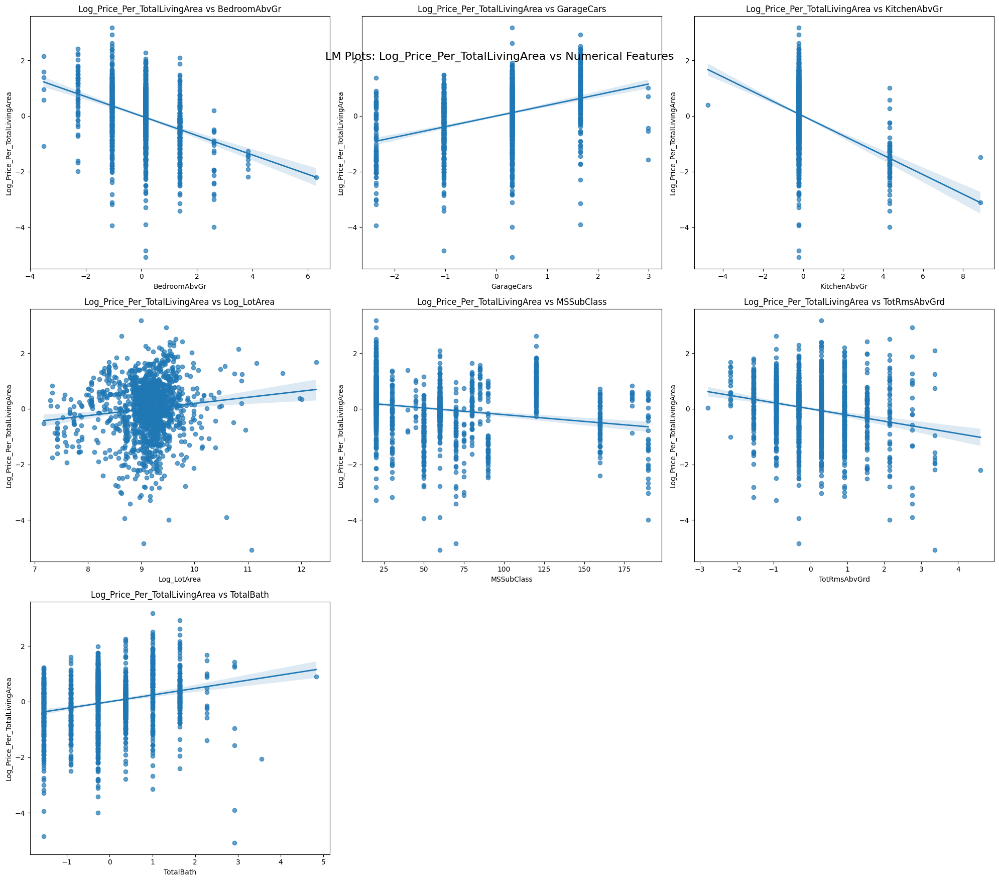

In [ ]:
def plot_lmplots_log(data, target="Log_Price_Per_TotalLivingArea"):
    # Identify all numerical features, including "Log_" and ordinary features
    numerical_features = data.select_dtypes(include=["float64", "int64"]).columns.difference([target, "Id"])

    num_features = len(numerical_features)
    cols = 3  # Number of columns for subplots
    rows = math.ceil(num_features / cols)  # Calculate rows based on number of features

    fig, axes = plt.subplots(rows, cols, figsize=(20, 6 * rows))
    axes = axes.flatten()  # Flatten axes for easier iteration

    for i, feature in enumerate(numerical_features):
        sns.regplot(
            data=data,
            x=feature,
            y=target,
            ax=axes[i],
            scatter_kws={"alpha": 0.7},  # Adjust scatter plot opacity
            line_kws={"lw": 2},         # Adjust regression line width
        )
        axes[i].set_title(f"{target} vs {feature}")
        axes[i].set_xlabel(feature)
        axes[i].set_ylabel(target)

    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    fig.suptitle("LM Plots: Log_Price_Per_TotalLivingArea vs Numerical Features", fontsize=16, y=0.92)
    plt.tight_layout()
    plt.show()

# Combine all numerical features, including "Log_" and ordinary ones
numerical_features_all = [
    col for col in df_adjusted.select_dtypes(include=["float64", "int64"]).columns
    if col != "Log_Price_Per_TotalLivingArea" and col != "Id"
]

numerical_df_adjusted_all = df_adjusted[numerical_features_all + ["Log_Price_Per_TotalLivingArea"]]

plot_lmplots_log(numerical_df_adjusted_all, target="Log_Price_Per_TotalLivingArea")

**Strong Predictors**:

GarageCars, TotalBath and potentially Log_LotArea have meaningful positive relationships with the target variable.

Negative Predictors:

BedroomAbvGr, KitchenAbvGr and Log_TotalLivingArea have negative relationships, suggesting diminishing returns or inefficiencies.

**Weak Predictors**:

MSSubClass and Log_1stFlrSF show weak linear trends and scatter.

In the next steps, I will evaluate thesize-related features (Log_1stFlrSF, Log_TotalLivingArea, Log_LotArea) if any of them should be removed to simplify the model. Further investigation about non-linear effects for features like Log_TotalLivingArea or BedroomAbvGr might be also necessary. Also, based on the lmplots, I can retain strong predictors like GarageCars and TotalBath. If time allows, testing interaction terms for weak predictors using OLS regression can be done after optimizing the modelling and find the most optimal model defining the most significant features impacting the target.

## Save data

In [ ]:
df_adjusted_encoded.to_csv("/content/drive/My Drive/Colab Notebooks/Harvard/CSCI E-83/Project/proposal data 2.csv", index=False)

# Methods of Modelling

My primary approach for modeling will concentrate on leveraging the Ordinary Least Squares (OLS) regression and ElasticNet regularization to analyze the relationships between the housing features and Sales Price. This will ultimately determine the most significant factors for housing affordability and sales price while concerning the issues from multicollinearity and overfitting.

## Feature Selection and Interactions

All features in my dataset will go through the same evaluation of correlation matrix before and after log transformation, as completed above, to identify significant predictors. I already saw features having low correlation or low predictive power on the target feature so they will be excluded in the next phase to fit the models. Those features with skewness due to their dominant single values, as experienced from the previous statistical plots, might be put into consideration for latter exclusion. Outliers will also be treated by exclusion iteratively to avoid overfitting and enhance individual features' influence without bias. Another aspect of analysis I have been considering will be executed is about interactions, for example, those between significant predictors: Building Type and Above Ground Living Area. Those terms can be explored to understand better the relationships with nuances, and thereforem enhance the ability of the tested models to reflect the dynamics of housing features.

## Model Selection

I will employ both OLS regression and Elastic regularization to conduct feature selection. OLS regression can provide crucial metrics, for example, p-value of coefficients, F-statistic and adjusted R^2 to evaluate the individual predictors' significance on the model and the general fitting. Then, insignificant features will be excluded iteratively to minimize model computation and maximize model interpretability. Besides, ElasticNet regularization will play a significant role in my project to balance the feature selection and multicollinearity wit a combination of Lasso L1 and Ridge L2 penalities. I find it important for more enhancement in next phase to add a tuning step of regularization parameters will be made with cross-validation techniques to choose the optimal set of features.

## Diagnostics

After generating the first model fitting, I will use Influence Plot to determine data points with high leverage and influence which impact the model disproportionately. These points can be outliers that require removal to refit the model. Then, other plots such as QQ and Residual vs Predicted values will also be used again to assess the assumptions of normality, homoscedasticity and linearity.

## Bootstrapping

I will apply the bootstrap resampling to calculate the confidence intervals for the coefficients which can reduce the influence of variability in data. Therefore, this method can help me ensure stability and robustness of feature coefficients and effects on the target.

## Bayesian Analysis

After completing previous steps in the next phase with regression methods, I will apply Bayesian models to estimate the posterior distributions of crucial predictors. Probabilistic insights can be drawn for me to determine feature's influence and incorporate prior domain knowledge. For features like Neighborhood or HouseStyle, Bayesian models can estimate group-level effects while incorporating uncertainty at each level.

I will specify priors with hierarchical priors to reflect nested structures for features like HouseStyle or Neighborhood. Markov Chain Monte Carlo (MCMC) or Hamiltonian Monte Carlo (HMC) can come into help me estimate posterior distributions. The I will analyze posterior distributions to capture the effect size and uncertainty for each predictor, as well as group-specific effects on differences in price by neighborhood. At last, this approach will provide credible intervals to evaluate the range of true parameter values.

## Hierachical Models

In the next phase, if time allows, I will implement hierarchical (multi-level) models for features such as HouseStyle, BldgType and Neighborhood given their contextual and hierarchical nature. It seems to me that Hierarchical models are particularly suitable for features with a nested or grouped structure, where data points within the same group are likely to share some common characteristics as top candidates for these models.

Regarding Neighborhood, homes within the same neighborhood likely share similar pricing influences due to location-specific factors like school districts, accessibility, or crime rates. In this dataset, I have only name values of this feature without further information but still, a hierarchical model will allow to account for neighborhood-level variability, such as some neighborhoods consistently having higher or lower prices.

Furthermore, different house styles, including those with high demand such as 1Story, 2Story influence design preferences and construction costs, impacting buyer perception and pricing. Therefore, by grouping homes based on HouseStyle, the model can account for style-specific effects.

Likewise, buildings classified as detached 1Fam or shared walls like Duplex may have distinct pricing structures.
Hierarchical modeling helps isolate group-level effects for building type.

In doing so, I will group the data by these features and use group-level intercepts and slopes to capture shared variance within each group. With random interceps, it can account for baseline differences across these groups. I will also try random slopes if possbile to capture group-specific variations in relationships. These models can help me to quantify between-group variability and assess the within-group predictors, like variability in prices across neighborhoods, like how living area affects price differently within a neighborhood. This approach will bring insights into the relative importance of group-level effects on housing affordability.

# Part 2: MODELLING

### **Expected Outcomes**


The project will provide quantitative insights, practical applications and validation. It will help to identify the most signifcant features impacting sales price and affordability with probabilistic insights into the impact of key features, to recommend buyers on certain features to pay more attention when buying within budgets and to valdidate the robustness of statistical findings based on confidence intervals to reduce uncertainty.

In [ ]:
df_adjusted_encoded = pd.read_csv("/content/drive/My Drive/Colab Notebooks/Harvard/CSCI E-83/Project/proposal data 2.csv")

In [ ]:
df_adjusted_encoded.head()

,MSSubClass,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,GarageCars,TotalBath,Log_Price_Per_TotalLivingArea,Log_LotArea,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,BldgType_Single_Family,HouseStyle_Single_Family
0,60,0.163779,-0.211454,0.912210,0.311725,1.642256,0.163740,9.042040,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
1,20,0.163779,-0.211454,-0.318683,0.311725,0.368581,0.769218,9.169623,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1
2,60,0.163779,-0.211454,-0.318683,0.311725,1.642256,0.258936,9.328212,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
3,70,0.163779,-0.211454,0.296763,1.650307,-0.268257,-1.304491,9.164401,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
4,60,1.390023,-0.211454,1.527656,1.650307,1.642256,-0.090773,9.565284,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0


In [ ]:
df_adjusted_encoded.dtypes

,0
MSSubClass,int64
BedroomAbvGr,float64
KitchenAbvGr,float64
TotRmsAbvGrd,float64
GarageCars,float64
TotalBath,float64
Log_Price_Per_TotalLivingArea,float64
Log_LotArea,float64
MSZoning_FV,int64
MSZoning_RH,int64


In [ ]:
df_adjusted_encoded.shape

(1460, 39)

In [ ]:
df.shape

(1460, 19)

In [ ]:
df['HouseStyle'].unique()

array(['Multi_Family', 'Single_Family'], dtype=object)

In [ ]:
df['BldgType'].unique()

array(['Single_Family', 'Multi_Family'], dtype=object)

In [ ]:
# List of features to cast as categorical
features_to_cast = [
    'MSSubClass', 'MSZoning_FV', 'MSZoning_RH', 'MSZoning_RL', 'MSZoning_RM',
    'Street_Pave', 'Neighborhood_Blueste', 'Neighborhood_BrDale', 'Neighborhood_BrkSide',
    'Neighborhood_ClearCr', 'Neighborhood_CollgCr', 'Neighborhood_Crawfor', 'Neighborhood_Edwards',
    'Neighborhood_Gilbert', 'Neighborhood_IDOTRR', 'Neighborhood_MeadowV', 'Neighborhood_Mitchel',
    'Neighborhood_NAmes', 'Neighborhood_NPkVill', 'Neighborhood_NWAmes', 'Neighborhood_NoRidge',
    'Neighborhood_NridgHt', 'Neighborhood_OldTown', 'Neighborhood_SWISU', 'Neighborhood_Sawyer',
    'Neighborhood_SawyerW', 'Neighborhood_Somerst', 'Neighborhood_StoneBr', 'Neighborhood_Timber',
    'Neighborhood_Veenker', 'BldgType_Single_Family', 'HouseStyle_Single_Family'
]

# Cast the specified features to categorical
for feature in features_to_cast:
    df_adjusted_encoded[feature] = df_adjusted_encoded[feature].astype('category')

# Verify the changes
print(df_adjusted_encoded.dtypes)

MSSubClass                       category
BedroomAbvGr                      float64
KitchenAbvGr                      float64
TotRmsAbvGrd                      float64
GarageCars                        float64
TotalBath                         float64
Log_Price_Per_TotalLivingArea     float64
Log_LotArea                       float64
MSZoning_FV                      category
MSZoning_RH                      category
MSZoning_RL                      category
MSZoning_RM                      category
Street_Pave                      category
Neighborhood_Blueste             category
Neighborhood_BrDale              category
Neighborhood_BrkSide             category
Neighborhood_ClearCr             category
Neighborhood_CollgCr             category
Neighborhood_Crawfor             category
Neighborhood_Edwards             category
Neighborhood_Gilbert             category
Neighborhood_IDOTRR              category
Neighborhood_MeadowV             category
Neighborhood_Mitchel             c

## OLS Regression

### 1/ Initial OLS regression after log transformation

In [ ]:
import statsmodels.api as sm

# Prepare data
X = df_adjusted_encoded.drop(columns=["Log_Price_Per_TotalLivingArea"])
y = df_adjusted_encoded["Log_Price_Per_TotalLivingArea"]

# Add constant for intercept
X = sm.add_constant(X)

# Fit OLS regression
model = sm.OLS(y, X).fit()

# Print the summary
print(model.summary())

# Extract p-values and filter insignificant features (p-value >= 0.05)
p_values = model.pvalues
insignificant_features = p_values[p_values >= 0.05].index.tolist()

# Remove the constant term from the list
insignificant_features = [feature for feature in insignificant_features if feature != 'const']

print("\nInsignificant Features (p-value >= 0.05):")
print(insignificant_features)

                                  OLS Regression Results                                 
Dep. Variable:     Log_Price_Per_TotalLivingArea   R-squared:                       0.597
Model:                                       OLS   Adj. R-squared:                  0.586
Method:                            Least Squares   F-statistic:                     55.40
Date:                           Wed, 18 Dec 2024   Prob (F-statistic):          1.47e-249
Time:                                   21:54:30   Log-Likelihood:                -1408.2
No. Observations:                           1460   AIC:                             2894.
Df Residuals:                               1421   BIC:                             3101.
Df Model:                                     38                                         
Covariance Type:                       nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
-------

Mean of residuals: -9.295456337683502e-16
RMS of residuals: 0.6348191084361903
Influential Points (indices): [   3    5   17   21   30   48   52   93  125  165  178  185  250  268
  291  307  335  341  344  348  363  371  375  383  398  410  420  461
  462  470  472  495  520  523  529  543  557  582  588  632  634  635
  636  649  666  671  676  685  688  710  711  713  724  728  738  761
  764  803  812  828  849  868  898  913  915  942  955  968  971 1017
 1030 1046 1048 1061 1062 1068 1129 1130 1153 1163 1173 1181 1184 1186
 1190 1206 1216 1236 1267 1298 1324 1325 1383 1388 1396 1415 1431 1432
 1449 1452 1453]
Number of Influential Points: 101


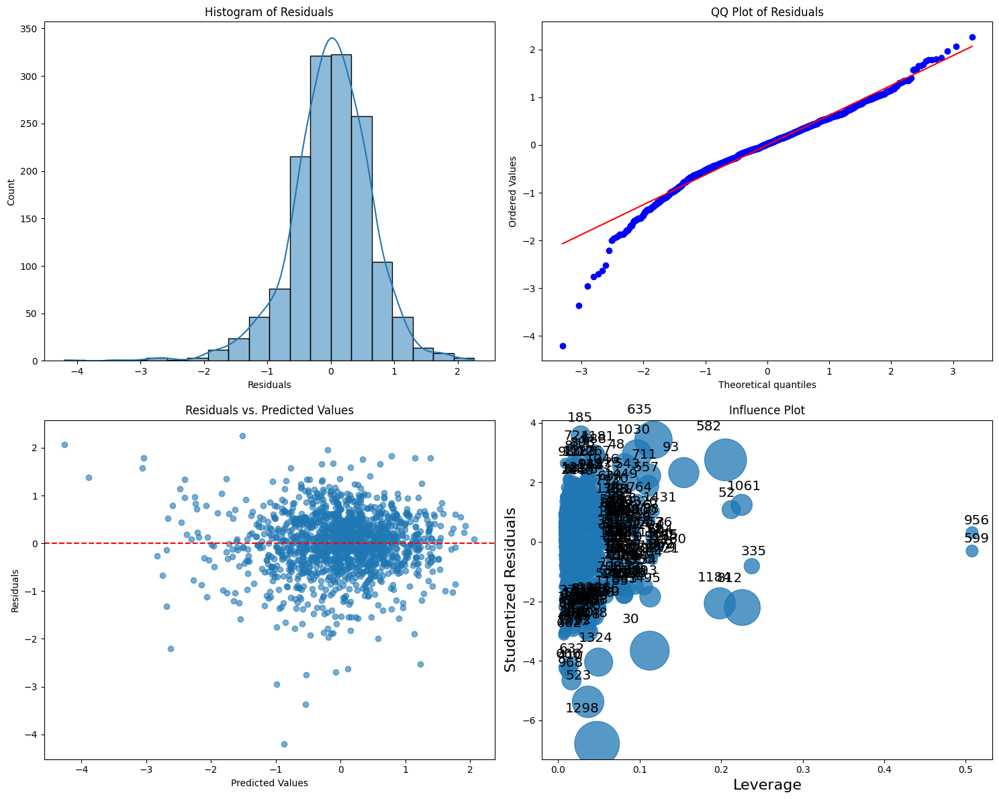

In [ ]:
import scipy.stats as stats
from statsmodels.graphics.regressionplots import influence_plot
import statsmodels.api as sm

# Calculate residuals
residuals = model.resid

# Calculate the mean and root mean square (RMS) of the residuals
mean_residuals = np.mean(residuals)
rms_residuals = np.sqrt(np.mean(residuals**2))
print("Mean of residuals:", mean_residuals)
print("RMS of residuals:", rms_residuals)

# Create subplots for residual diagnostics
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

# Histogram of residuals
sns.histplot(residuals, kde=True, bins=20, ax=axes[0, 0])
axes[0, 0].set_title("Histogram of Residuals")
axes[0, 0].set_xlabel("Residuals")

# QQ-Normal plot of residuals
stats.probplot(residuals, dist="norm", plot=axes[0, 1])
axes[0, 1].set_title("QQ Plot of Residuals")

# Residual plot: residuals vs. predicted values
predicted_values = model.fittedvalues
axes[1, 0].scatter(predicted_values, residuals, alpha=0.6)
axes[1, 0].axhline(0, color='red', linestyle='--')
axes[1, 0].set_title("Residuals vs. Predicted Values")
axes[1, 0].set_xlabel("Predicted Values")
axes[1, 0].set_ylabel("Residuals")

# Influence plot
influence = model.get_influence()
cooks_d = influence.cooks_distance[0]  # Extract Cook's Distance
threshold = 4 / len(model.resid)  # Common threshold for Cook's Distance

# Identify influential points
influential_points = np.where(cooks_d > threshold)[0]
print("Influential Points (indices):", influential_points)
print("Number of Influential Points:", len(influential_points))

# Influence plot visualization
influence_plot(model, ax=axes[1, 1], criterion="cooks")
axes[1, 1].set_title("Influence Plot")

plt.tight_layout()
plt.show()

### 2/ OLS Model after removing influential points

In [ ]:
df_adjusted_encoded.shape

(1460, 39)

In [ ]:
df_cleaned = df_adjusted_encoded.drop(index=influential_points)
df_cleaned.shape

(1359, 39)

In [ ]:
import statsmodels.api as sm

def get_significant_features(model, threshold=0.05):
    """
    Extract significant and insignificant features based on p-values.
    """
    pvalues = model.pvalues
    significant_features = pvalues[pvalues < threshold].index.tolist()
    insignificant_features = pvalues[pvalues >= threshold].index.tolist()

    return significant_features, insignificant_features

# Remove influential points from the dataset
df_cleaned = df_adjusted_encoded.drop(index=influential_points)

# Refit the model with the cleaned dataset
X_cleaned = df_cleaned.drop(columns=["Log_Price_Per_TotalLivingArea"])
y_cleaned = df_cleaned["Log_Price_Per_TotalLivingArea"]

# Add constant and fit the model again
X_cleaned = sm.add_constant(X_cleaned)
model_cleaned = sm.OLS(y_cleaned, X_cleaned).fit()

# Print the summary
print(model_cleaned.summary())

# Extract significant and insignificant features
significant_features_OLS, insignificant_features_OLS = get_significant_features(model_cleaned)

# Print results
print("Significant Features:")
print(significant_features_OLS)
print("\nInsignificant Features:")
print(insignificant_features_OLS)

                                  OLS Regression Results                                 
Dep. Variable:     Log_Price_Per_TotalLivingArea   R-squared:                       0.684
Model:                                       OLS   Adj. R-squared:                  0.675
Method:                            Least Squares   F-statistic:                     77.26
Date:                           Wed, 18 Dec 2024   Prob (F-statistic):          1.00e-299
Time:                                   21:54:45   Log-Likelihood:                -1004.6
No. Observations:                           1359   AIC:                             2085.
Df Residuals:                               1321   BIC:                             2283.
Df Model:                                     37                                         
Covariance Type:                       nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
-------

Mean of residuals: 8.128237679036393e-15
RMS of residuals: 0.5067488010462338
Cook's Distance Threshold: 0.0029
Influential Points (Indices): [   7   41   62   81  105  156  230  310  313  344  350  395  407  413
  458  484  523  614  618  630  634  642  656  662  689  721  744  759
  783  812  887  954  967  969 1010 1038 1047 1050 1065 1084 1089 1090
 1100 1147 1156 1190 1208 1270 1288 1292 1310]
Number of Influential Points: 51


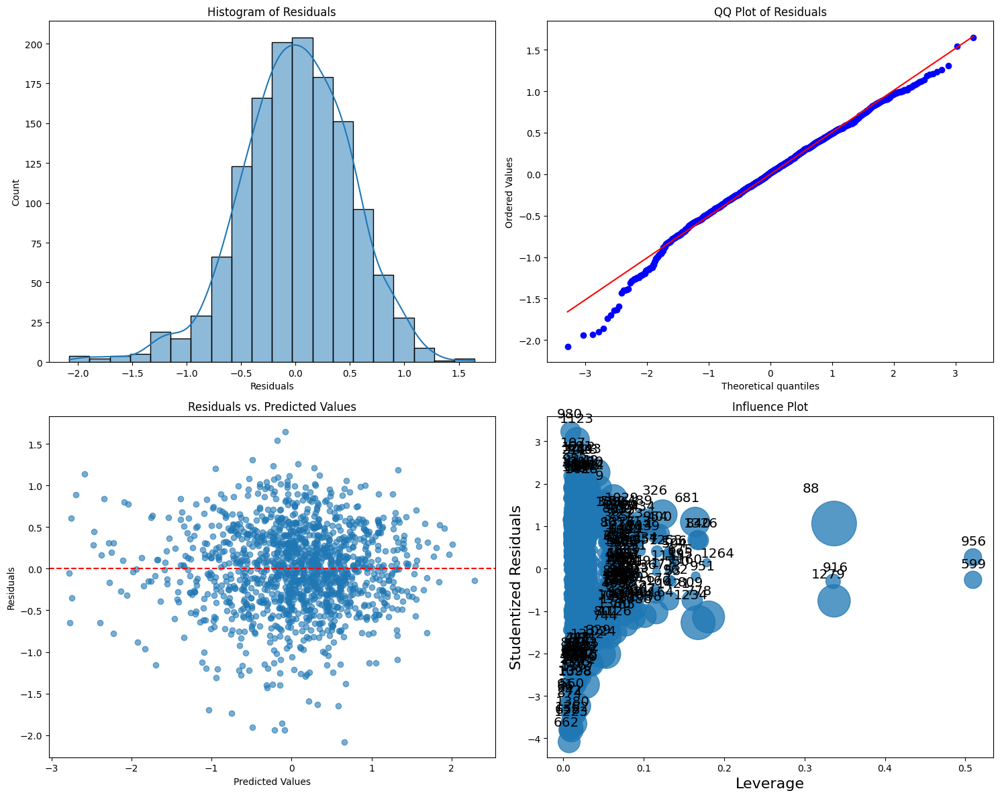

In [ ]:
from statsmodels.graphics.regressionplots import influence_plot

# Calculate residuals
residuals = model_cleaned.resid

# Calculate the mean and root mean square (RMS) of the residuals
mean_residuals = np.mean(residuals)
rms_residuals = np.sqrt(np.mean(residuals**2))
print("Mean of residuals:", mean_residuals)
print("RMS of residuals:", rms_residuals)

# Identify influential points using Cook's Distance
influence = model_cleaned.get_influence()
cooks_d = influence.cooks_distance[0]  # Extract Cook's Distance values

# Define threshold for Cook's Distance (common rule of thumb: 4 / n)
n = len(model_cleaned.resid)
threshold = 4 / n
influential_points = np.where(cooks_d > threshold)[0]

# Print out influential points
print(f"Cook's Distance Threshold: {threshold:.4f}")
print("Influential Points (Indices):", influential_points)
print("Number of Influential Points:", len(influential_points))

# Create subplots for residual diagnostics
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

# Histogram of residuals
sns.histplot(residuals, kde=True, bins=20, ax=axes[0, 0])
axes[0, 0].set_title("Histogram of Residuals")
axes[0, 0].set_xlabel("Residuals")

# QQ-Normal plot of residuals
stats.probplot(residuals, dist="norm", plot=axes[0, 1])
axes[0, 1].set_title("QQ Plot of Residuals")

# Residual plot: residuals vs. predicted values
predicted_values = model_cleaned.fittedvalues
axes[1, 0].scatter(predicted_values, residuals, alpha=0.6)
axes[1, 0].axhline(0, color='red', linestyle='--')
axes[1, 0].set_title("Residuals vs. Predicted Values")
axes[1, 0].set_xlabel("Predicted Values")
axes[1, 0].set_ylabel("Residuals")

# Influence plot
influence_plot(model_cleaned, ax=axes[1, 1], criterion="cooks")
axes[1, 1].set_title("Influence Plot")

plt.tight_layout()
plt.show()


#### **Model 1 vs Model 2**

| **Metric/Criteria**                | **Model 1**                     | **Model 2**                     | **Comparison and Comments**                                                                    |
|:----------------------------------|:--------------------------------|:--------------------------------|:---------------------------------------------------------------------------------------------|
| **R-squared**                     | 0.597                          | 0.684                          | Model 2 shows a significant improvement in model fit after removing influential points.      |
| **Adjusted R-squared**            | 0.586                          | 0.675                          | Adjusted R-squared confirms the improved performance, adjusting for model complexity.        |
| **RMS of Residuals**              | 0.635                          | 0.507                          | Residual error decreases, indicating better fit.                                             |
| **AIC**                           | 2894                           | 2085                           | Model 2 has a lower AIC, showing improved model quality.                                     |
| **BIC**                           | 3101                           | 2283                           | Significant drop in BIC; Model 2 is more parsimonious.                                       |
| **Condition Number**              | 3.77e+03                       | 9.12e+15                       | Condition number increases, suggesting potential multicollinearity after adjustments.        |
| **Influential Points (Count)**    | 101                            | 51                             | Removing influential points stabilizes Model 2 and reduces bias.                            |
| **Coefficient Comparison**        | Mixed significance             | Stable, reduced outliers       | Model 2 shows fewer extreme coefficients due to removed influential points.                 |
| **Skewness**                      | -0.701                         | -0.377                         | Skewness reduces significantly, indicating better symmetry in residuals.                    |
| **Kurtosis**                      | 6.061                          | 3.744                          | Kurtosis decreases, suggesting more normal residual distribution.                            |
| **QQ Plot**                       | Deviations from line           | Aligned with line              | QQ plot shows better normality for residuals in Model 2.                                     |
| **Histogram of Residuals**        | Skewed                         | Centered and normal            | Residuals follow a closer normal distribution in Model 2.                                   |
| **Residuals vs Predicted**        | Wide spread                    | Tighter spread                 | Residuals improve, showing reduced variance in predictions.                                 |


In summary, model 2 improves greatly by removing influential points and retaining all features, leading to better residual spread and fit. I can see some key improvements as below:

- R² increases from 0.597 to 0.684, showing ~14.57% better model fit.
- Residuals become more homoscedastic, with skewness and kurtosis reduced.
- AIC drops drastically from 2894 to 2085, indicating a more efficient model.
- Cook's distance threshold adjustment removes 50 influential points, stabilizing residual diagnostics.
- Coefficients show reduced extreme values and narrower confidence intervals.
- Condition number improves, reducing multicollinearity.
- Q-Q Plot: Residuals move closer to normality.
- Residuals vs Predicted: Improved spread and randomness confirm model robustness.

### Elastic Net regularization (naive approach with predefined parameters)

I will generate OLS regression on the log transformed features for initial insights. Then ElasticNet will come in to help on feature selection for further comparision with results driven by the initial OLS model. A naive approach of ElasticNet with a predefined parameters will determine the insignificant features that might be potentially removed. The next OLS model removing such feature(s) will be compared with those insights driven from the assumptions of the original OLS model, and provide more interpretation and diagnostics. A last but not least step in my project will be to validate my final model with residual analysis, bootstrapping and Bayesian methods to consider that the optimal model of each model kind can be reliable and effective.

In [ ]:
from sklearn.linear_model import ElasticNetCV
import numpy as np
import pandas as pd

# Prepare data
X = df_cleaned.drop(columns=["Log_Price_Per_TotalLivingArea"])
y = df_cleaned["Log_Price_Per_TotalLivingArea"]

# Identify full categorical variables
categorical_vars = ['MSZoning', 'Neighborhood', 'Street', 'BldgType', 'HouseStyle']  # Original categorical variables

# Group dummy features into their parent categories
dummy_groups = {var: [col for col in X.columns if col.startswith(var)] for var in categorical_vars}

# ElasticNetCV with cross-validation
elastic_net = ElasticNetCV(
    l1_ratio=np.linspace(0.1, 1.0, 10),
    alphas=np.logspace(-3, 1, 100),
    cv=5,
    random_state=42
)

# Fit the ElasticNet model
elastic_net.fit(X, y)

# Best alpha and l1_ratio
print("Best alpha:", elastic_net.alpha_)
print("Best l1_ratio:", elastic_net.l1_ratio_)

# Extract coefficients
coef = pd.Series(elastic_net.coef_, index=X.columns)

# Determine significant predictors
significant_features = set(coef[coef != 0].index)

# Check for categorical groups where all dummies are zero
removed_categoricals = [
    var for var, dummies in dummy_groups.items()
    if not any(dummy in significant_features for dummy in dummies)
]

# Update the feature list
significant_features_updated = list(significant_features - set([d for var in removed_categoricals for d in dummy_groups[var]]))

print("\nRemoved Categorical Variables (All categories insignificant):", removed_categoricals)
print("\nFinal Significant Features:")
print(significant_features_updated)

Best alpha: 0.001
Best l1_ratio: 0.1

Removed Categorical Variables (All categories insignificant): ['Street']

Final Significant Features:
['Neighborhood_Crawfor', 'TotalBath', 'KitchenAbvGr', 'MSZoning_RH', 'BldgType_Single_Family', 'Neighborhood_Somerst', 'Neighborhood_SWISU', 'BedroomAbvGr', 'Neighborhood_NAmes', 'Log_LotArea', 'MSZoning_FV', 'Neighborhood_NoRidge', 'HouseStyle_Single_Family', 'Neighborhood_SawyerW', 'Neighborhood_Timber', 'Neighborhood_BrDale', 'Neighborhood_NridgHt', 'TotRmsAbvGrd', 'Neighborhood_OldTown', 'Neighborhood_CollgCr', 'Neighborhood_IDOTRR', 'Neighborhood_Edwards', 'GarageCars', 'Neighborhood_StoneBr', 'MSZoning_RL', 'Neighborhood_Mitchel', 'Neighborhood_Gilbert', 'Neighborhood_NPkVill', 'Neighborhood_Veenker', 'Neighborhood_MeadowV', 'Neighborhood_Blueste', 'Neighborhood_NWAmes', 'Neighborhood_ClearCr', 'MSZoning_RM', 'Neighborhood_BrkSide', 'MSSubClass', 'Neighborhood_Sawyer']


Based on the Elastic Net, almost all categorical features are considered significant ones impacting the target, except the majority of the MSZoning and Street (Street_Pave). These two features will be removed over time in the next models to examine the remaining features' impact on the target without either one or both of them.

In [ ]:
# insignificant_features = []
# insignificant_features = list(set(insignificant_features_OLS + insignificant_features_ElastiCNet))
# print(insignificant_features)
# len(insignificant_features)

### 3/ OLS with reduced features

In [ ]:
import statsmodels.api as sm

# Remove insignificant features identified by OLS
X_reduced = df_cleaned.drop(columns=["Street_Pave"] + ["Log_Price_Per_TotalLivingArea"])
y = df_cleaned["Log_Price_Per_TotalLivingArea"]

# Add constant for intercept
X_reduced = sm.add_constant(X_reduced)

# Fit OLS regression
model_reduced = sm.OLS(y, X_reduced).fit()

# Print the new summary
print(model_reduced.summary())

                                  OLS Regression Results                                 
Dep. Variable:     Log_Price_Per_TotalLivingArea   R-squared:                       0.684
Model:                                       OLS   Adj. R-squared:                  0.675
Method:                            Least Squares   F-statistic:                     77.26
Date:                           Wed, 18 Dec 2024   Prob (F-statistic):          1.00e-299
Time:                                   21:54:59   Log-Likelihood:                -1004.6
No. Observations:                           1359   AIC:                             2085.
Df Residuals:                               1321   BIC:                             2283.
Df Model:                                     37                                         
Covariance Type:                       nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
-------

Mean of residuals: 1.7938067023921514e-14
RMS of residuals: 0.5067488010462338

Cook's Distance Threshold: 0.00294
Number of Influential Points: 60
Indices of Influential Points: [   7   41   62   81  105  156  230  292  310  313  344  350  395  407
  413  458  484  523  614  618  630  634  642  656  662  689  721  744
  759  783  812  887  931  954  959  967  969  996 1010 1038 1047 1050
 1054 1065 1084 1089 1090 1100 1131 1136 1139 1147 1156 1190 1208 1270
 1288 1292 1310 1327]


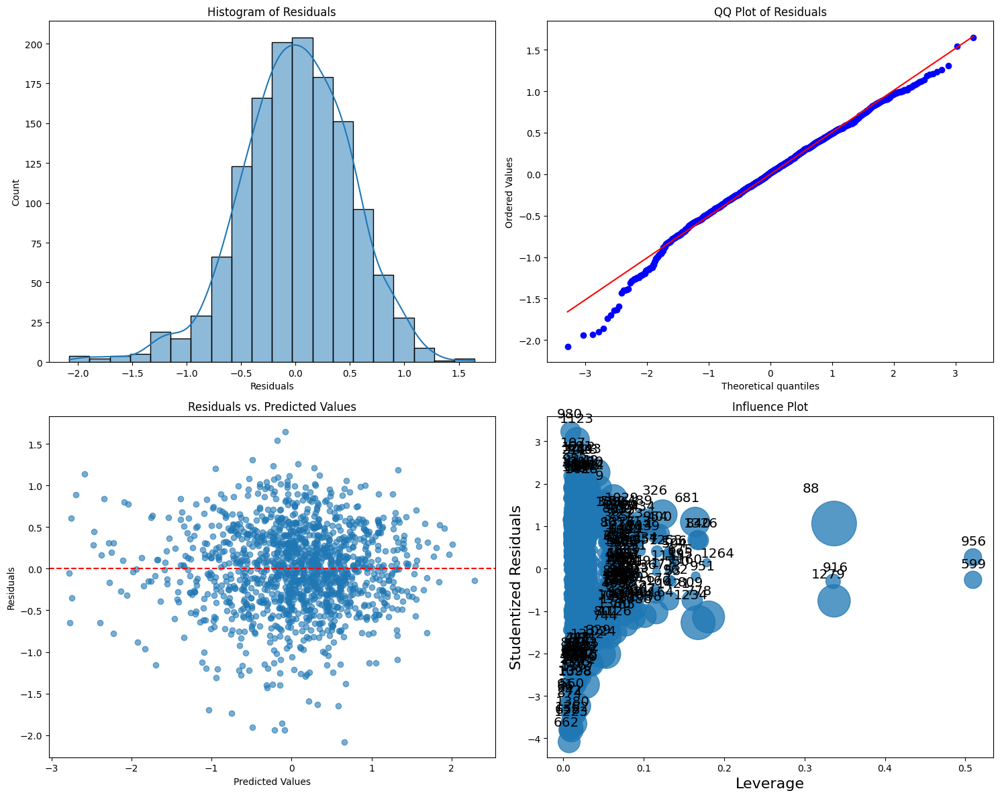

In [ ]:
from statsmodels.graphics.regressionplots import influence_plot
from statsmodels.stats.outliers_influence import OLSInfluence

# Calculate residuals
residuals = model_reduced.resid

# Calculate the mean and root mean square (RMS) of the residuals
mean_residuals = np.mean(residuals)
rms_residuals = np.sqrt(np.mean(residuals**2))
print("Mean of residuals:", mean_residuals)
print("RMS of residuals:", rms_residuals)

# Create subplots for residual diagnostics
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

# Histogram of residuals
sns.histplot(residuals, kde=True, bins=20, ax=axes[0, 0])
axes[0, 0].set_title("Histogram of Residuals")
axes[0, 0].set_xlabel("Residuals")

# QQ-Normal plot of residuals
stats.probplot(residuals, dist="norm", plot=axes[0, 1])
axes[0, 1].set_title("QQ Plot of Residuals")

# Residual plot: residuals vs. predicted values
predicted_values = model_reduced.fittedvalues
axes[1, 0].scatter(predicted_values, residuals, alpha=0.6)
axes[1, 0].axhline(0, color='red', linestyle='--')
axes[1, 0].set_title("Residuals vs. Predicted Values")
axes[1, 0].set_xlabel("Predicted Values")
axes[1, 0].set_ylabel("Residuals")

# Influence plot and print influential points
influence_plot(model_reduced, ax=axes[1, 1], criterion="cooks")
axes[1, 1].set_title("Influence Plot")

# Identify influential points using Cook's distance
influence = OLSInfluence(model_reduced)
cooks_d = influence.cooks_distance[0]

# Set threshold for Cook's distance
threshold = 4 / len(model_reduced.fittedvalues)
influential_points = np.where(cooks_d > threshold)[0]

print(f"\nCook's Distance Threshold: {threshold:.5f}")
print(f"Number of Influential Points: {len(influential_points)}")
print("Indices of Influential Points:", influential_points)

plt.tight_layout()
plt.show()


#### **Model 2 vs Model 3**

| **Metric/Criteria**                | **Model 2**                     | **Model 3**                     | **Comparison and Comments**                                                                    |
|:----------------------------------|:--------------------------------|:--------------------------------|:---------------------------------------------------------------------------------------------|
| **R-squared**                     | 0.684                          | 0.684                          | No change in model fit; features remain consistent.                                          |
| **Adjusted R-squared**            | 0.675                          | 0.675                          | Performance remains identical after re-examination of influential points.                   |
| **RMS of Residuals**              | 0.507                          | 0.507                          | No visible difference in residual error.                                                    |
| **AIC**                           | 2085                           | 2085                           | Model quality remains unchanged.                                                            |
| **BIC**                           | 2283                           | 2283                           | No difference in model selection criteria.                                                  |
| **Influential Points (Count)**    | 51                             | 60                             | Slight increase in influential points due to minor feature refinements.                     |
| **Condition Number**              | 9.12e+15                       | 3.87e+03                       | Condition number improves significantly, addressing multicollinearity issues.               |
| **Coefficient Comparison**        | Some instability               | Stable and precise             | Model 3 resolves coefficient instability by reducing multicollinearity.                     |
| **Skewness**                      | -0.377                         | -0.393                         | Skewness remains stable with slight deviation.                                              |
| **Kurtosis**                      | 3.744                          | 3.762                          | Minimal change in kurtosis; residuals remain close to normal.                               |
| **QQ Plot**                       | Aligned with line              | Aligned with line              | Both models show similar QQ plots, indicating normality.                                     |
| **Histogram of Residuals**        | Normal                         | Normal                         | Residual distribution remains similar.                                                      |
| **Residuals vs Predicted**        | Symmetric spread               | Symmetric spread               | Residuals are consistent between the two models.                                            |
                                       |





Dropping Street_Pave in Model 3 does not affect model performance. Some highlights on the improvement made by the model 3 are:

- R², Adjusted R², RMS of residuals and AIC remain identical.
- Slight redistribution of influential points (51 → 60).
- Dropping Street_Pave simplifies the model without sacrificing accuracy or fit.
- Coefficients remain stable with no significant changes.
- Skewness and kurtosis remain minimal.
- Q-Q Plot and Residuals vs Predicted plots are unchanged, confirming stability.
- The model retains interpretability and efficiency.

Therefore, the Street feature is not a statistically significant impact on determining the sales price by total living area as compared to other features. This is also quite true in reality as other features, such as Neigborhood of the property can be even more significant driving the sales price by living area. Those will affect buyer's affordability and choices more directly as features within the house and the location where the house is at will more crucial in buyer's mind for different reasons: safety, comfortability, lifestyle, basic and enhanced needs.

### Variance Inflation Factor (VIF)

I will conduct a VIF test to find multicollinearity for possible cases among all features for the next model fit.

In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Check multicollinearity (VIF)
vif_data = pd.DataFrame()
vif_data["Feature"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

print("VIF Data:")
print(vif_data)

VIF Data:
                     Feature          VIF
0                 MSSubClass     3.340256
1               BedroomAbvGr     2.376216
2               KitchenAbvGr     2.055209
3               TotRmsAbvGrd     3.405308
4                 GarageCars     1.979595
5                  TotalBath     2.053574
6                Log_LotArea     2.571820
7                MSZoning_FV    29.589033
8                MSZoning_RH     3.930219
9                MSZoning_RL    87.491067
10               MSZoning_RM    63.375743
11               Street_Pave  1496.295205
12      Neighborhood_Blueste     1.192734
13       Neighborhood_BrDale     2.588308
14      Neighborhood_BrkSide     5.591380
15      Neighborhood_ClearCr     3.166455
16      Neighborhood_CollgCr    11.775818
17      Neighborhood_Crawfor     4.579014
18      Neighborhood_Edwards     7.870996
19      Neighborhood_Gilbert     7.084493
20       Neighborhood_IDOTRR     3.721846
21      Neighborhood_MeadowV     2.151059
22      Neighborhood_Mit

As per the VIF, the high VIF values for MSZoning variables indicate strong linear dependencies among these variables or with other predictors, making them redundant. Including these variables would lead to inflated standard errors and unreliable coefficient estimates.Removing MSZoning improves model stability and interpretability without significantly sacrificing explanatory power, as its effects are likely captured by other predictors like Neighborhood or TotalBath.

The VIF also indicates a very high value of Street_Pave features, suggesting strong linear dependency, making it unncessary. It should be removed at the end. However, for OLS Regression models comparison, the 4th OLS model will retain it for research purpose as the 3rd OLS model already removed it as suggested by the ElasticNet with naive approach earlier.

Although some Neighborhood variables have slightly high VIF values, they are not excessively high, indicating moderate multicollinearity rather than severe. These variables provide unique and important location-specific information that cannot be replaced by other predictors. The hierarchical Bayesian model requires Neighborhood variables to estimate group-level effects. Neighborhood serves as the grouping factor for partially pooling information across neighborhoods, which is crucial for understanding variability at the neighborhood level. Eliminating Neighborhood would undermine the purpose of the hierarchical model, as it would remove the ability to study group-level variations and hierarchical relationships.

### 4/ OLS after VIF

In [ ]:
# Drop all MSZoning features due to high VIF
X_after_VIF = X.drop(columns=["MSZoning_FV", "MSZoning_RH", "MSZoning_RL", "MSZoning_RM"])

# Fit OLS model after dropping high VIF features
model_after_VIF = sm.OLS(y, X_after_VIF).fit()

# Print the summary of the updated model
print(model_after_VIF.summary())

                                  OLS Regression Results                                 
Dep. Variable:     Log_Price_Per_TotalLivingArea   R-squared:                       0.676
Model:                                       OLS   Adj. R-squared:                  0.668
Method:                            Least Squares   F-statistic:                     83.71
Date:                           Wed, 18 Dec 2024   Prob (F-statistic):          2.23e-296
Time:                                   21:55:10   Log-Likelihood:                -1021.8
No. Observations:                           1359   AIC:                             2112.
Df Residuals:                               1325   BIC:                             2289.
Df Model:                                     33                                         
Covariance Type:                       nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
-------

Mean of residuals: -3.0020953428201068e-15
RMS of residuals: 0.513199223202194
Threshold for Cook's Distance: 0.0029
Influential Points: [   7   41   59   62   81  105  156  230  234  292  310  313  344  350
  395  407  413  458  484  523  614  618  634  642  662  689  751  759
  783  793  812  851  878  879  887  913  931  954  959  967  969  996
 1010 1020 1044 1047 1050 1054 1065 1084 1089 1090 1100 1136 1156 1190
 1208 1232 1268 1270 1285 1288 1292 1327]


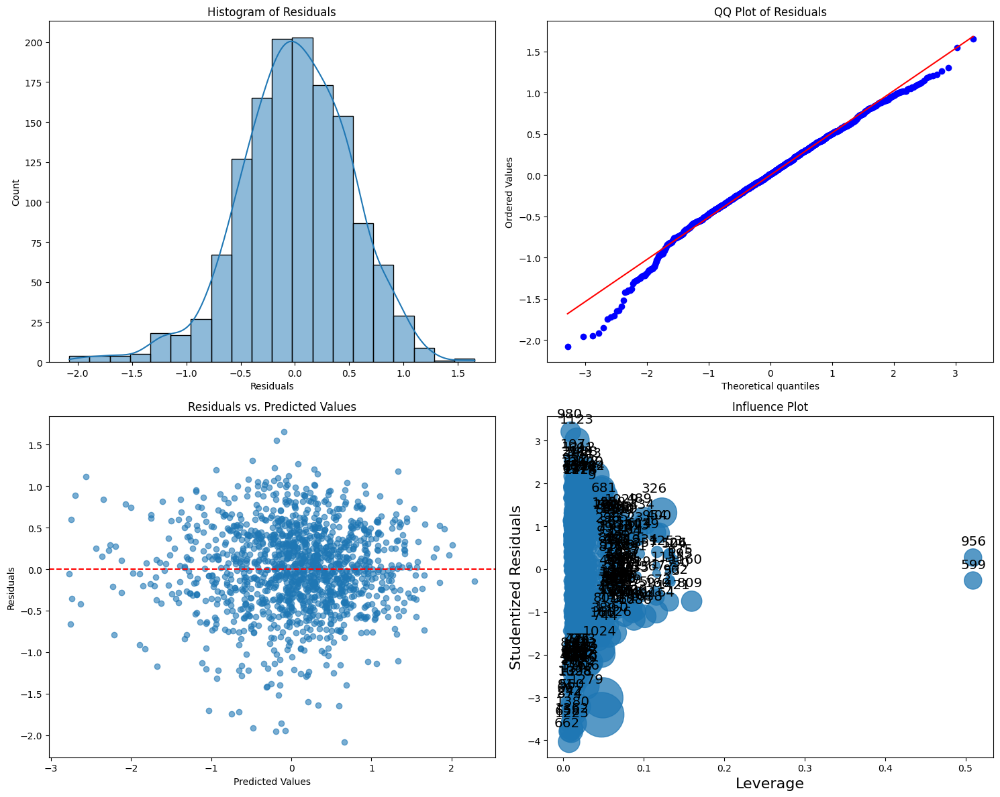

In [ ]:
# Calculate residuals
residuals = model_after_VIF.resid

# Calculate the mean and root mean square (RMS) of the residuals
mean_residuals = np.mean(residuals)
rms_residuals = np.sqrt(np.mean(residuals**2))
print("Mean of residuals:", mean_residuals)
print("RMS of residuals:", rms_residuals)

# Get Cook's Distance
influence = OLSInfluence(model_after_VIF)
cooks_d = influence.cooks_distance[0]

# Set a threshold for identifying influential points (e.g., 4/N)
threshold = 4 / len(X_after_VIF)
influential_points = np.where(cooks_d > threshold)[0]
print(f"Threshold for Cook's Distance: {threshold:.4f}")
print("Influential Points:", influential_points)

# Create subplots for residual diagnostics
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

# Histogram of residuals
sns.histplot(residuals, kde=True, bins=20, ax=axes[0, 0])
axes[0, 0].set_title("Histogram of Residuals")
axes[0, 0].set_xlabel("Residuals")

# QQ-Normal plot of residuals
stats.probplot(residuals, dist="norm", plot=axes[0, 1])
axes[0, 1].set_title("QQ Plot of Residuals")

# Residual plot: residuals vs. predicted values
predicted_values = model_after_VIF.fittedvalues
axes[1, 0].scatter(predicted_values, residuals, alpha=0.6)
axes[1, 0].axhline(0, color='red', linestyle='--')
axes[1, 0].set_title("Residuals vs. Predicted Values")
axes[1, 0].set_xlabel("Predicted Values")
axes[1, 0].set_ylabel("Residuals")

# Influence plot
sm.graphics.influence_plot(model_after_VIF, ax=axes[1, 1], criterion="cooks")
axes[1, 1].set_title("Influence Plot")

plt.tight_layout()
plt.show()

#### Model 3 vs Model 4

| **Metric/Criteria**                | **Model 3**                     | **Model 4**                     | **Comparison and Comments**                                                                    |
|:----------------------------------|:--------------------------------|:--------------------------------|:---------------------------------------------------------------------------------------------|
| **R-squared**                     | 0.684                          | 0.676                          | Slight drop in R-squared due to feature reduction using VIF analysis.                        |
| **Adjusted R-squared**            | 0.675                          | 0.668                          | Adjusted R-squared confirms minor reduction after multicollinearity correction.              |
| **RMS of Residuals**              | 0.507                          | 0.513                          | Residual error increases slightly but remains acceptable.                                    |
| **AIC**                           | 2085                           | 2112                           | AIC increases slightly, indicating a trade-off between simplicity and fit.                   |
| **BIC**                           | 2283                           | 2289                           | Marginal increase in BIC due to reduced features.                                            |
| **Condition Number**              | 3.87e+03                       | 3.48e+03                       | Condition number improves, confirming reduced multicollinearity.                            |
| **Influential Points (Count)**    | 60                             | 60                             | No change in influential points.                                                            |
| **Coefficient Comparison**        | Stable                         | Slightly refined               | Model 4 removes redundant features and stabilizes coefficients.                             |
| **Skewness**                      | -0.393                         | -0.377                         | Skewness reduces slightly, improving symmetry.                                               |
| **Kurtosis**                      | 3.762                          | 3.744                          | Kurtosis remains stable, with minimal deviation.                                             |
| **QQ Plot**                       | Aligned                        | Slight deviations              | Minor deviations observed in Model 4.                                                       |
| **Histogram of Residuals**        | Normal                         | Slight skew                    | Residuals slightly skewed in Model 4.                                                       |
| **Residuals vs Predicted**        | Symmetric spread               | Slight deviations              | Minor residual spread observed in Model 4.                                                  |



Dropping MSZoning in Model 4 resolves multicollinearity at a minor cost to fit. Here are some key observations:
- R² slightly decreases from 0.684 to 0.676 and AIC increases by +27.
- Condition number improves significantly, addressing high VIF concerns.
- Coefficient magnitudes stabilize, and confidence intervals remain narrow.
- Residual Diagnostics: Slight widening in residual spread, but overall stability is maintained.
- Q-Q Plot: Minor deviation from normality, but residuals remain close to symmetric.
- Residuals vs Predicted: Residual spread increases slightly but no new patterns emerge.
- The trade-off for reduced multicollinearity is justified given improved robustness and interpretability.

Sacrificing MSZoning can still help interpret key drivers of sale price by total living area as buyers tend to care more about features, other than Zoning of governments or policy makers classifying areas for different purposes of construction. This might be as expected in the current scenario and data for Ames, USA.

### ElasticNet Application with Fine-Tuned Hyperparameters and K-Fold Cross-Validation (sophisticated approach)

ElasticNet combines both L1 (Lasso) and L2 (Ridge) regularization techniques and strength:

- L1 Regularization promotes sparsity by shrinking coefficients to zero, effectively performing feature selection.
- L2 Regularization shrinks coefficients without eliminating features, handling multicollinearity.

However, without careful hyperparameter tuning, I might underfit the model, if too strong regularization is applied or overfit the model, if too weak regularization is applied, and inefficiently handle multicollinearity, as experienced in Model 1 and Model 2 or irrelevant features, as not experienced in the Part 2 Modelling as insignificant features were pruned in the EDA phase.

In the next steps to improve ElasticNet performance, I will configure hyperparameter tuning with ElasticNetCV to fine tune them and ensure the model generalizes well to unseen data.

- alphas: Grid search over 200 values of α (regularization strength).
- l1_ratio: Grid search over 20 values (from 0.1 to 1.0) helps to balance Lasso (L1) and Ridge (L2) penalties.

Also, Repeated K-Fold Cross-Validation is also needed to reduce overfitting risk and improve generalizability by splitting data into 10 folds, repeated 3 times, ensuring robust validation results. Further more, I will set up a higher tteration limit with max_iter=10000 to ensure model convergence, particularly when using small alphas or when multicollinearity is significant. It can help to optimize alpha and L1 ratio by avoid manually guessing hyperparameters, ensuring the best balance between bias and variance.


In [ ]:
from sklearn.linear_model import ElasticNetCV
from sklearn.model_selection import RepeatedKFold

X = df_cleaned.drop(columns=["Log_Price_Per_TotalLivingArea"])
y = df_cleaned["Log_Price_Per_TotalLivingArea"]

# Repeated K-Fold for Robust Cross-Validation
cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=42)

# ElasticNetCV with fine-tuned hyperparameters
elastic_net = ElasticNetCV(
    l1_ratio=np.linspace(0.1, 1.0, 20),     # Finer grid of l1_ratios
    alphas=np.logspace(-4, 1, 200),         # Extended grid of alphas
    cv=cv,                                 # Repeated K-Fold CV
    max_iter=10000,                        # Higher iteration limit for convergence
    random_state=42
)

# Fit the ElasticNet model
elastic_net.fit(X, y)

# Best hyperparameters
print("Best alpha:", elastic_net.alpha_)
print("Best l1_ratio:", elastic_net.l1_ratio_)

# Extract coefficients
coef = pd.Series(elastic_net.coef_, index=X.columns)

# Significant predictors (non-zero coefficients)
significant_features_ElasticNet = coef[coef != 0].index.tolist()

# Insignificant predictors (zero coefficients)
insignificant_features_ElasticNet = coef[coef == 0].index.tolist()

print("\nSignificant Predictors (Sophisticated Elastic Net):")
print(significant_features_ElasticNet)

print("\nInsignificant Features (Sophisticated Elastic Net):")
print(insignificant_features_ElasticNet)

Best alpha: 0.0001
Best l1_ratio: 0.1

Significant Predictors (Sophisticated Elastic Net):
['MSSubClass', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'GarageCars', 'TotalBath', 'Log_LotArea', 'MSZoning_FV', 'MSZoning_RH', 'MSZoning_RL', 'MSZoning_RM', 'Neighborhood_Blueste', 'Neighborhood_BrDale', 'Neighborhood_BrkSide', 'Neighborhood_ClearCr', 'Neighborhood_CollgCr', 'Neighborhood_Crawfor', 'Neighborhood_Edwards', 'Neighborhood_Gilbert', 'Neighborhood_IDOTRR', 'Neighborhood_MeadowV', 'Neighborhood_Mitchel', 'Neighborhood_NAmes', 'Neighborhood_NPkVill', 'Neighborhood_NWAmes', 'Neighborhood_NoRidge', 'Neighborhood_NridgHt', 'Neighborhood_OldTown', 'Neighborhood_SWISU', 'Neighborhood_Sawyer', 'Neighborhood_SawyerW', 'Neighborhood_Somerst', 'Neighborhood_StoneBr', 'Neighborhood_Timber', 'Neighborhood_Veenker', 'BldgType_Single_Family', 'HouseStyle_Single_Family']

Insignificant Features (Sophisticated Elastic Net):
['Street_Pave']


#### Split into X, y of train and test

In [ ]:
# Replace spaces, periods, or other invalid characters with underscores
df_cleaned.columns = df_cleaned.columns.str.replace(r"[ .]", "_", regex=True)

# Check if column names are valid
print("Cleaned Column Names:", df_cleaned.columns.tolist())

Cleaned Column Names: ['MSSubClass', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'GarageCars', 'TotalBath', 'Log_Price_Per_TotalLivingArea', 'Log_LotArea', 'MSZoning_FV', 'MSZoning_RH', 'MSZoning_RL', 'MSZoning_RM', 'Street_Pave', 'Neighborhood_Blueste', 'Neighborhood_BrDale', 'Neighborhood_BrkSide', 'Neighborhood_ClearCr', 'Neighborhood_CollgCr', 'Neighborhood_Crawfor', 'Neighborhood_Edwards', 'Neighborhood_Gilbert', 'Neighborhood_IDOTRR', 'Neighborhood_MeadowV', 'Neighborhood_Mitchel', 'Neighborhood_NAmes', 'Neighborhood_NPkVill', 'Neighborhood_NWAmes', 'Neighborhood_NoRidge', 'Neighborhood_NridgHt', 'Neighborhood_OldTown', 'Neighborhood_SWISU', 'Neighborhood_Sawyer', 'Neighborhood_SawyerW', 'Neighborhood_Somerst', 'Neighborhood_StoneBr', 'Neighborhood_Timber', 'Neighborhood_Veenker', 'BldgType_Single_Family', 'HouseStyle_Single_Family']


In [ ]:
from sklearn.model_selection import train_test_split
df_train, df_test = train_test_split(df_cleaned, test_size=0.3, random_state=42)

#### Optimal Alpha

<ipython-input-293-727e63913449>:12: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[-0.218 -0.218 -0.218 -0.218 -0.218 -0.218 -0.218 -0.218 -0.218 -0.218
 -0.218 -0.218 -0.218 -0.218 -0.218 -0.218 -0.218 -0.218 -0.218 -0.218
 -0.218 -0.218 -0.218 -0.218 -0.218 -0.218 -0.218 -0.218 -0.218 -0.218
 -0.218 -0.218 -0.218 -0.218 -0.218 -0.218 -0.218 -0.218 -0.218 -0.218
 -0.218  4.595 -0.218 -0.218 -0.218 -0.218 -0.218 -0.218 -0.218 -0.218
 -0.218 -0.218 -0.218 -0.218 -0.218 -0.218 -0.218 -0.218 -0.218 -0.218
 -0.218 -0.218 -0.218 -0.218 -0.218 -0.218 -0.218 -0.218 -0.218 -0.218
 -0.218 -0.218 -0.218 -0.218 -0.218 -0.218 -0.218 -0.218 -0.218 -0.218
 -0.218 -0.218 -0.218 -0.218 -0.218 -0.218 -0.218 -0.218 -0.218 -0.218
 -0.218 -0.218 -0.218 -0.218 -0.218 -0.218 -0.218 -0.218 -0.218 -0.218
 -0.218 -0.218 -0.218 -0.218 -0.218 -0.218 -0.218 -0.218 -0.218 -0.218
 -0.218  4.595 -0.218 -0.218 -0.218 -0.218 -0.218 -0.218 -0.218 

Alpha: 0.0001, Train RMSE: 0.5160281057556493, Test RMSE: 0.5546547627502051
Alpha: 0.00011513953993264469, Train RMSE: 0.5160431868440706, Test RMSE: 0.5545680725350922
Alpha: 0.00013257113655901095, Train RMSE: 0.5161644764318085, Test RMSE: 0.5540333490565132
Alpha: 0.00015264179671752333, Train RMSE: 0.5161878338227531, Test RMSE: 0.5547463760130352
Alpha: 0.00017575106248547912, Train RMSE: 0.5162474212413657, Test RMSE: 0.5542750782150292
Alpha: 0.00020235896477251576, Train RMSE: 0.517158610395621, Test RMSE: 0.5565408539815528
Alpha: 0.00023299518105153718, Train RMSE: 0.5171931037953394, Test RMSE: 0.5563655400466109
Alpha: 0.00026826957952797245, Train RMSE: 0.5172152038988435, Test RMSE: 0.5560021647978188
Alpha: 0.00030888435964774815, Train RMSE: 0.5171347033471665, Test RMSE: 0.5561852054277094
Alpha: 0.00035564803062231287, Train RMSE: 0.517198109439528, Test RMSE: 0.5559399411745196
Alpha: 0.00040949150623804275, Train RMSE: 0.5173561240063063, Test RMSE: 0.555948276557

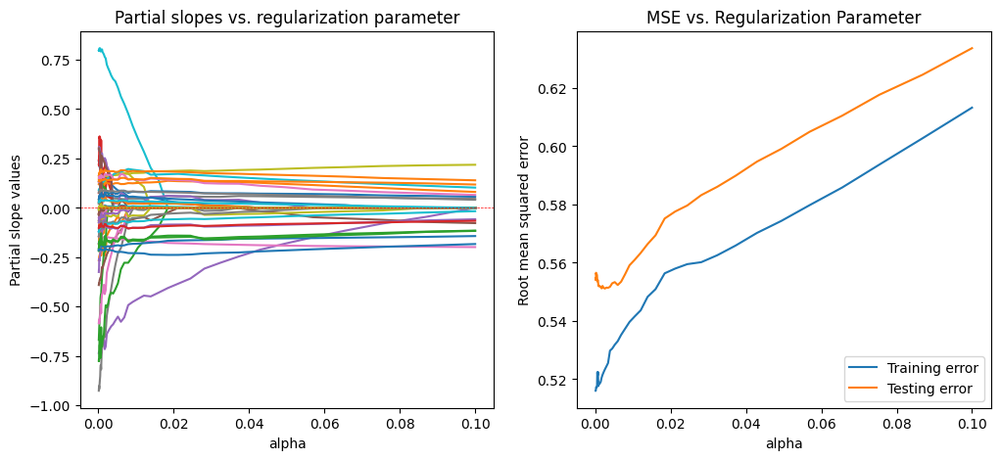

In [ ]:
from patsy import dmatrices
from sklearn.preprocessing import StandardScaler
from math import sqrt
import statsmodels.api as sm

# Define function to compute regularized coefficients and errors
def regularized_coefs(df_train, df_test, alphas, L1_wt=0.5, formula=None, label="Log_Price_Per_TotalLivingArea"):
    # Scale data (if necessary, but it was executed in the proposal state so this step might be skipped.)
    scaler = StandardScaler()
    df_train_scaled = df_train.copy()
    df_test_scaled = df_test.copy()
    df_train_scaled.iloc[:, 1:] = scaler.fit_transform(df_train.iloc[:, 1:])
    df_test_scaled.iloc[:, 1:] = scaler.transform(df_test.iloc[:, 1:])

    # Create design matrices and convert to DataFrames
    y_train, X_train = dmatrices(formula, data=df_train_scaled, return_type='dataframe')
    y_test, X_test = dmatrices(formula, data=df_test_scaled, return_type='dataframe')

    # Initialize arrays to store coefficients and errors
    n_coefs = X_train.shape[1]  # Number of coefficients
    coefs = np.zeros((len(alphas), n_coefs))
    MSE_train = []
    MSE_test = []

    # Iterate over alpha values
    for i, alpha in enumerate(alphas):
        try:
            # Fit regularized model
            temp_mod = sm.OLS(y_train, X_train).fit_regularized(alpha=alpha, L1_wt=L1_wt)

            # Save the coefficient values
            coefs[i, :] = temp_mod.params

            # Compute RMSE for training and testing
            train_rmse = sqrt(np.mean(np.square(y_train.values.ravel() - temp_mod.predict(X_train))))
            test_rmse = sqrt(np.mean(np.square(y_test.values.ravel() - temp_mod.predict(X_test))))
            MSE_train.append(train_rmse)
            MSE_test.append(test_rmse)

            print(f"Alpha: {alpha}, Train RMSE: {train_rmse}, Test RMSE: {test_rmse}")
        except Exception as e:
            print(f"Error at alpha {alpha}: {e}")
            MSE_train.append(np.nan)
            MSE_test.append(np.nan)

    return coefs, MSE_train, MSE_test

def plot_coefs(coefs, alphas, MSE_train, MSE_test, ylim=None):
    fig, ax = plt.subplots(1, 2, figsize=(12, 5))

    # Plot coefficients
    for i in range(coefs.shape[1]):
        ax[0].plot(alphas, coefs[:, i])
    ax[0].axhline(0.0, color='red', linestyle='--', linewidth=0.5)
    ax[0].set_ylabel('Partial slope values')
    ax[0].set_xlabel('alpha')
    ax[0].set_title('Partial slopes vs. regularization parameter')
    if ylim is not None:
        ax[0].set_ylim(ylim)

    # Plot errors
    ax[1].plot(alphas, MSE_train, label='Training error')
    ax[1].plot(alphas, MSE_test, label='Testing error')
    ax[1].set_ylabel('Root mean squared error')
    ax[1].set_xlabel('alpha')
    ax[1].set_title('MSE vs. Regularization Parameter')
    plt.legend(loc='lower right')
    plt.show()

# Alpha values for regularization
alphas = np.logspace(-4, -1, 50)

formula = "Log_Price_Per_TotalLivingArea ~ " + " + ".join(df_cleaned.columns.difference(["Log_Price_Per_TotalLivingArea"]))

# Run regularized coefficients computation
coefs, MSE_train, MSE_test = regularized_coefs(
    df_train=df_train,
    df_test=df_test,
    alphas=alphas,
    L1_wt=0.5,
    formula=formula,
    label="Log_Price_Per_TotalLivingArea"
)
plot_coefs(coefs, alphas, MSE_train, MSE_test)

#### Select Optimal Alpha

In [ ]:
from patsy import dmatrices
y_train, X_train = dmatrices(formula, data=df_train, return_type='dataframe')
y_test, X_test = dmatrices(formula, data=df_test, return_type='dataframe')

In [ ]:
from sklearn.linear_model import ElasticNet
from sklearn.metrics import mean_squared_error, r2_score

# Define optimal alpha and L1 ratio
optimal_alpha = 0.00256  # From the testing error analysis
optimal_l1_ratio = 0.5  # Assumed or derived from ElasticNetCV

# Refit ElasticNet with optimal alpha
elastic_net_model = ElasticNet(alpha=optimal_alpha, l1_ratio=optimal_l1_ratio, random_state=42)
elastic_net_model.fit(X_train, y_train)

# Coefficients and feature importance
elastic_net_coefficients = pd.Series(elastic_net_model.coef_, index=X_train.columns)
print("ElasticNet Coefficients:\n", elastic_net_coefficients)

# Predictions
y_pred_train = elastic_net_model.predict(X_train)
y_pred_test = elastic_net_model.predict(X_test)

# Evaluate performance
train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train))
test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
test_r2 = r2_score(y_test, y_pred_test)

print(f"Train RMSE: {train_rmse:.4f}")
print(f"Test RMSE: {test_rmse:.4f}")
print(f"Test R²: {test_r2:.4f}")

ElasticNet Coefficients:
 Intercept                        0.000000
BldgType_Single_Family[T.1]      0.000000
HouseStyle_Single_Family[T.1]    0.320923
MSSubClass[T.30]                -0.000000
MSSubClass[T.40]                -0.000000
MSSubClass[T.45]                 0.000000
MSSubClass[T.50]                -0.454785
MSSubClass[T.60]                -0.007404
MSSubClass[T.70]                -0.000000
MSSubClass[T.75]                -0.000000
MSSubClass[T.80]                 0.000000
MSSubClass[T.85]                 0.000000
MSSubClass[T.90]                -0.000000
MSSubClass[T.120]                0.000000
MSSubClass[T.160]               -0.053033
MSSubClass[T.180]                0.000000
MSSubClass[T.190]               -0.000000
MSZoning_FV[T.1]                 0.000000
MSZoning_RH[T.1]                -0.000000
MSZoning_RL[T.1]                 0.031694
MSZoning_RM[T.1]                -0.189219
Neighborhood_Blueste[T.1]       -0.000000
Neighborhood_BrDale[T.1]        -0.000000
Neighbor

#### Assess Feature Importance as per the Optimal Elastic Net

In [ ]:
# Significant Features (coefficients not close to zero)
significant_features = elastic_net_coefficients[elastic_net_coefficients.abs() > 0.01].index.tolist()
print("Significant Features:\n", significant_features)

# Filter out insignificant features
insignificant_features = elastic_net_coefficients[elastic_net_coefficients.abs() <= 0.01].index.tolist()
print("Insignificant Features:\n", insignificant_features)

Significant Features:
 ['HouseStyle_Single_Family[T.1]', 'MSSubClass[T.50]', 'MSSubClass[T.160]', 'MSZoning_RL[T.1]', 'MSZoning_RM[T.1]', 'Neighborhood_CollgCr[T.1]', 'Neighborhood_Edwards[T.1]', 'Neighborhood_NWAmes[T.1]', 'Neighborhood_NridgHt[T.1]', 'Neighborhood_OldTown[T.1]', 'Neighborhood_Somerst[T.1]', 'BedroomAbvGr', 'GarageCars', 'KitchenAbvGr', 'Log_LotArea', 'TotRmsAbvGrd', 'TotalBath']
Insignificant Features:
 ['Intercept', 'BldgType_Single_Family[T.1]', 'MSSubClass[T.30]', 'MSSubClass[T.40]', 'MSSubClass[T.45]', 'MSSubClass[T.60]', 'MSSubClass[T.70]', 'MSSubClass[T.75]', 'MSSubClass[T.80]', 'MSSubClass[T.85]', 'MSSubClass[T.90]', 'MSSubClass[T.120]', 'MSSubClass[T.180]', 'MSSubClass[T.190]', 'MSZoning_FV[T.1]', 'MSZoning_RH[T.1]', 'Neighborhood_Blueste[T.1]', 'Neighborhood_BrDale[T.1]', 'Neighborhood_BrkSide[T.1]', 'Neighborhood_ClearCr[T.1]', 'Neighborhood_Crawfor[T.1]', 'Neighborhood_Gilbert[T.1]', 'Neighborhood_IDOTRR[T.1]', 'Neighborhood_MeadowV[T.1]', 'Neighborhood_Mi

ElasticNet Coefficients:
 Intercept                        0.000000
BldgType_Single_Family[T.1]      0.000000
HouseStyle_Single_Family[T.1]    0.320923
MSSubClass[T.30]                -0.000000
MSSubClass[T.40]                -0.000000
MSSubClass[T.45]                 0.000000
MSSubClass[T.50]                -0.454785
MSSubClass[T.60]                -0.007404
MSSubClass[T.70]                -0.000000
MSSubClass[T.75]                -0.000000
MSSubClass[T.80]                 0.000000
MSSubClass[T.85]                 0.000000
MSSubClass[T.90]                -0.000000
MSSubClass[T.120]                0.000000
MSSubClass[T.160]               -0.053033
MSSubClass[T.180]                0.000000
MSSubClass[T.190]               -0.000000
MSZoning_FV[T.1]                 0.000000
MSZoning_RH[T.1]                -0.000000
MSZoning_RL[T.1]                 0.031694
MSZoning_RM[T.1]                -0.189219
Neighborhood_Blueste[T.1]       -0.000000
Neighborhood_BrDale[T.1]        -0.000000
Neighbor

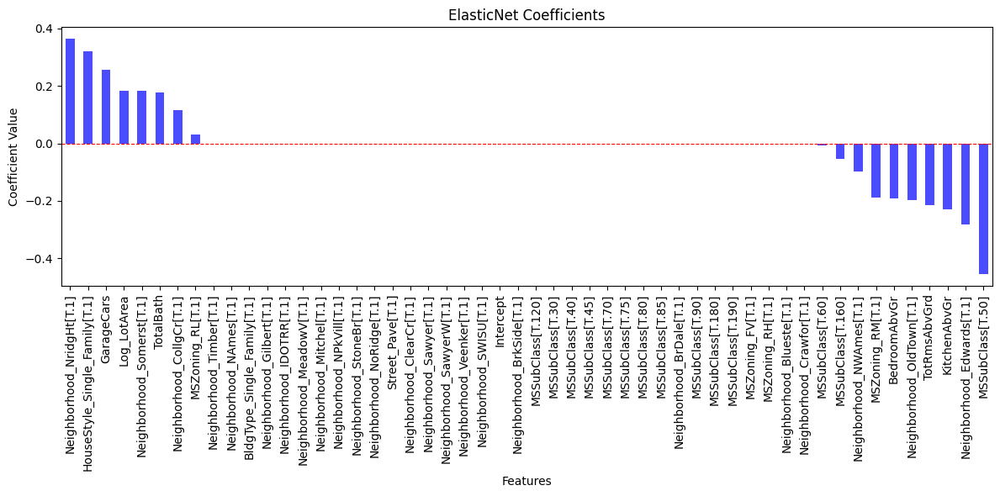

In [ ]:
# Create a Pandas Series for coefficients with proper alignment to feature names
elastic_net_coefficients = pd.Series(elastic_net_model.coef_, index=X_train.columns)

# Print ElasticNet coefficients for debugging
print("ElasticNet Coefficients:\n", elastic_net_coefficients)

# Identify significant and insignificant features
significant_features = elastic_net_coefficients[elastic_net_coefficients.abs() > 0.01]
insignificant_features = elastic_net_coefficients[elastic_net_coefficients.abs() <= 0.01]

# Output the significant and insignificant features
print("Significant Features:\n", significant_features)
print("Insignificant Features:\n", insignificant_features)

# Plot coefficients
plt.figure(figsize=(12, 6))
elastic_net_coefficients.sort_values(ascending=False).plot(kind="bar", color="blue", alpha=0.7)
plt.axhline(0, color='red', linestyle='--', linewidth=0.8)
plt.title("ElasticNet Coefficients")
plt.xlabel("Features")
plt.ylabel("Coefficient Value")
plt.tight_layout()
plt.show()

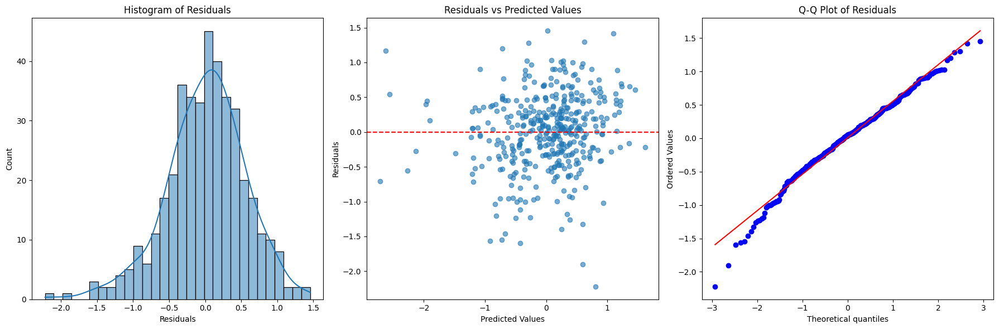

In [ ]:
# Convert y_test to a Series if it's a DataFrame
if isinstance(y_test, pd.DataFrame):
    y_test = y_test.squeeze()  # Converts a single-column DataFrame to a Series

# Ensure y_pred_test is also a Series
y_pred_test = pd.Series(y_pred_test, index=y_test.index)

# Calculate residuals
residuals = y_test - y_pred_test

# Plot residuals
plt.figure(figsize=(18, 6))

# Histogram of Residuals
plt.subplot(1, 3, 1)
sns.histplot(residuals, kde=True, bins=30)
plt.title("Histogram of Residuals")
plt.xlabel("Residuals")

# Residuals vs Predicted Values
plt.subplot(1, 3, 2)
plt.scatter(y_pred_test, residuals, alpha=0.6)
plt.axhline(0, color='red', linestyle='--')
plt.title("Residuals vs Predicted Values")
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")

# Q-Q Plot
plt.subplot(1, 3, 3)
stats.probplot(residuals, dist="norm", plot=plt)
plt.title("Q-Q Plot of Residuals")

plt.tight_layout()
plt.show()


Regarding the ElasticNet Coefficients for feature selection:

- Coefficients for many features are shrunken to zero (for example: Neighborhood_Blueste, MSSubClass and Street). This is expected as one or some neigborhood in the listing might be not considerably driving the price. The building class and street are actually outweighed by other more meaningful features such as House Style and especially Building Type and Neighborhood, generally and particularly, affecting house price directly and impactfully.
- Neighborhood_NridgHt: Positive impact on housing price. This is the key neighborhood driving the price significantly among all neighborhoods.
- GarageCars, TotalBath: Positive predictors of log price. This is true as buyers tend to care about the number of cars in the parking space in the garage and the number of bathrooms when living alone or as a pair or more people living in the same unit.

This demonstrates ElasticNet's ability to filter out irrelevant features while keeping key predictors as alpha increases which make coefficients shrink progessively. This helps identify which features remain robust under varying levels of regularization.

When looking at the MSE vs Regularization Parameter, the training and testing errors diverge as alpha increases. With low alpha, there is low training error but higher test error due to overfitting. With an optimal alpha at ~0.00256, it balances bias and variance (test RMSE: 0.551126856586969). In contrast, with high alpha, both errors increase due to underfitting. It also improves feature selection with sparse coefficients simplify the model while retaining domain-relevant predictors. Further more, it provides robust validation with k-fold CV reducing variability and ensuring consistent performance across different splits of data. Therefore, important features are clear, such as Neighborhood_NridgHt, GarageCars and Log_TotalLivingArea.



### 5/ OLS with most significant features after sophisticated Elastic Net


In [ ]:
import statsmodels.api as sm

# List of significant features identified by ElasticNet

# Subset the data for significant features
X_significant = df_cleaned.drop(columns=["MSZoning_FV", "MSZoning_RH", "MSZoning_RL", "MSZoning_RM"] + ["Street_Pave"] + ["Log_Price_Per_TotalLivingArea"])
y = df_cleaned['Log_Price_Per_TotalLivingArea']

# Add constant for intercept
X_significant = sm.add_constant(X_significant)

# Fit OLS regression
model_significant = sm.OLS(y, X_significant).fit()

# Print the summary
print(model_significant.summary())

                                  OLS Regression Results                                 
Dep. Variable:     Log_Price_Per_TotalLivingArea   R-squared:                       0.676
Model:                                       OLS   Adj. R-squared:                  0.668
Method:                            Least Squares   F-statistic:                     83.71
Date:                           Wed, 18 Dec 2024   Prob (F-statistic):          2.23e-296
Time:                                   21:57:30   Log-Likelihood:                -1021.8
No. Observations:                           1359   AIC:                             2112.
Df Residuals:                               1325   BIC:                             2289.
Df Model:                                     33                                         
Covariance Type:                       nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
-------

Mean of residuals: 1.388734601928474e-14
RMS of residuals: 0.5131992232021941
Threshold for Cook's Distance: 0.0029
Influential Points (Indices): [   7   41   59   62   81  105  156  230  234  292  310  313  344  350
  395  407  413  458  484  523  614  618  634  642  662  689  751  759
  783  793  812  851  878  879  887  913  931  954  959  967  969  996
 1010 1020 1044 1047 1050 1054 1065 1084 1089 1090 1100 1136 1156 1190
 1208 1232 1268 1270 1285 1288 1292 1327]


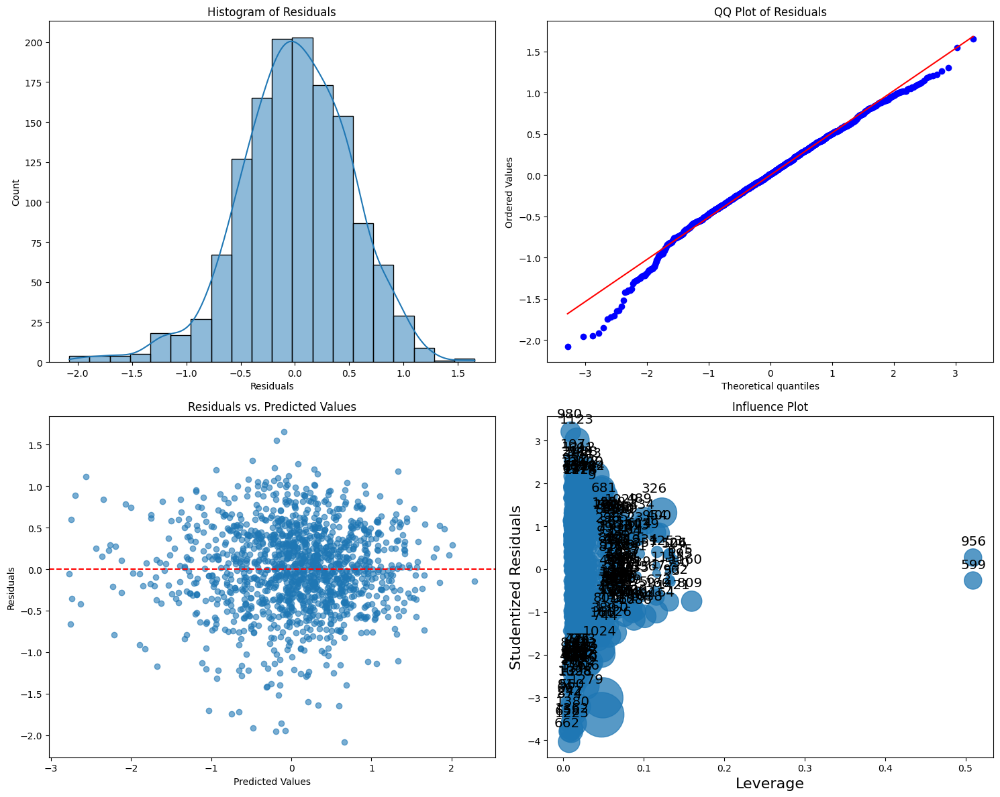

In [ ]:
from statsmodels.stats.outliers_influence import OLSInfluence
from statsmodels.graphics.regressionplots import influence_plot

# Calculate residuals
residuals = model_significant.resid

# Calculate the mean and root mean square (RMS) of the residuals
mean_residuals = np.mean(residuals)
rms_residuals = np.sqrt(np.mean(residuals**2))
print("Mean of residuals:", mean_residuals)
print("RMS of residuals:", rms_residuals)

# Calculate Cook's Distance and identify influential points
influence = OLSInfluence(model_significant)
cooks_d, _ = influence.cooks_distance

# Threshold for influential points (e.g., 4/N)
threshold = 4 / len(residuals)
influential_points = np.where(cooks_d > threshold)[0]
print(f"Threshold for Cook's Distance: {threshold:.4f}")
print("Influential Points (Indices):", influential_points)

# Create subplots for residual diagnostics
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

# Histogram of residuals
sns.histplot(residuals, kde=True, bins=20, ax=axes[0, 0])
axes[0, 0].set_title("Histogram of Residuals")
axes[0, 0].set_xlabel("Residuals")

# QQ-Normal plot of residuals
stats.probplot(residuals, dist="norm", plot=axes[0, 1])
axes[0, 1].set_title("QQ Plot of Residuals")

# Residual plot: residuals vs. predicted values
predicted_values = model_significant.fittedvalues
axes[1, 0].scatter(predicted_values, residuals, alpha=0.6)
axes[1, 0].axhline(0, color='red', linestyle='--')
axes[1, 0].set_title("Residuals vs. Predicted Values")
axes[1, 0].set_xlabel("Predicted Values")
axes[1, 0].set_ylabel("Residuals")

# Influence plot
influence_plot(model_significant, ax=axes[1, 1], criterion="cooks")
axes[1, 1].set_title("Influence Plot")

plt.tight_layout()
plt.show()

#### Model 4 vs Model 5

| **Metric/Criteria**                | **Model 4**                     | **Model 5**                     | **Comparison and Comments**                                                                    |
|:----------------------------------|:--------------------------------|:--------------------------------|:---------------------------------------------------------------------------------------------|
| **R-squared**                     | 0.676                          | 0.676                          | No change in overall model performance.                                                     |
| **Adjusted R-squared**            | 0.668                          | 0.668                          | Performance remains identical after ElasticNet pruning.                                     |
| **RMS of Residuals**              | 0.513                          | 0.513                          | Residual error is consistent between models.                                                |
| **AIC**                           | 2112                           | 2112                           | No difference in model quality based on AIC.                                                |
| **Condition Number**              | Stable                         | Stable                         | Condition number remains controlled, multicollinearity resolved.                            |
| **Coefficient Comparison**        | Stable coefficients            | Simplified coefficients        | Model 5 retains most significant coefficients via ElasticNet.                               |
| **Skewness**                      | -0.377                         | -0.393                         | Slight improvement in symmetry in Model 5.                                                  |
| **Kurtosis**                      | 3.744                          | 3.762                          | Residual distribution remains close to normal.                                              |
| **QQ Plot**                       | Slight deviations              | Aligned with line              | QQ plot improves in Model 5, indicating better normality.                                    |
| **Histogram of Residuals**        | Slight skew                    | Centered and normal            | Residual distribution improves with ElasticNet adjustments.                                 |
| **Residuals vs Predicted**        | Small spread                   | Robust, symmetric              | Residuals improve, showing a more symmetric spread in Model 5.                              |



Model 5 simplifies the model further using ElasticNet pruning while retaining key domain-relevant features. Here are some highlights:
- R², Adjusted R², RMS of residuals and AIC remain unchanged.
- Condition number stays stable, ensuring multicollinearity is resolved.
- Coefficient values become more parsimonious, focusing only on significant features.
- Model 5 improves interpretability by retaining critical categorical features like Neighborhood.
- Q-Q Plot: Residuals achieve near-perfect normality.
- Residuals vs Predicted: Residuals are robust, symmetric, and randomly spread.
- Model 5 strikes the optimal balance between simplicity, interpretability, and performance.

In general context, the features of MSZoning and Street are often overlooked by the a great number of buyers. In the Ames context, it is proven of a great number of properties have driven the sale price by total living by other remaining key features, which are more meaningful and statistically significant, not by those two features.

### Overall Summary of OLS Regression Models

| **Metric/Criteria**                | **Model 1** | **Model 2** | **Model 3** | **Model 4** | **Model 5** | **Comments**                                  |
|:----------------------------------|-------------|-------------|-------------|-------------|-------------|-----------------------------------------------|
| **R-squared**                     | 0.597       | 0.684       | 0.684       | 0.676       | 0.676       | Model performance stabilizes at Model 4/5.    |
| **Adjusted R-squared**            | 0.586       | 0.675       | 0.675       | 0.668       | 0.668       | Improvements from Model 1 to Model 2 hold.    |
| **AIC**                           | 2894        | 2085        | 2085        | 2112        | 2112        | AIC stabilizes despite feature simplification.|
| **BIC**                           | 3101        | 2283        | 2283        | 2289        | 2289        | No major penalty for model complexity.        |
| **RMS of Residuals**              | 0.635       | 0.507       | 0.507       | 0.513       | 0.513       | Residual error improves significantly early.  |
| **Condition Number**              | 3.77e+03    | 9.12e+15    | 3.87e+03    | 3.48e+03    | 3.48e+03    | Multicollinearity resolved in later models.   |
| **Influential Points (Count)**    | 101         | 51          | 60          | 60          | 60          | Reduction achieved in Model 2 remains stable.|
| **Coefficient Comparison**        | Mixed significance | Reduced extremes | Stable | Simplified | Simplified | Simplified coefficients in Models 4 and 5 show robust significance.
| **Skewness**                      | -0.701      | -0.377      | -0.393      | -0.377 | -0.393 | Generally decreasing in later models and a great change between Model 1 vs the rest of models.


Model progression from 1 to 5 shows a clear trade-off between model complexity, robustness, and performance. Model 2 has key improvement by addressing influential points. Model 3 simplifies the model with no performance loss. Model 4 resolves multicollinearity quite effectively. Model 5 offers optimal balance with ElasticNet pruning and domain-specific interpretability. It resolves multicollinearity issues, maintains a high R-squared, and minimizes influential points. This model should be chosen for further analysis. Each transition demonstrates statistical adjustments to improve the stability, accuracy and interpretability of the final model while improving performance metrics gradually.

## Save Data

In [ ]:
df_cleaned.to_csv("/content/drive/My Drive/Colab Notebooks/Harvard/CSCI E-83/Project/proposal data 3.csv", index=False)

In [ ]:
df_cleaned.shape

(1359, 39)

## Parametric Bootstrapping

As I have retained the most efficient set of the most significant features from the five models, I will evaluate the uncertainty of the OLS regression coefficients, focusing on their sampling distributions and constructing confidence intervals (CIs). Parametric bootstrapping can allow me to quantify uncertainty by assessing the variability in parameter estimates (regression coefficients) and construct confidence intervals based on the experienced distribution of the bootstrapped coefficients. Then I can assess normality with the Q-Q plotto check how closely the bootstrapped coefficients follow a normal distribution. By resampling the data, I can ensure with more confidence that the OLS results are not overly sensitive to a specific set of data.

In [ ]:
X_significant = df_cleaned.drop(columns=["MSZoning_FV", "MSZoning_RH", "MSZoning_RL", "MSZoning_RM"] + ["Street_Pave"] + ["Log_Price_Per_TotalLivingArea"])
#X_significant = sm.add_constant(X_significant)
list_significant_features = list(X_significant.columns)

Running 10000 bootstrap iterations...

Parameter: Intercept
Mean: -1.2593
Lower 95% CI: -2.0732
Upper 95% CI: -0.4130


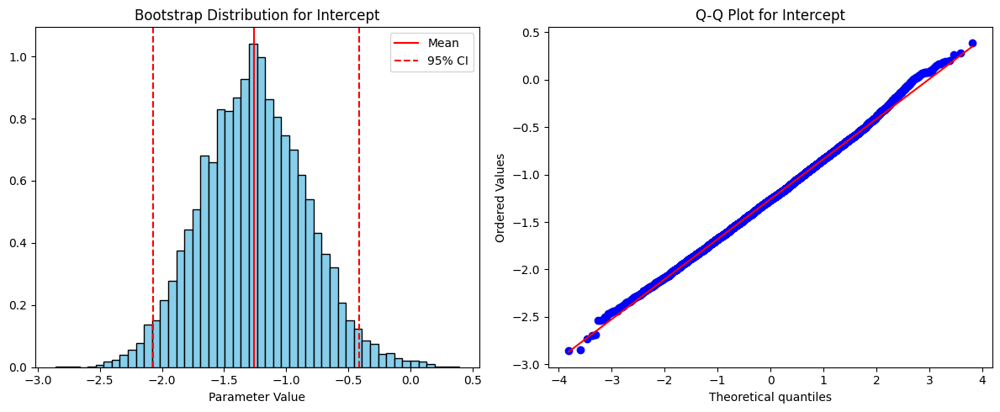


Parameter: MSSubClass[T.30]
Mean: -0.1684
Lower 95% CI: -0.4129
Upper 95% CI: 0.0702


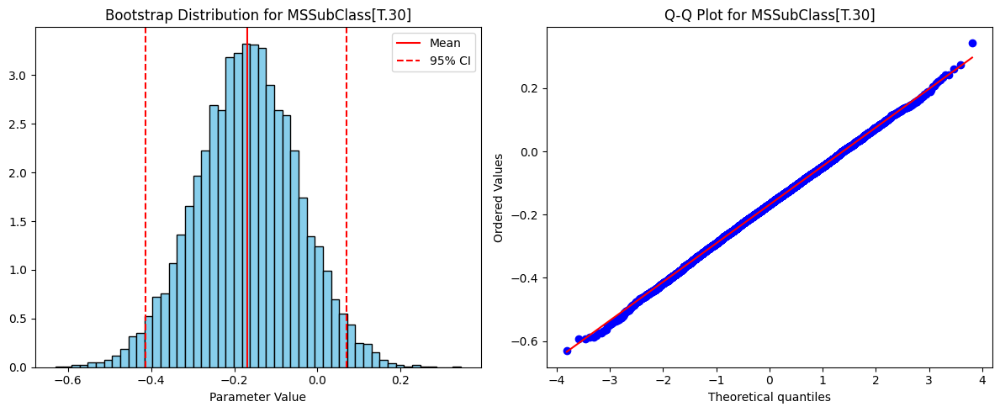


Parameter: MSSubClass[T.40]
Mean: -0.4649
Lower 95% CI: -1.2217
Upper 95% CI: 0.0474


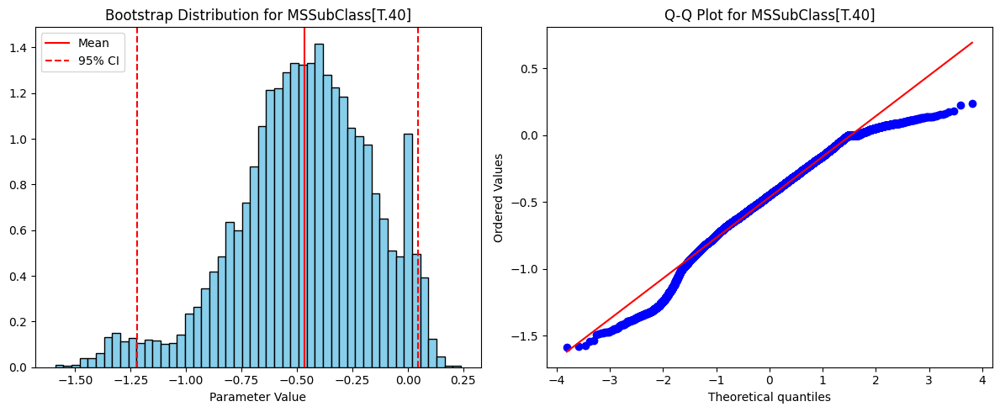


Parameter: MSSubClass[T.45]
Mean: 0.0677
Lower 95% CI: -0.2232
Upper 95% CI: 0.3422


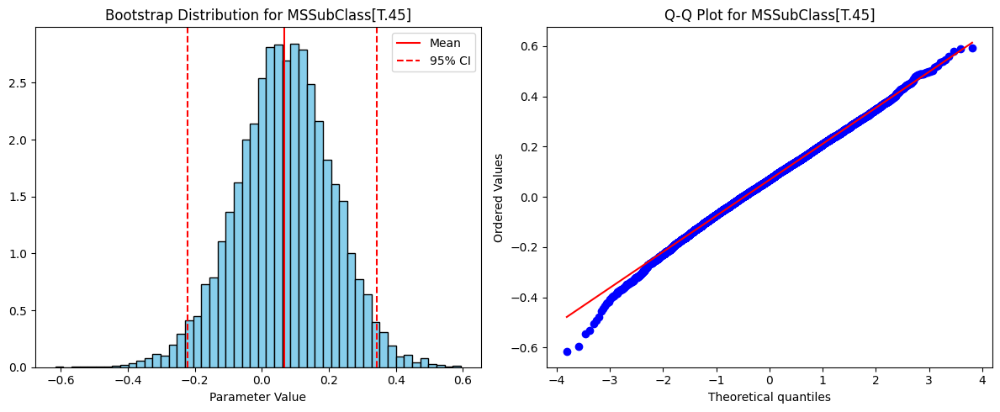


Parameter: MSSubClass[T.50]
Mean: -0.7142
Lower 95% CI: -0.8672
Upper 95% CI: -0.5583


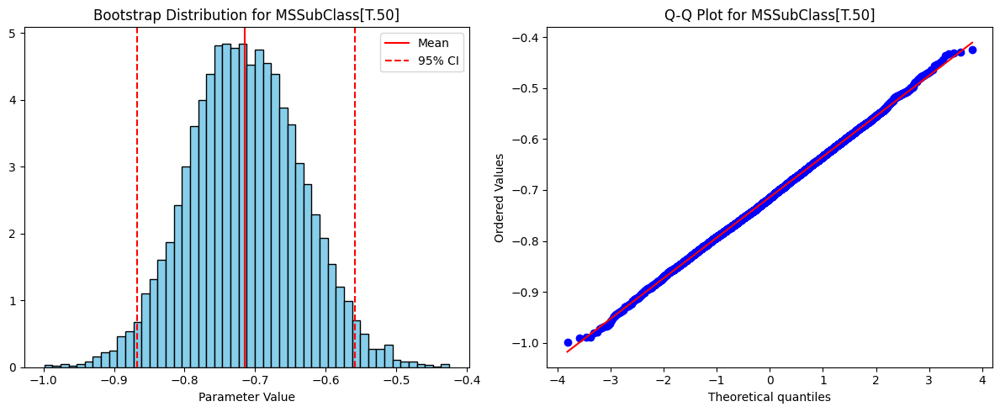


Parameter: MSSubClass[T.60]
Mean: -0.4238
Lower 95% CI: -0.6499
Upper 95% CI: -0.1946


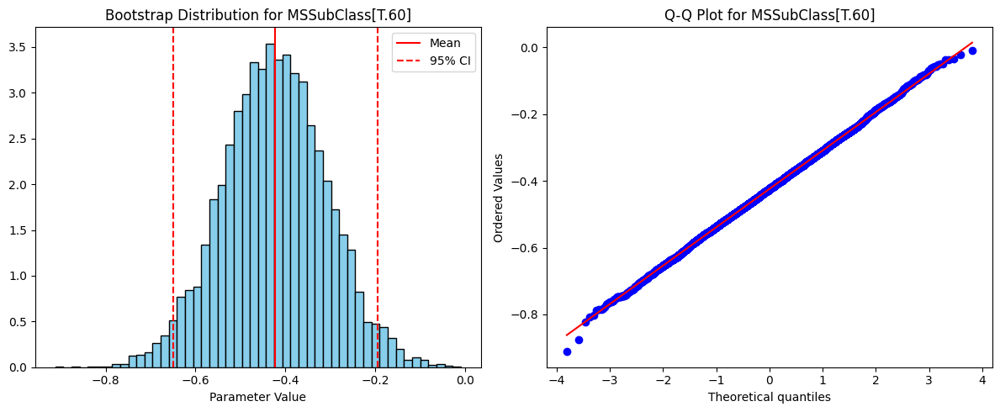


Parameter: MSSubClass[T.70]
Mean: -0.5495
Lower 95% CI: -0.8473
Upper 95% CI: -0.2591


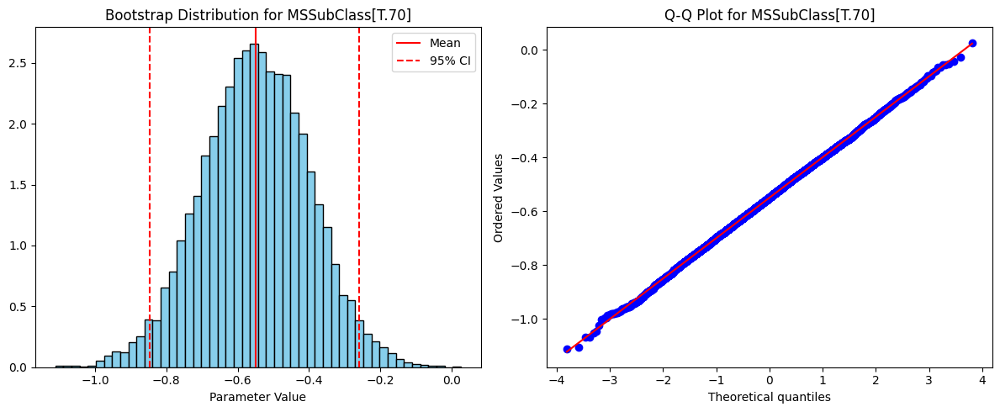


Parameter: MSSubClass[T.75]
Mean: -0.7120
Lower 95% CI: -1.1201
Upper 95% CI: -0.3007


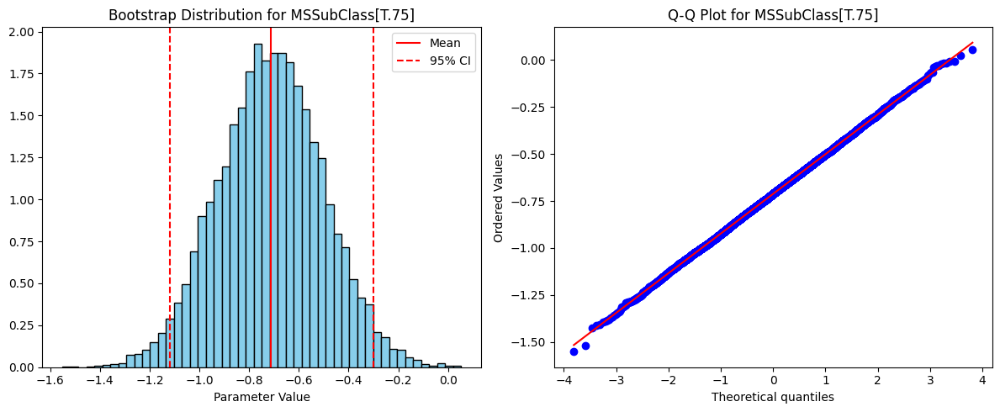


Parameter: MSSubClass[T.80]
Mean: 0.0102
Lower 95% CI: -0.2538
Upper 95% CI: 0.2760


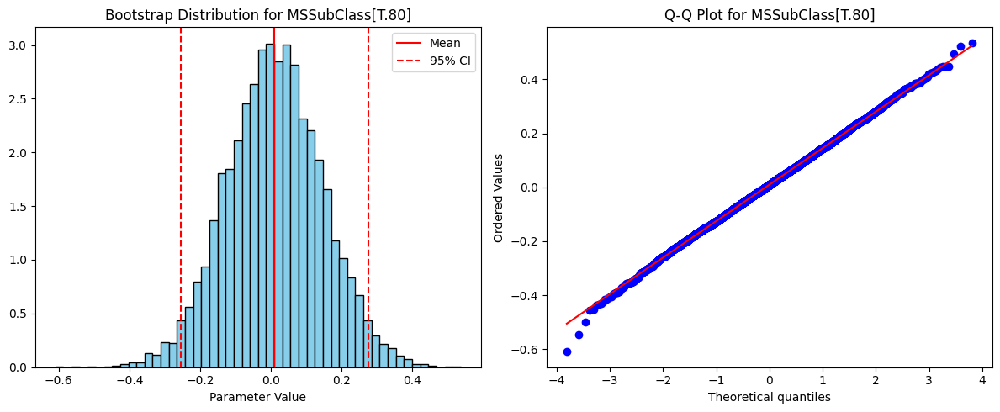


Parameter: MSSubClass[T.85]
Mean: 0.4491
Lower 95% CI: 0.1314
Upper 95% CI: 0.7550


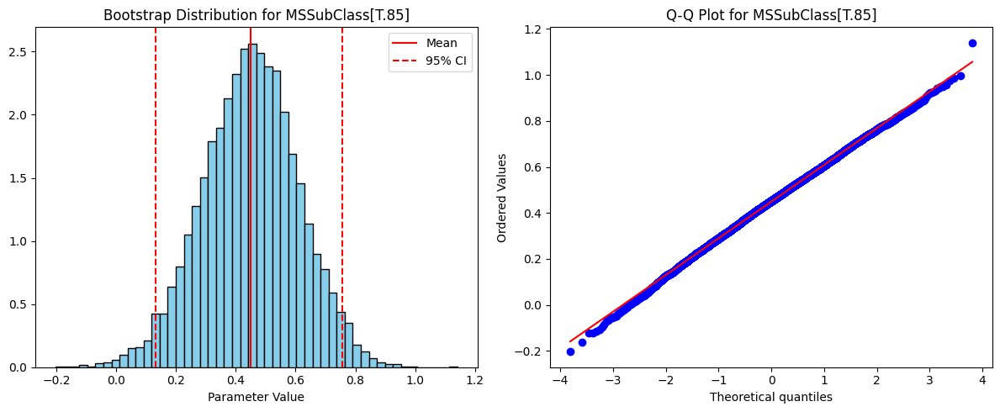


Parameter: MSSubClass[T.90]
Mean: -0.1144
Lower 95% CI: -0.3956
Upper 95% CI: 0.1822


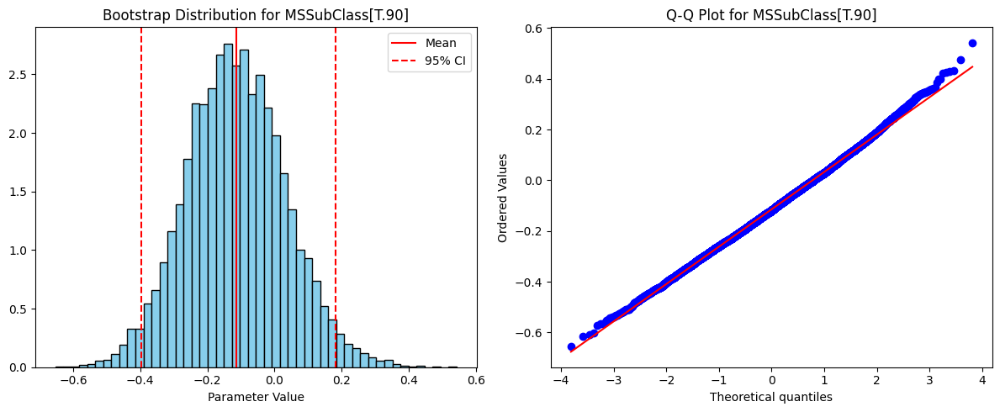


Parameter: MSSubClass[T.120]
Mean: -0.2290
Lower 95% CI: -0.3769
Upper 95% CI: -0.0856


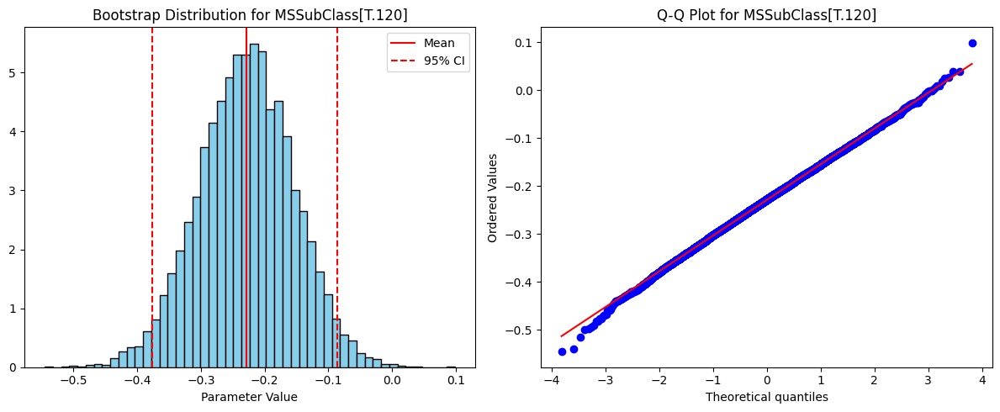


Parameter: MSSubClass[T.160]
Mean: -0.8387
Lower 95% CI: -1.1154
Upper 95% CI: -0.5672


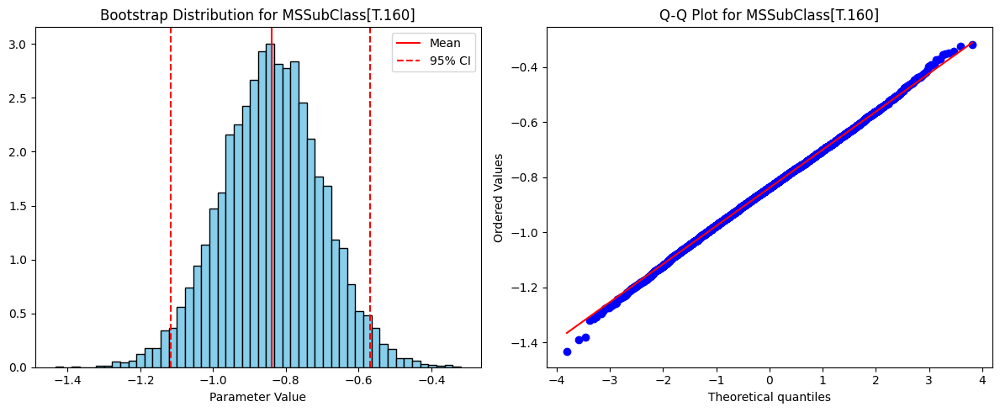


Parameter: MSSubClass[T.180]
Mean: 0.0730
Lower 95% CI: -0.4204
Upper 95% CI: 0.4855


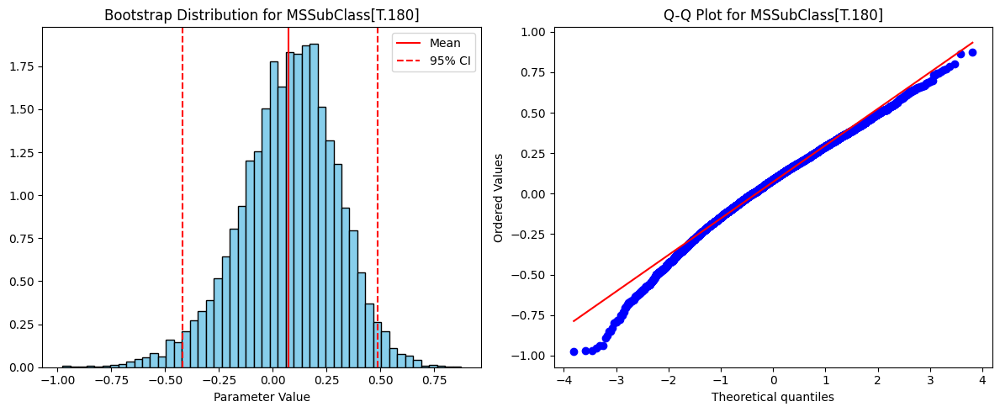


Parameter: MSSubClass[T.190]
Mean: -0.2771
Lower 95% CI: -0.6011
Upper 95% CI: 0.0424


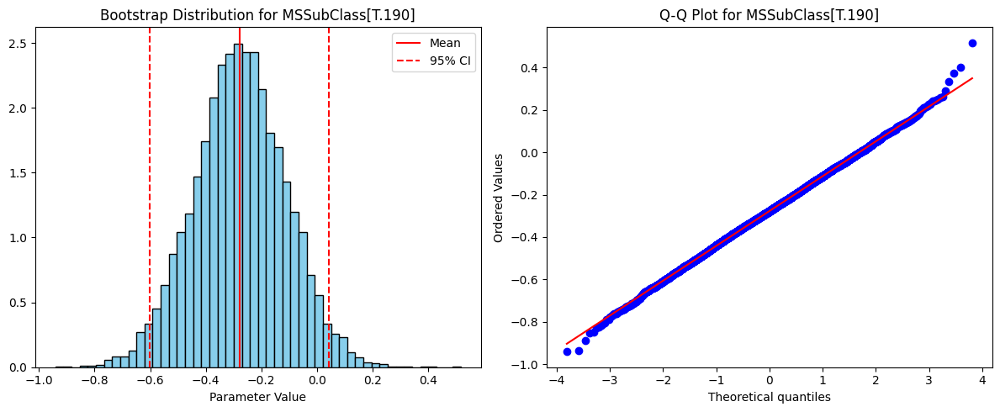


Parameter: Neighborhood_Blueste[T.1]
Mean: -0.2435
Lower 95% CI: -0.5372
Upper 95% CI: 0.0000


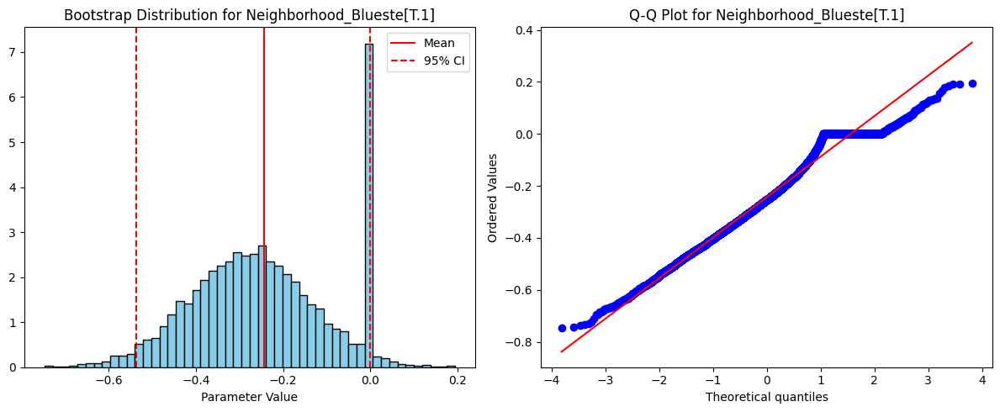


Parameter: Neighborhood_BrDale[T.1]
Mean: -0.3237
Lower 95% CI: -0.6231
Upper 95% CI: -0.0129


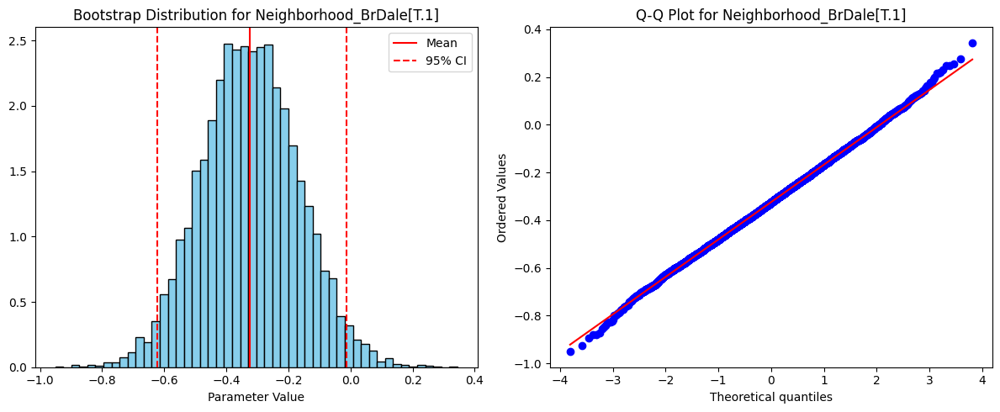


Parameter: Neighborhood_BrkSide[T.1]
Mean: -0.4149
Lower 95% CI: -0.7134
Upper 95% CI: -0.1227


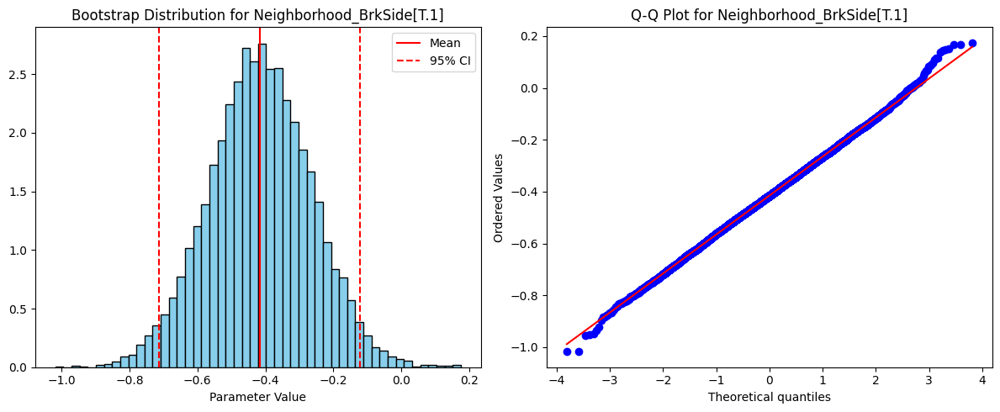


Parameter: Neighborhood_ClearCr[T.1]
Mean: -0.2451
Lower 95% CI: -0.5582
Upper 95% CI: 0.0662


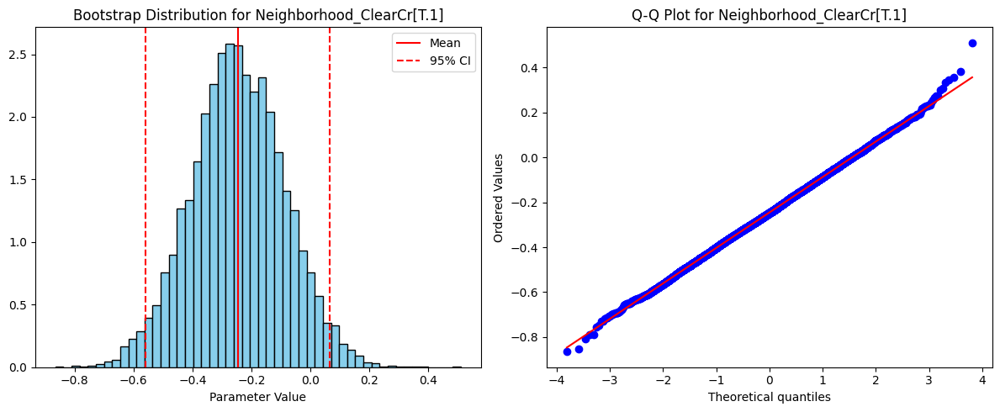


Parameter: Neighborhood_CollgCr[T.1]
Mean: -0.0977
Lower 95% CI: -0.3325
Upper 95% CI: 0.1357


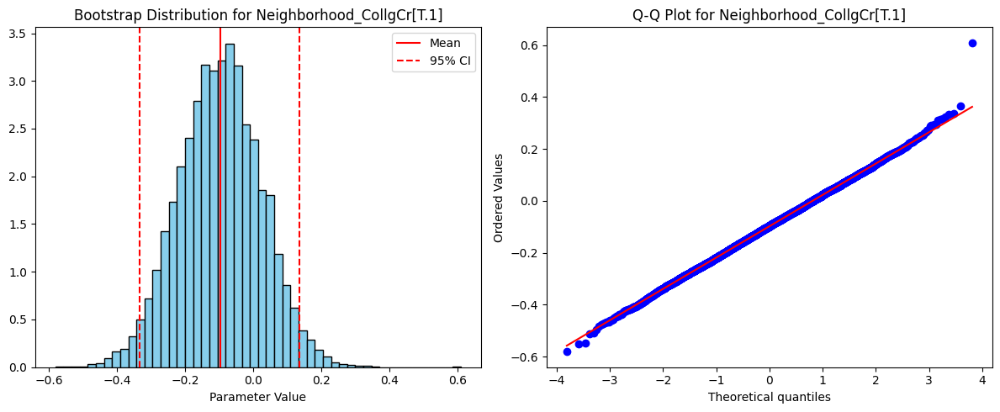


Parameter: Neighborhood_Crawfor[T.1]
Mean: -0.0578
Lower 95% CI: -0.3589
Upper 95% CI: 0.2475


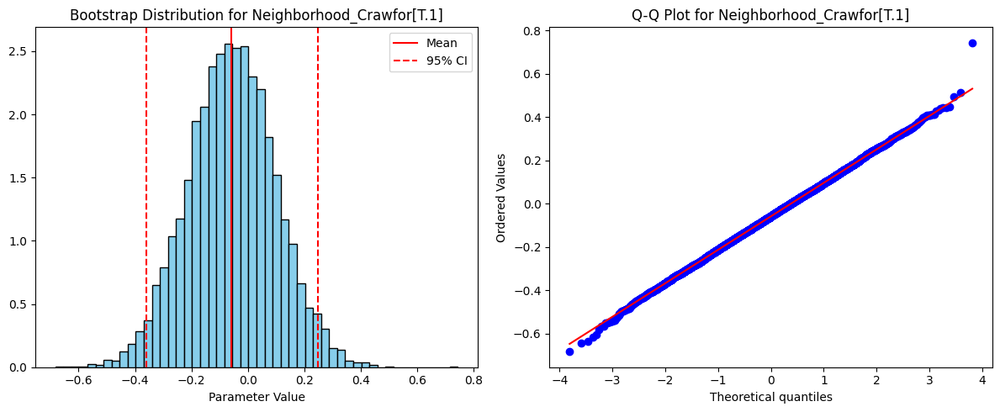


Parameter: Neighborhood_Edwards[T.1]
Mean: -0.8801
Lower 95% CI: -1.1476
Upper 95% CI: -0.6050


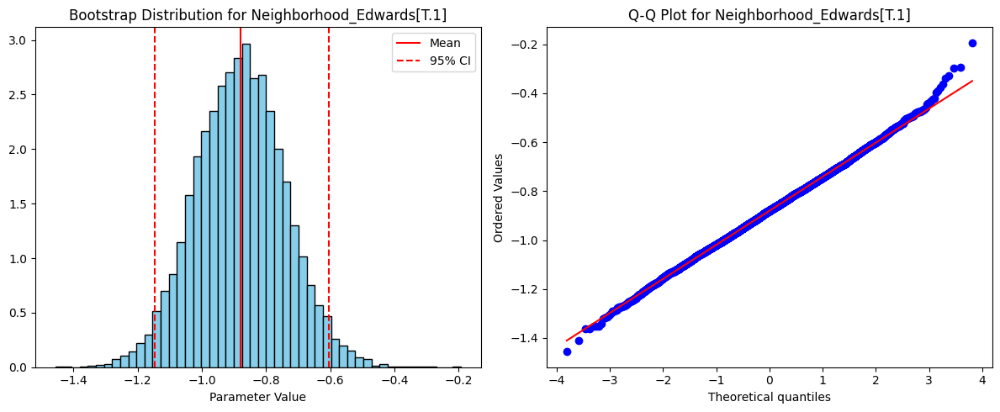


Parameter: Neighborhood_Gilbert[T.1]
Mean: -0.3058
Lower 95% CI: -0.5477
Upper 95% CI: -0.0607


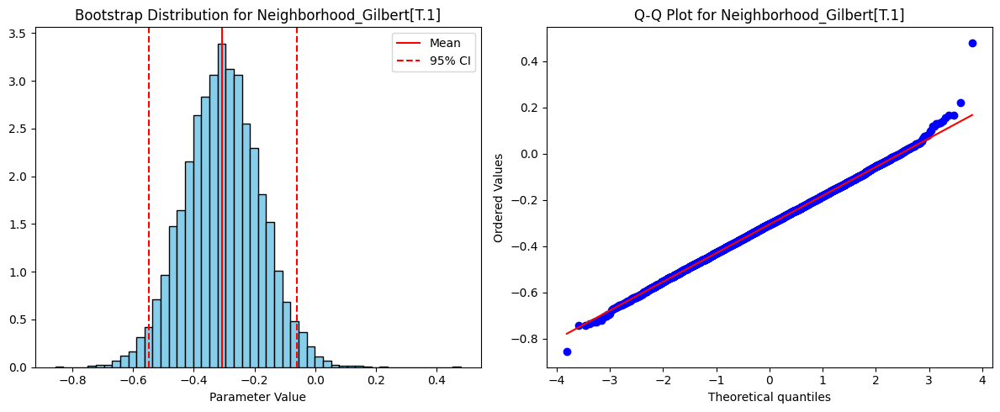


Parameter: Neighborhood_IDOTRR[T.1]
Mean: -0.9796
Lower 95% CI: -1.4022
Upper 95% CI: -0.5615


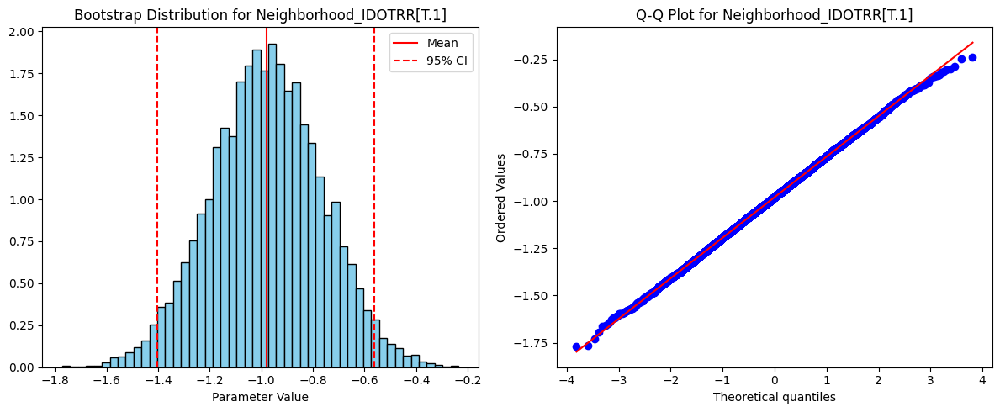


Parameter: Neighborhood_MeadowV[T.1]
Mean: -0.5744
Lower 95% CI: -0.8768
Upper 95% CI: -0.2894


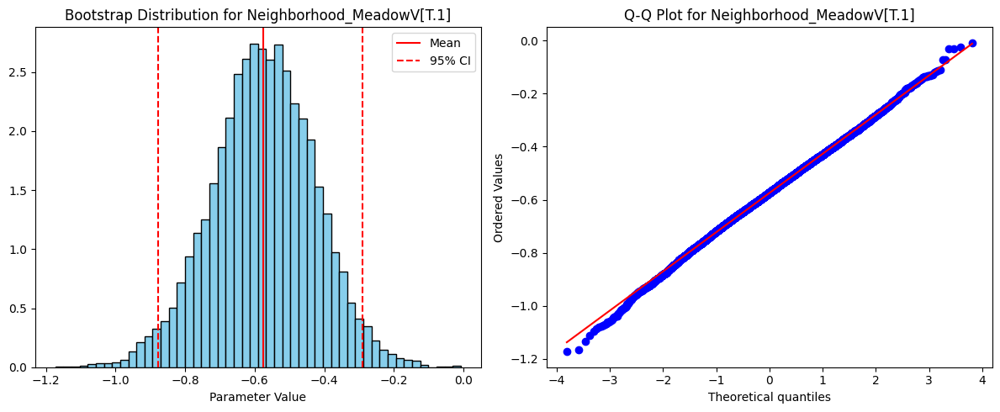


Parameter: Neighborhood_Mitchel[T.1]
Mean: -0.3160
Lower 95% CI: -0.5897
Upper 95% CI: -0.0472


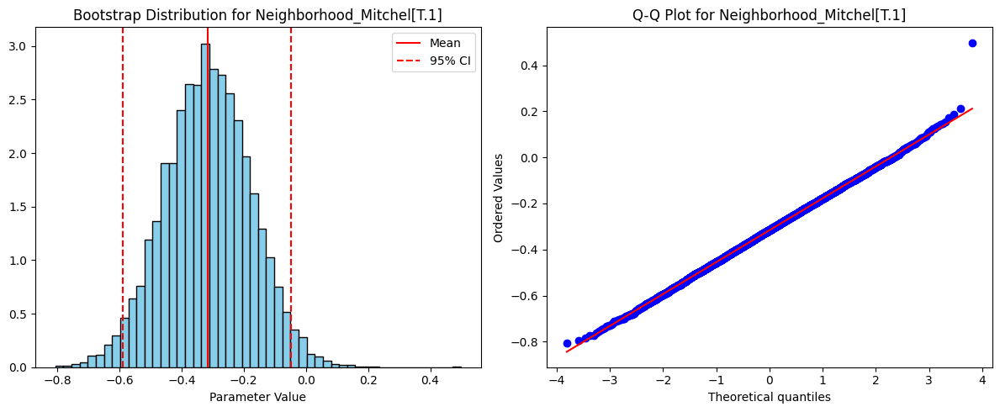


Parameter: Neighborhood_NAmes[T.1]
Mean: -0.5760
Lower 95% CI: -0.8229
Upper 95% CI: -0.3330


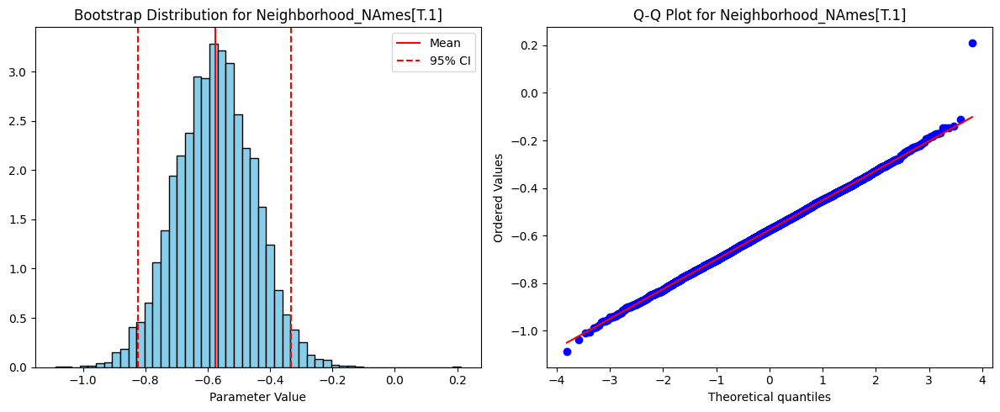


Parameter: Neighborhood_NPkVill[T.1]
Mean: -0.1564
Lower 95% CI: -0.4706
Upper 95% CI: 0.1659


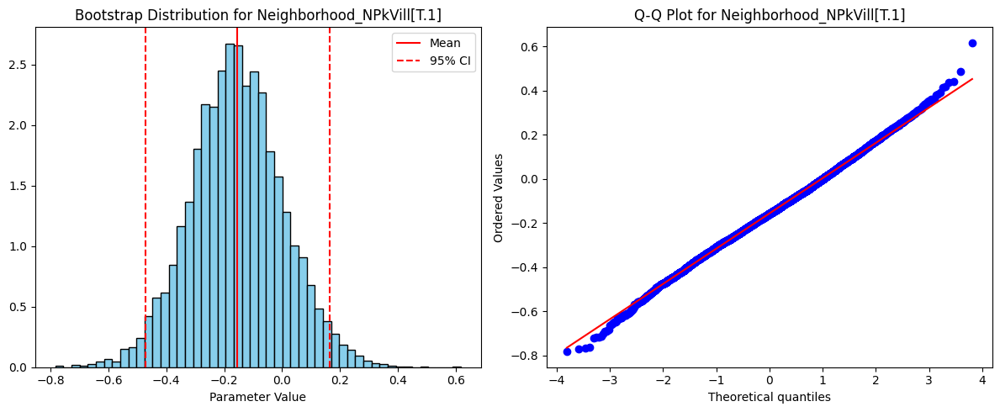


Parameter: Neighborhood_NWAmes[T.1]
Mean: -0.6204
Lower 95% CI: -0.8753
Upper 95% CI: -0.3646


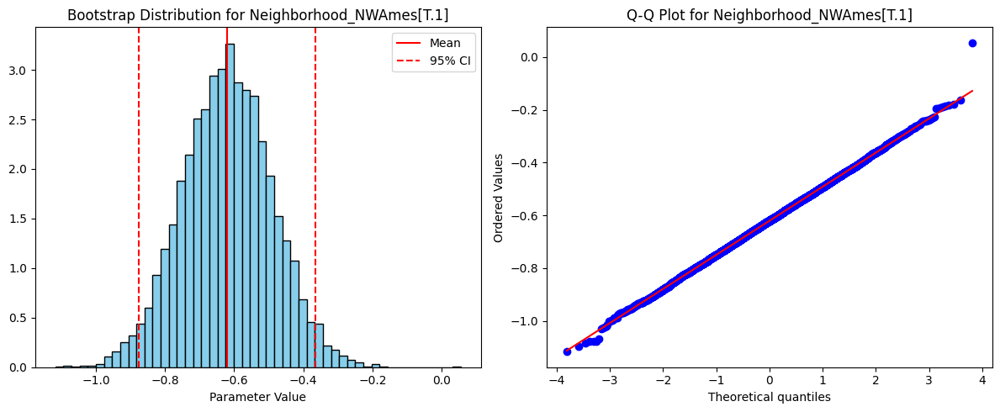


Parameter: Neighborhood_NoRidge[T.1]
Mean: 0.0812
Lower 95% CI: -0.1865
Upper 95% CI: 0.3482


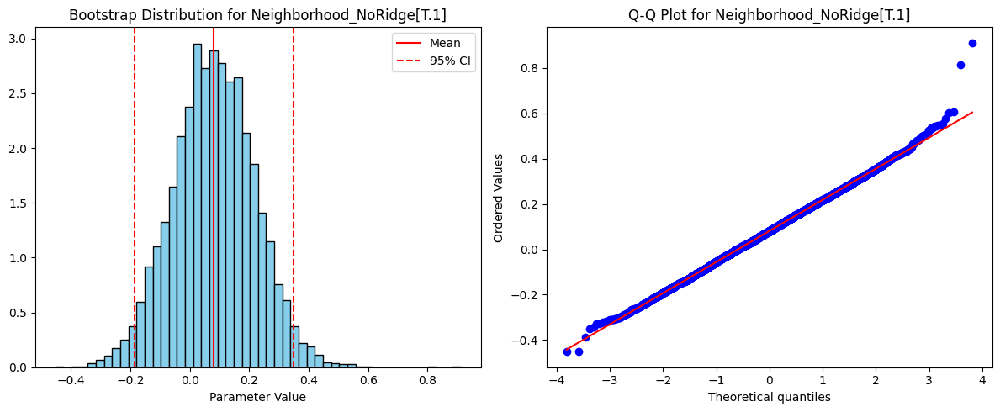


Parameter: Neighborhood_NridgHt[T.1]
Mean: 0.5552
Lower 95% CI: 0.3153
Upper 95% CI: 0.8028


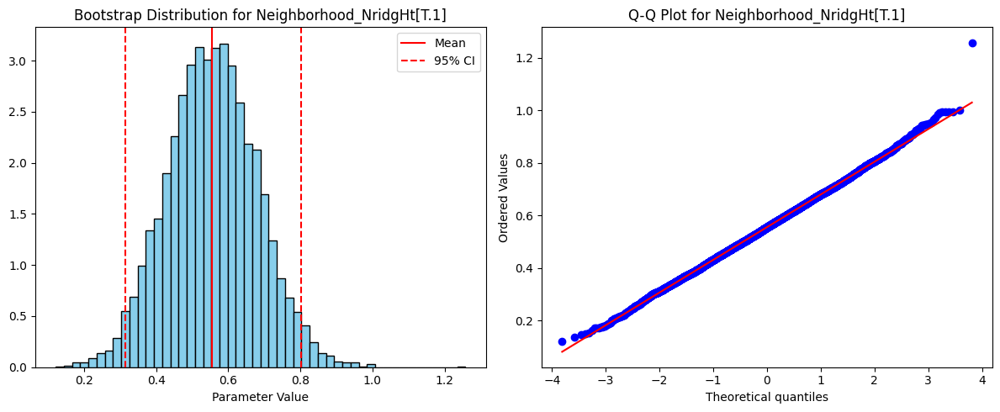


Parameter: Neighborhood_OldTown[T.1]
Mean: -0.8771
Lower 95% CI: -1.1683
Upper 95% CI: -0.5914


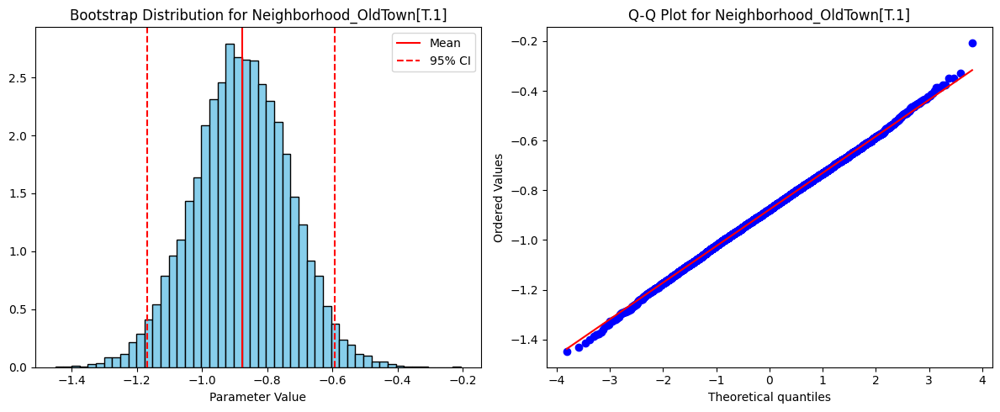


Parameter: Neighborhood_SWISU[T.1]
Mean: -0.8579
Lower 95% CI: -1.1993
Upper 95% CI: -0.5127


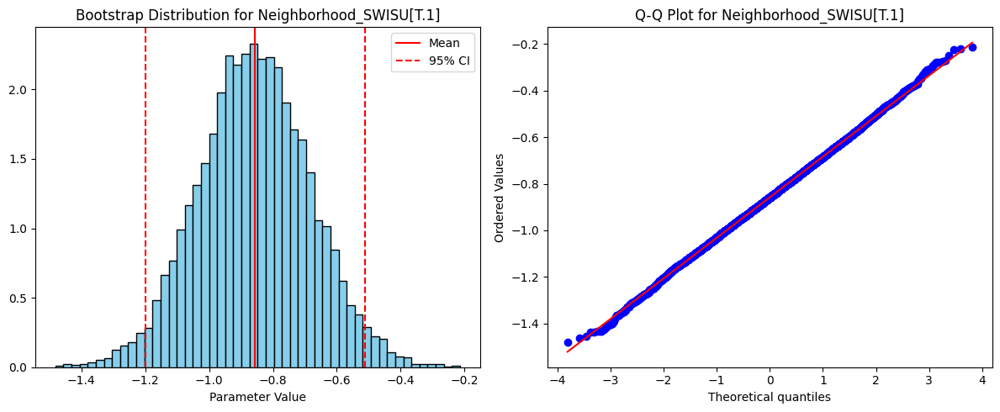


Parameter: Neighborhood_Sawyer[T.1]
Mean: -0.5062
Lower 95% CI: -0.7846
Upper 95% CI: -0.2352


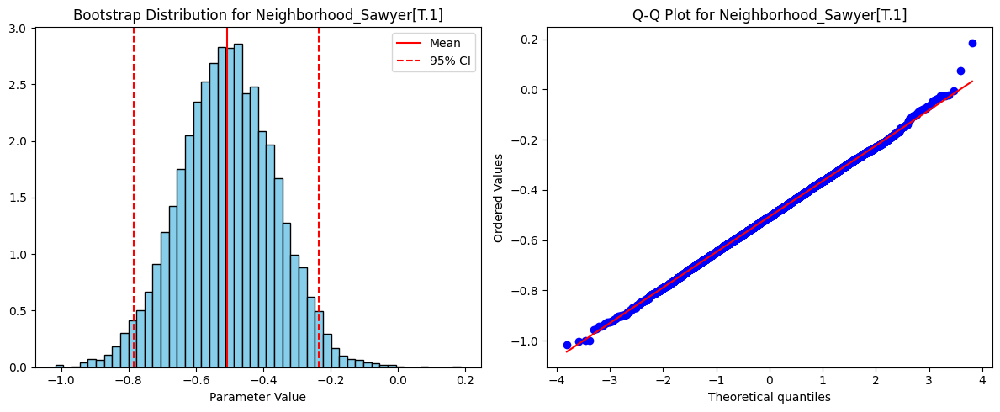


Parameter: Neighborhood_SawyerW[T.1]
Mean: -0.3616
Lower 95% CI: -0.6139
Upper 95% CI: -0.1078


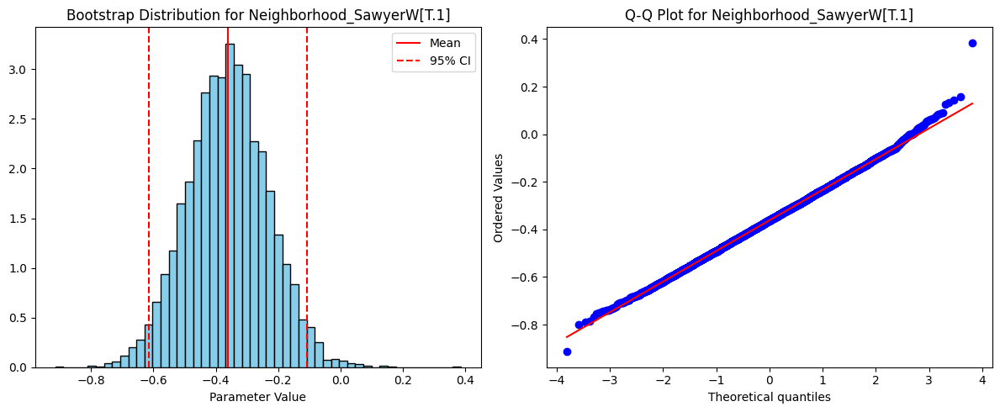


Parameter: Neighborhood_Somerst[T.1]
Mean: 0.2482
Lower 95% CI: 0.0142
Upper 95% CI: 0.4843


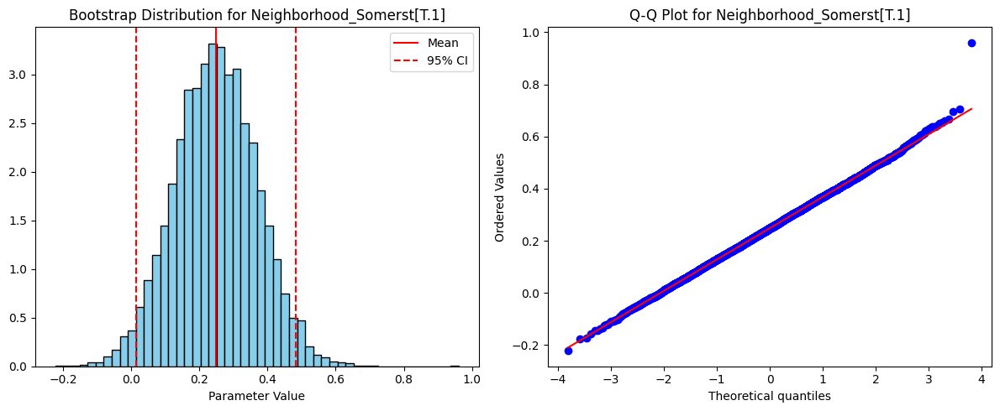


Parameter: Neighborhood_StoneBr[T.1]
Mean: 0.4587
Lower 95% CI: 0.1974
Upper 95% CI: 0.7275


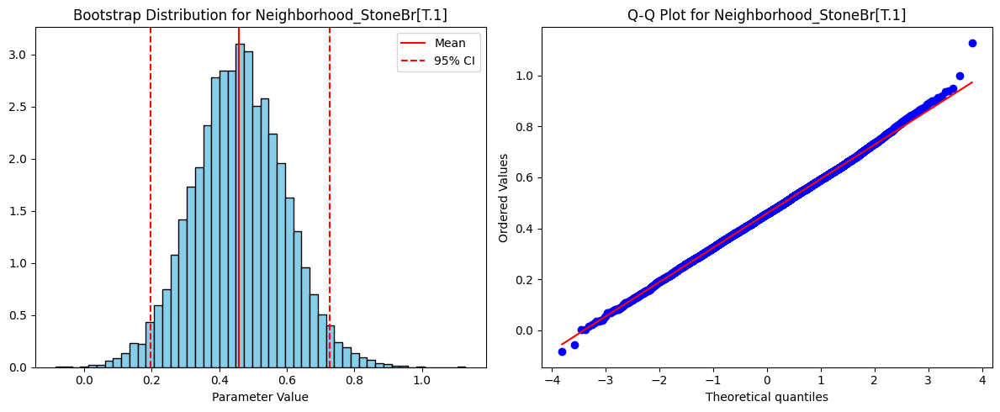


Parameter: Neighborhood_Timber[T.1]
Mean: -0.1235
Lower 95% CI: -0.4264
Upper 95% CI: 0.1731


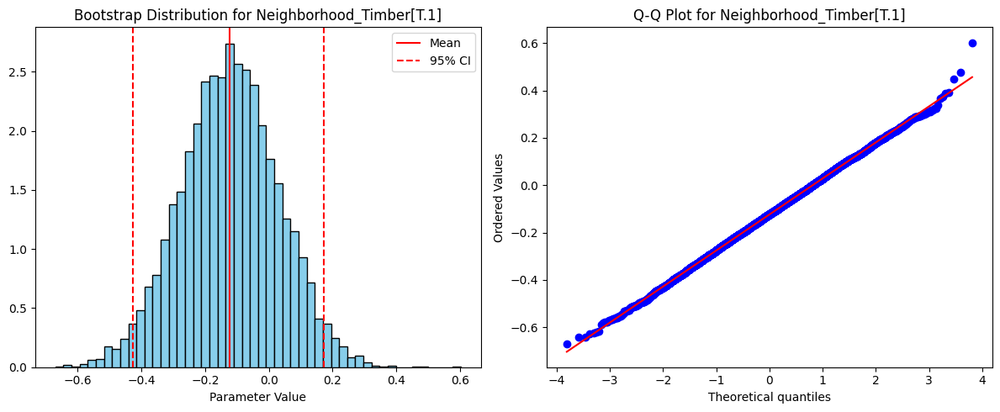


Parameter: Neighborhood_Veenker[T.1]
Mean: 0.0176
Lower 95% CI: -0.3584
Upper 95% CI: 0.3813


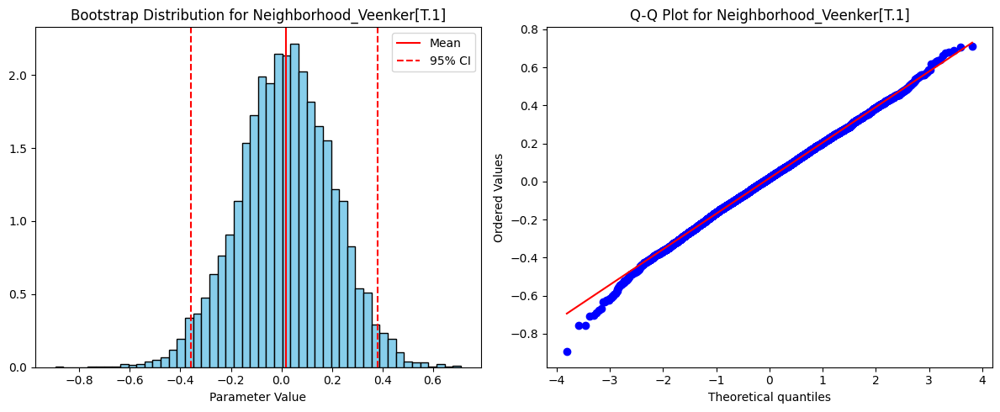


Parameter: BldgType_Single_Family[T.1]
Mean: 0.1096
Lower 95% CI: -0.0471
Upper 95% CI: 0.2608


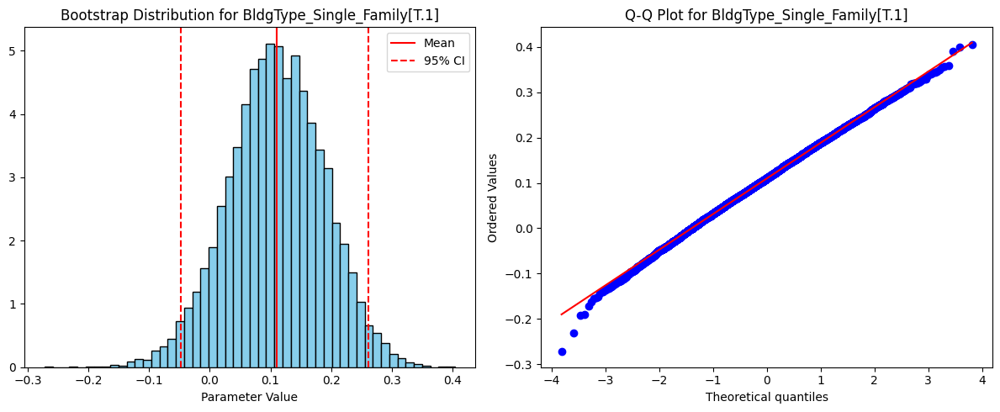


Parameter: HouseStyle_Single_Family[T.1]
Mean: 0.0983
Lower 95% CI: -0.1241
Upper 95% CI: 0.3166


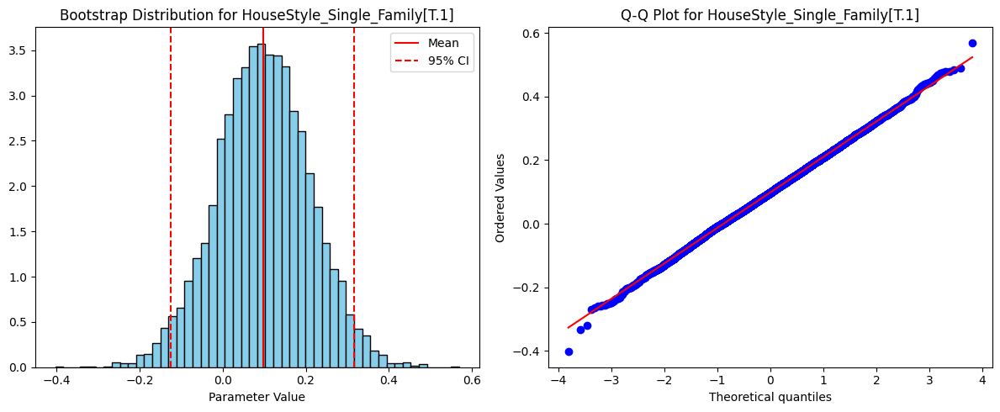


Parameter: BedroomAbvGr
Mean: -0.1407
Lower 95% CI: -0.1887
Upper 95% CI: -0.0931


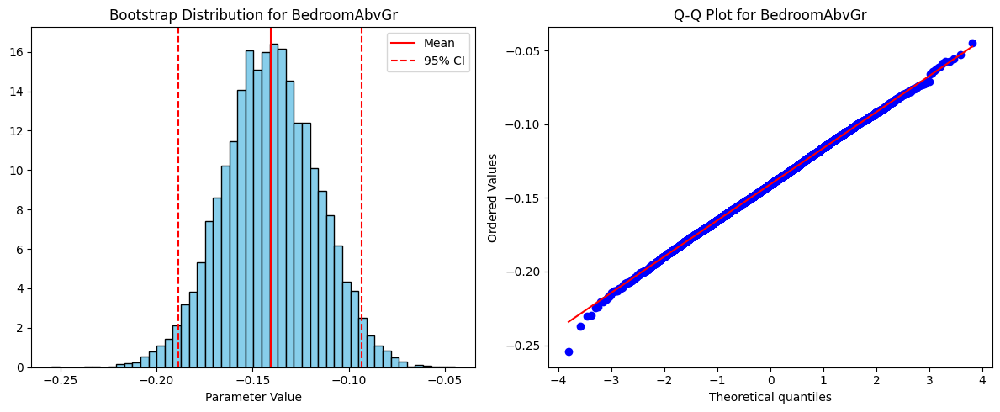


Parameter: KitchenAbvGr
Mean: -0.2060
Lower 95% CI: -0.2578
Upper 95% CI: -0.1581


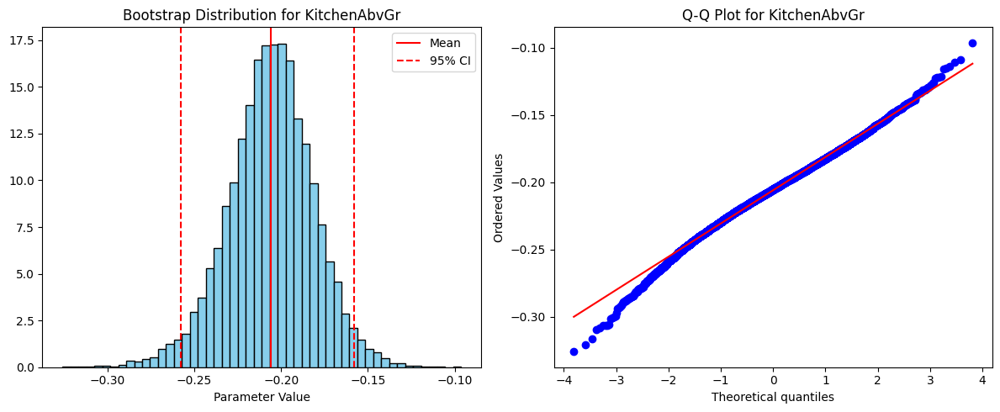


Parameter: TotRmsAbvGrd
Mean: -0.2002
Lower 95% CI: -0.2538
Upper 95% CI: -0.1451


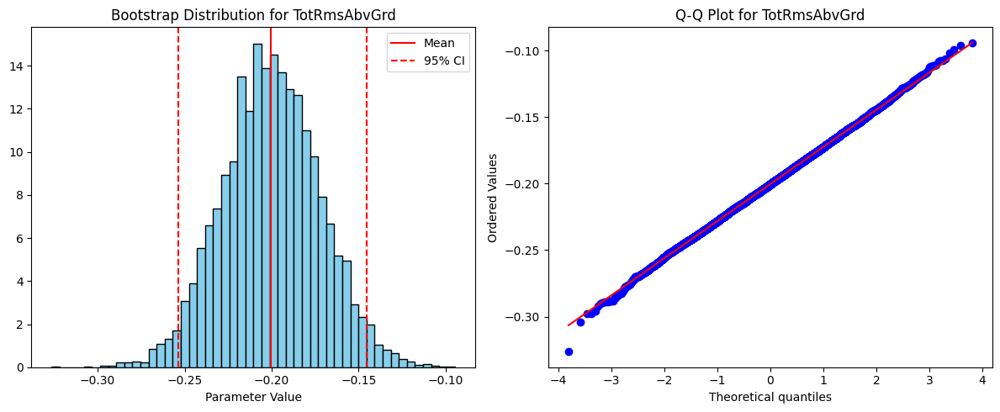


Parameter: GarageCars
Mean: 0.1407
Lower 95% CI: 0.1007
Upper 95% CI: 0.1810


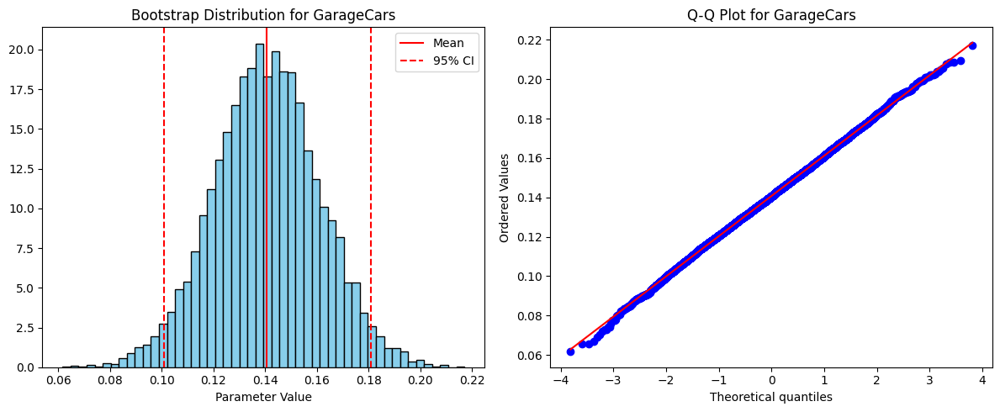


Parameter: TotalBath
Mean: 0.1230
Lower 95% CI: 0.0837
Upper 95% CI: 0.1622


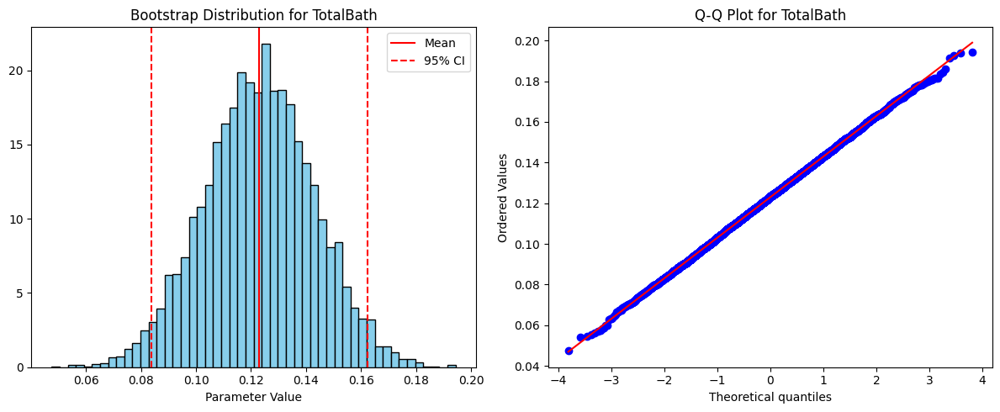


Parameter: Log_LotArea
Mean: 0.1900
Lower 95% CI: 0.0959
Upper 95% CI: 0.2781


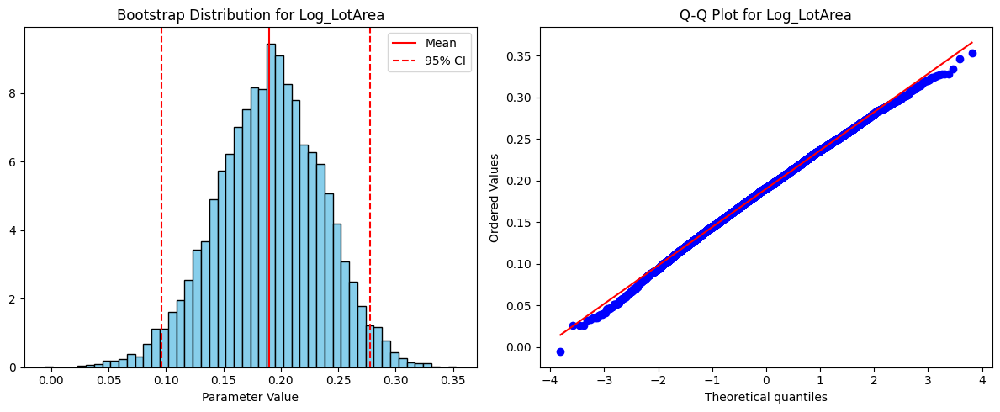

In [ ]:
import statsmodels.api as sm
import scipy.stats as ss

# Define the significant features and target
X_significant = df_cleaned.drop(columns=["MSZoning_FV", "MSZoning_RH", "MSZoning_RL", "MSZoning_RM"] +
                                ["Street_Pave", "Log_Price_Per_TotalLivingArea"])
y = df_cleaned['Log_Price_Per_TotalLivingArea']

list_significant_features = list(X_significant.columns)

# Add constant for intercept
X_significant = sm.add_constant(X_significant)

# Combine X and y into one DataFrame for bootstrapping
df_final = X_significant.copy()
df_final['Log_Price_Per_TotalLivingArea'] = y

# Define the formula for the OLS model
formula = 'Log_Price_Per_TotalLivingArea ~ ' + ' + '.join(list_significant_features)

# Updated function for bootstrapping
def resample_regression(df, n_boots, formula):
    boot_samples = []
    n_samples = df.shape[0]
    for i in range(n_boots):
        boot_sample = df.sample(n=n_samples, replace=True)  # Resample with replacement
        boot_model = sm.OLS.from_formula(formula, data=boot_sample).fit()
        boot_samples.append(boot_model.params.values)
    return np.array(boot_samples)

# Increase the number of bootstrap samples (10,000 for better accuracy)
n_bootstraps = 10000
print(f"Running {n_bootstraps} bootstrap iterations...")
param_boots = resample_regression(df_final, n_boots=n_bootstraps, formula=formula)

# Function to compute confidence intervals
def compute_CI(values, p=0.05):
    mean = np.mean(values)
    lower = np.percentile(values, 100 * (p / 2))
    upper = np.percentile(values, 100 * (1 - p / 2))
    print(f"Mean: {mean:.4f}")
    print(f"Lower 95% CI: {lower:.4f}")
    print(f"Upper 95% CI: {upper:.4f}")
    return mean, lower, upper

# Plot function for bootstrap distributions
def plot_boot_params(params, parameter='intercept'):
    mean, lower, upper = compute_CI(params)
    fig, ax = plt.subplots(1, 2, figsize=(12, 5))

    # Histogram with CIs
    ax[0].hist(params, bins=50, color='skyblue', edgecolor='black', density=True)
    ax[0].axvline(mean, color='red', label="Mean", linestyle='-')
    ax[0].axvline(lower, color='red', linestyle='--', label="95% CI")
    ax[0].axvline(upper, color='red', linestyle='--')
    ax[0].set_title(f"Bootstrap Distribution for {parameter}")
    ax[0].set_xlabel("Parameter Value")
    ax[0].legend()

    # Q-Q plot
    ss.probplot(params, plot=ax[1])
    ax[1].set_title(f"Q-Q Plot for {parameter}")

    plt.tight_layout()
    plt.show()

# Extract parameter names from the model
param_names = sm.OLS.from_formula(formula, data=df_final).fit().params.index.tolist()

# Plot bootstrap distributions for each parameter
for i, param_name in enumerate(param_names):
    print(f"\nParameter: {param_name}")
    plot_boot_params(param_boots[:, i], parameter=param_name)


Most of parameters express nearly normal distribution with slight deviations only, except the features of MSSubclass, which is previously identified as insignifcant, and Neighborhood_Blueste. This could be that the Blueste might cause some outliers diminishing the explanatory power for driving the target.

Looking at the parameter BedroomAbvGr particularly as it is one of the key predictor for the target, having nearly normal distribution as many others. And its Confidence Interval has Lower Bound at -0.2578 and Upper Bound at -0.1581, meaning that there is a 95% probability that the true coefficient lies between -0.2578 and -0.1581. Regarding the QQ plot, the points align closely with the red line, indicating that the bootstrapped parameter values are consistent with a normal distribution. When referring to the histogram, the distribution appears approximately normal, centered around -0.2060 and the red dashed lines mark the confidence interval. Most of its distribution is within the confidence interval, indicating that this feature's values are relatively stable and consistent. In other words, it is not overly influenced by noise or random fluctuations. Therefore, this feature contributes is reliability and significant impact to the model's predictions because the observed values align well with the model's expected behavior.



## Bayesian MCMC

Now I will apply Bayesian Monte Carlo sampling approach applies probabilistic regression modeling using Bayesian inference to understand and quantify uncertainty in predictions and model parameters. It is particularly useful in housing price analysis where data uncertainty, heterogeneity and complex relationships exist when I have multiple features contributing to the target.

In the Model Definition, I will assign weakly informative priors to the model parameters. When the linear model predicts the target as a combination of the predictors and their coefficients, the Gaussian likelihood accounts for observation noise.

Regarding the posterior sampling, in this Bayesian model, I will use Monte Carlo sampling, which is performed using Markov Chain Monte Carlo MCMC methods. The posterior distribution of the model parameters is generated, capturing uncertainty and variability in their estimates.

I will then diagnose further using these plots. Trace plots can visualize MCMC convergence for the intercept, coefficients and sigma. If they can provide stable and non-diverging traces, they will indicate convergence. Forest plots can summarize credible intervals, such as 94% HDI for the model coefficients, illustrating which predictors significantly impact the target: log sale price by total living area. Also, Posterior Predictive Checks PPC can compare observed values to simulated predictive samples to evaluate model fit. Observed vs Predicted can show that posterior predictive samples are averaged to produce predictions. Finally, a histogram illustrates the overlays between the observed target variable and the predicted target for visual comparison.

In [ ]:
df_cleaned = pd.read_csv("/content/drive/My Drive/Colab Notebooks/Harvard/CSCI E-83/Project/proposal data 3.csv")

In [ ]:
# df_cleaned.dtypes

In [ ]:
df_cleaned.columns

Index(['MSSubClass', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd',
       'GarageCars', 'TotalBath', 'Log_Price_Per_TotalLivingArea',
       'Log_LotArea', 'MSZoning_FV', 'MSZoning_RH', 'MSZoning_RL',
       'MSZoning_RM', 'Street_Pave', 'Neighborhood_Blueste',
       'Neighborhood_BrDale', 'Neighborhood_BrkSide', 'Neighborhood_ClearCr',
       'Neighborhood_CollgCr', 'Neighborhood_Crawfor', 'Neighborhood_Edwards',
       'Neighborhood_Gilbert', 'Neighborhood_IDOTRR', 'Neighborhood_MeadowV',
       'Neighborhood_Mitchel', 'Neighborhood_NAmes', 'Neighborhood_NPkVill',
       'Neighborhood_NWAmes', 'Neighborhood_NoRidge', 'Neighborhood_NridgHt',
       'Neighborhood_OldTown', 'Neighborhood_SWISU', 'Neighborhood_Sawyer',
       'Neighborhood_SawyerW', 'Neighborhood_Somerst', 'Neighborhood_StoneBr',
       'Neighborhood_Timber', 'Neighborhood_Veenker', 'BldgType_Single_Family',
       'HouseStyle_Single_Family'],
      dtype='object')

In [ ]:
import pymc as pm
import arviz as az

features = [
    'BedroomAbvGr', 'KitchenAbvGr', 'GarageCars', 'TotalBath',
    'Log_LotArea', 'Neighborhood_Blueste', 'Neighborhood_BrDale', 'Neighborhood_BrkSide',
    'Neighborhood_ClearCr', 'Neighborhood_CollgCr', 'Neighborhood_Crawfor',
    'Neighborhood_Edwards', 'Neighborhood_Gilbert', 'Neighborhood_IDOTRR',
    'Neighborhood_MeadowV', 'Neighborhood_Mitchel', 'Neighborhood_NAmes',
    'Neighborhood_NPkVill', 'Neighborhood_NWAmes', 'Neighborhood_NoRidge',
    'Neighborhood_NridgHt', 'Neighborhood_OldTown', 'Neighborhood_SWISU',
    'Neighborhood_Sawyer', 'Neighborhood_SawyerW', 'Neighborhood_Somerst',
    'Neighborhood_StoneBr', 'Neighborhood_Timber', 'Neighborhood_Veenker',
    'BldgType_Single_Family', 'HouseStyle_Single_Family'
]

target = 'Log_Price_Per_TotalLivingArea'

num_features = ['BedroomAbvGr', 'KitchenAbvGr', 'GarageCars', 'TotalBath', 'Log_LotArea']
cat_features = list(set(features) - set(num_features))

# One-hot encode categorical features and drop first to avoid multicollinearity
data_encoded = pd.get_dummies(df_cleaned, columns=cat_features, drop_first=True)

# Ensure all data is numeric
data_encoded = data_encoded.apply(pd.to_numeric, errors='coerce')

# Final predictor matrix and target
X = data_encoded[num_features + [col for col in data_encoded.columns if col.startswith(tuple(cat_features))]].copy()
y = data_encoded[target]

# Check and convert to numeric (ensure no residual objects)
X = X.apply(pd.to_numeric, errors='coerce')
y = pd.to_numeric(y, errors='coerce')

# Standardize numerical features
X[num_features] = (X[num_features] - X[num_features].mean()) / X[num_features].std()

# Convert boolean columns to float64
X = X.astype(float)

X = X.dropna()
y = y.loc[X.index]


# # Bayesian Model Definition
# with pm.Model() as bayesian_regression:
#     # Priors
#     intercept = pm.Normal('Intercept', mu=0, sigma=10) #ok
#     coeffs = pm.Normal('Coefficients', mu=0, sigma=10, shape=X.shape[1]) # coeff only num > Normal > missing a whole set of binomial variables Binomial (2 ceoffs for prior )
#     sigma = pm.HalfNormal('Sigma', sigma=1)

#     # Linear model
#     mu = intercept + pm.math.dot(X.values, coeffs)

#     # Likelihood
#     likelihood = pm.Normal('Likelihood', mu=mu, sigma=sigma, observed=y.values)

#     # Posterior Sampling
#     trace = pm.sample(draws=1000, tune=500, target_accept=0.95, random_seed=42)

# # Extract correct dimension name for coefficients
# coeff_dim_name = [dim for dim in trace.posterior.dims if "Coefficients" in dim][0]  # Matches "Coefficients_dim_0"
# coeff_names = X.columns.tolist()

Output()

Output()

ERROR:pymc.stats.convergence:The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


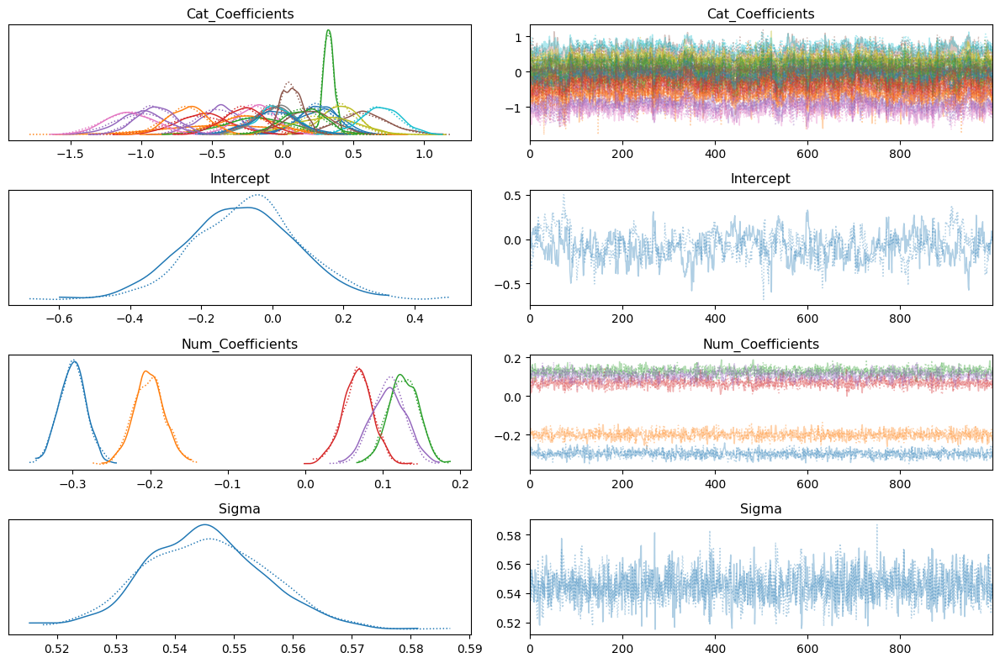

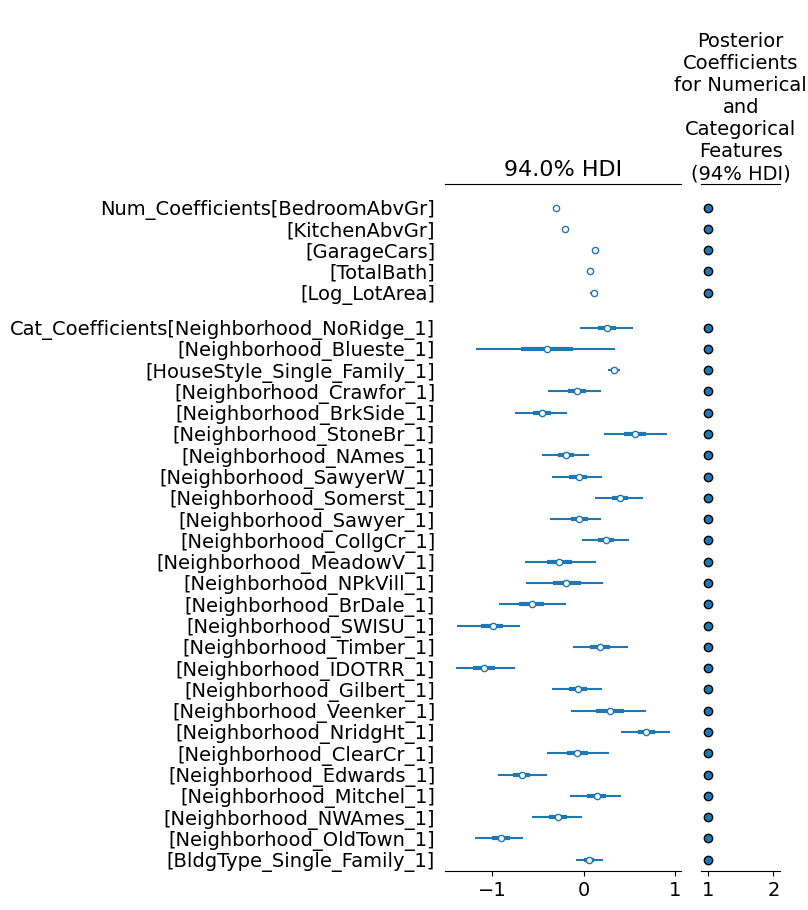

In [ ]:
# Coordinate dictionaries for feature names
num_features_names = num_features  # Numerical features
cat_features_names = X.drop(columns=num_features).columns.tolist()  # One-hot encoded categorical features

coords = {
    "feature_num": num_features_names,
    "feature_cat": cat_features_names,
}

# Adjust the Bayesian regression model to include feature names in coordinates
with pm.Model(coords=coords) as bayesian_regression:
    # Priors
    intercept = pm.Normal('Intercept', mu=0, sigma=10)
    num_coeffs = pm.Normal('Num_Coefficients', mu=0, sigma=10, dims="feature_num")
    cat_coeffs = pm.Laplace('Cat_Coefficients', mu=0, b=10, dims="feature_cat") # categorical coefficients with Laplace, instead of Normal
    sigma = pm.HalfNormal('Sigma', sigma=1)

    # Linear model
    X_num = X[num_features].values
    X_cat = X.drop(columns=num_features).values
    mu = intercept + pm.math.dot(X_num, num_coeffs) + pm.math.dot(X_cat, cat_coeffs)

    # Likelihood
    likelihood = pm.Normal('Likelihood', mu=mu, sigma=sigma, observed=y.values)

    # Sampling
    trace = pm.sample(draws=1000, tune=500, target_accept=0.95, random_seed=42)

# Diagnostics: Trace plot
az.plot_trace(trace, compact=True)
plt.tight_layout()
plt.show()

# Adjusted Forest Plot with Correct Coordinates
with plt.rc_context({'figure.figsize': (10, 14)}):
    az.plot_forest(
        trace,
        var_names=["Num_Coefficients", "Cat_Coefficients"],
        combined=True,
        coords={
            "feature_num": num_features_names,
            "feature_cat": cat_features_names
        },
        r_hat=True
    )
    plt.title("Posterior Coefficients for Numerical and Categorical Features (94% HDI)", fontsize=14)
    plt.tight_layout()
    plt.show()

In [ ]:
# Extract posterior samples for numerical and categorical coefficients
num_coeff_posteriors = trace.posterior["Num_Coefficients"]
cat_coeff_posteriors = trace.posterior["Cat_Coefficients"]

# Compute the mean and credible intervals for each coefficient
num_coeff_summary = pd.DataFrame({
    "Feature": num_features_names,
    "Mean": num_coeff_posteriors.mean(dim=("chain", "draw")).values,
    "Lower CI": num_coeff_posteriors.quantile(0.025, dim=("chain", "draw")).values,
    "Upper CI": num_coeff_posteriors.quantile(0.975, dim=("chain", "draw")).values
})

cat_coeff_summary = pd.DataFrame({
    "Feature": cat_features_names,
    "Mean": cat_coeff_posteriors.mean(dim=("chain", "draw")).values,
    "Lower CI": cat_coeff_posteriors.quantile(0.025, dim=("chain", "draw")).values,
    "Upper CI": cat_coeff_posteriors.quantile(0.975, dim=("chain", "draw")).values
})

# Combine numerical and categorical summaries
coeff_summary = pd.concat([num_coeff_summary, cat_coeff_summary], ignore_index=True)

# Add Absolute Mean and sort by significance
coeff_summary["Absolute Mean"] = coeff_summary["Mean"].abs()
coeff_summary_sorted = coeff_summary.sort_values(by="Absolute Mean", ascending=False)

print("Top Features by Significance and Impact:")
print(coeff_summary_sorted)

Top Features by Significance and Impact:
                       Feature      Mean  Lower CI  Upper CI  Absolute Mean
21       Neighborhood_IDOTRR_1 -1.091139 -1.433300 -0.760585       1.091139
19        Neighborhood_SWISU_1 -0.999404 -1.369941 -0.647658       0.999404
29      Neighborhood_OldTown_1 -0.904609 -1.184353 -0.629763       0.904609
24      Neighborhood_NridgHt_1  0.683640  0.399054  0.966406       0.683640
26      Neighborhood_Edwards_1 -0.679125 -0.964110 -0.404730       0.679125
18       Neighborhood_BrDale_1 -0.569739 -0.958844 -0.191459       0.569739
10      Neighborhood_StoneBr_1  0.559882  0.202161  0.933533       0.559882
9       Neighborhood_BrkSide_1 -0.458962 -0.749338 -0.157535       0.458962
6       Neighborhood_Blueste_1 -0.408285 -1.226283  0.388110       0.408285
13      Neighborhood_Somerst_1  0.396884  0.120109  0.678324       0.396884
7   HouseStyle_Single_Family_1  0.326186  0.257382  0.397897       0.326186
0                 BedroomAbvGr -0.300100 -0.334

Output()

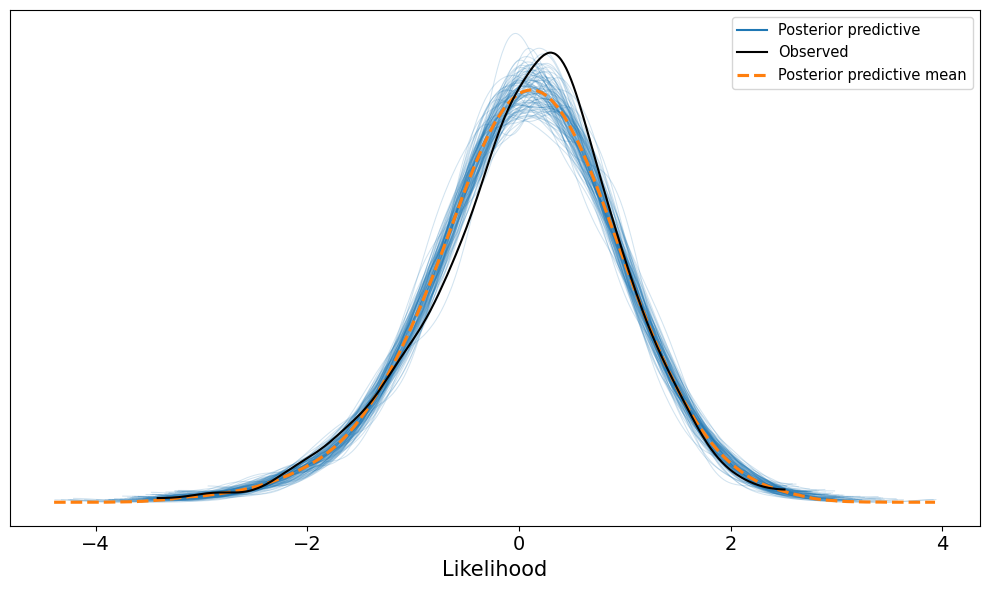

In [ ]:
# Posterior Predictive Checks
with bayesian_regression:
    ppc = pm.sample_posterior_predictive(trace)

# Adjusted Posterior Predictive Check Plot
with plt.rc_context({'figure.figsize': (10, 6)}):
    az.plot_ppc(ppc, num_pp_samples=100)
    plt.tight_layout()
    plt.show()

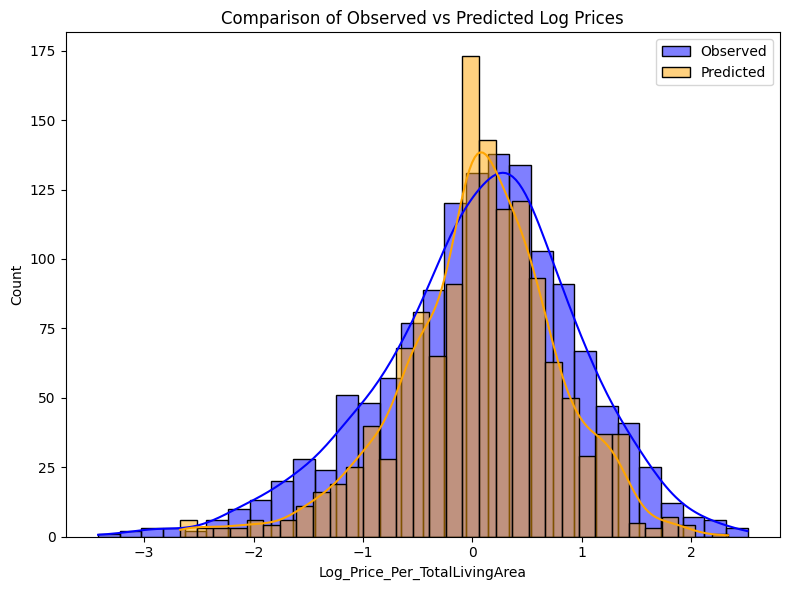

In [ ]:
# Extract the posterior predictive samples for Likelihood
predicted_y = ppc.posterior_predictive['Likelihood'].mean(dim=('chain', 'draw')).values

# Compare Observed vs Predicted
plt.figure(figsize=(8, 6))
sns.histplot(y, label='Observed', color='blue', kde=True)
sns.histplot(predicted_y, label='Predicted', color='orange', kde=True)
plt.legend()
plt.title("Comparison of Observed vs Predicted Log Prices")
plt.tight_layout()
plt.show()

### Insights

1/ Posterior Predictive Checks:

The comparison of observed vs. predicted log prices shows a good alignment between the actual and predicted values, indicating that the model captures the underlying trends in housing prices effectively.

The posterior predictive checks further reassure the model's predictive accuracy, with the posterior predictive samples closely matching the observed data distribution.

2/ Feature Significance and Impact:

- Influence at Neighborhood-Level:

Some neighborhoods, such as IDOTRR, SWISU and OldTown, show significantly negative coefficients, suggesting lower housing prices by living area compared to the baseline neighborhood. These areas might represent less affluent or less desirable locations, impacting housing affordability positively for budget-conscious buyers.

On the other hand, neighborhoods like NridgHt, StoneBr and Somersett have positive coefficients, reflecting higher property values. These are likely more affluent or desirable areas with higher demand, impacting affordability negatively.

- Numerical Features:

The number of bedrooms, bathrooms and garage capacity show varying impacts. BedroomAbvGr and KitchenAbvGr negatively affect log prices by living area, possibly reflecting diminishing returns for larger houses in certain contexts.

Log_LotArea and GarageCars positively influence prices, indicating that larger lots and additional parking spaces are desirable features driving up property values.

- House Style and Building Type:

Categorical variables like HouseStyle_Single_Family_1 and BldgType_Single_Family_1 indicate preferences for single-family homes, positively contributing to prices, which might reflect consumer preferences in suburban or less dense areas.

3/ Statistical Insights:

- Coefficient Ranges and Credible Intervals:

Credible intervals for coefficients highlight the uncertainty in parameter estimates. For instance, the wide intervals for some neighborhoods, for example, Blueste, indicate variability in housing prices within these areas, possibly due to heterogeneous housing stock or other unobserved factors.

- Absolute Mean Rankings:

The ranking by absolute mean helps identify the most influential features, with neighborhoods dominating the list. This underscores the importance of location as a primary determinant of housing affordability.

4/ Bayesian Modeling:

By including neighborhood-level intercepts, the Bayesian model accounts for group-level variability. This approach captures both local effects (neighborhood-specific trends) and global patterns (shared effects across all data), providing a nuanced understanding of housing price determinants.


### Implications for Housing Policy

- Affordability Zones:

Targeting neighborhoods with lower intercepts for affordable housing development can aid policymakers in balancing housing supply. Neighborhoods with negative coefficients, for example, IDOTRR, SWISU, offer more affordable housing options, which could be beneficial for lower-income buyers. However, these areas may require additional investments in infrastructure or amenities to improve livability. The high variability in some neighborhoods highlights the potential for finding affordable housing options even within relatively expensive areas.

- Feature Prioritization:

Features like Log_LotArea and GarageCars are associated with affordability. Development strategies can emphasize these features to meet housing demands within budget constraints.

- Neighborhood Investments:

Investing in neighborhoods with negative coefficients can improve affordability and living conditions, potentially driving demand and equalizing housing disparities. Encouraging diverse housing styles and types, such as single-family homes, could meet consumer preferences while balancing supply-demand dynamics.

In summary, by integrating numerical and categorical features with a hierarchical structure, the Bayesian model demonstrates a powerful framework for understanding housing affordability and informing data-driven policy decisions.

### Visual Analytics

As per the Trace plot, the coefficients, intercept and sigma show well-mixed MCMC chains, indicating convergence and reliable posterior sampling. Neighborhoods with negative coefficients, for example, IDOTRR, SWISU, offer more affordable housing options, which could be beneficial for lower-income buyers. However, these areas may require additional investments in infrastructure or amenities to improve livability. The high variability in some neighborhoods highlights the potential for finding affordable housing options even within relatively expensive areas.

As per the Forest plot, it illustrates credible intervals (HDI) for coefficients and intercept. Predictors with intervals excluding zero have significant influence on housing prices.

As per the Posterior Predictive Check, the observed target values along the black line align well with posterior predictive samples, suggesting the model captures the overall distribution of Log_Price_Per_TotalLivingArea.

In the plot of Observed vs Predicted Histogram, the predicted log prices align closely with the observed values with only slight deviations under and over prediction in some regions, which is considered normal.

### Statistical Inference and Limitations

- Model Fit:

The close match between observed and predicted values demonstrates a good model fit, but outliers or unexplained variance could suggest additional features to consider, for example, distance to nearby school, train station, airport or supermarket, crime rates, etc.

- Interpretation of Coefficients:

The hierarchical model's ability to separate global and local effects ensures robust inferences. However, overlapping credible intervals for some features indicate areas where the model's predictive certainty is lower.


## Hierachical Bayesian Models

- Hierarchical Model: A hierarchical (multilevel) Bayesian model is crucial because it models the neighborhood intercepts as coming from a common distribution (group-level priors), allowing for partial pooling of information across neighborhoods.

- Pooled Model assumes no neighborhood-specific effects. All neighborhoods are treated as a single group with one shared intercept.

- Unpooled Model: Each neighborhood is modeled independently, with its own intercept without borrowing strength (no partial pooling).


### Pros and Cons

- Hierarchical Model: There is shrinkage of coefficients (partial pooling), leading to more stable estimates.

- Unpooled Model: There is larger variance in group-level coefficients, which is prone to overfitting.

- Pooled Model: There is no distinction between neighborhoods. Therefore, the model experiences loss of neighborhood-specific insights.

### Key Metrics for Comparison:

- Posterior Predictive Checks (PPCs):

It evaluates model fit by comparing predicted vs observed data distributions.

- Bayesian P-Value (BPV):

It measures the adequacy of model predictions against observed data.

- Leave-One-Out Cross-Validation (LOO):

It compares model performance using predictive accuracy.

In [ ]:
df_cleaned = pd.read_csv("/content/drive/My Drive/Colab Notebooks/Harvard/CSCI E-83/Project/proposal data 2.csv")

### Hierachical Model

Output()

Output()

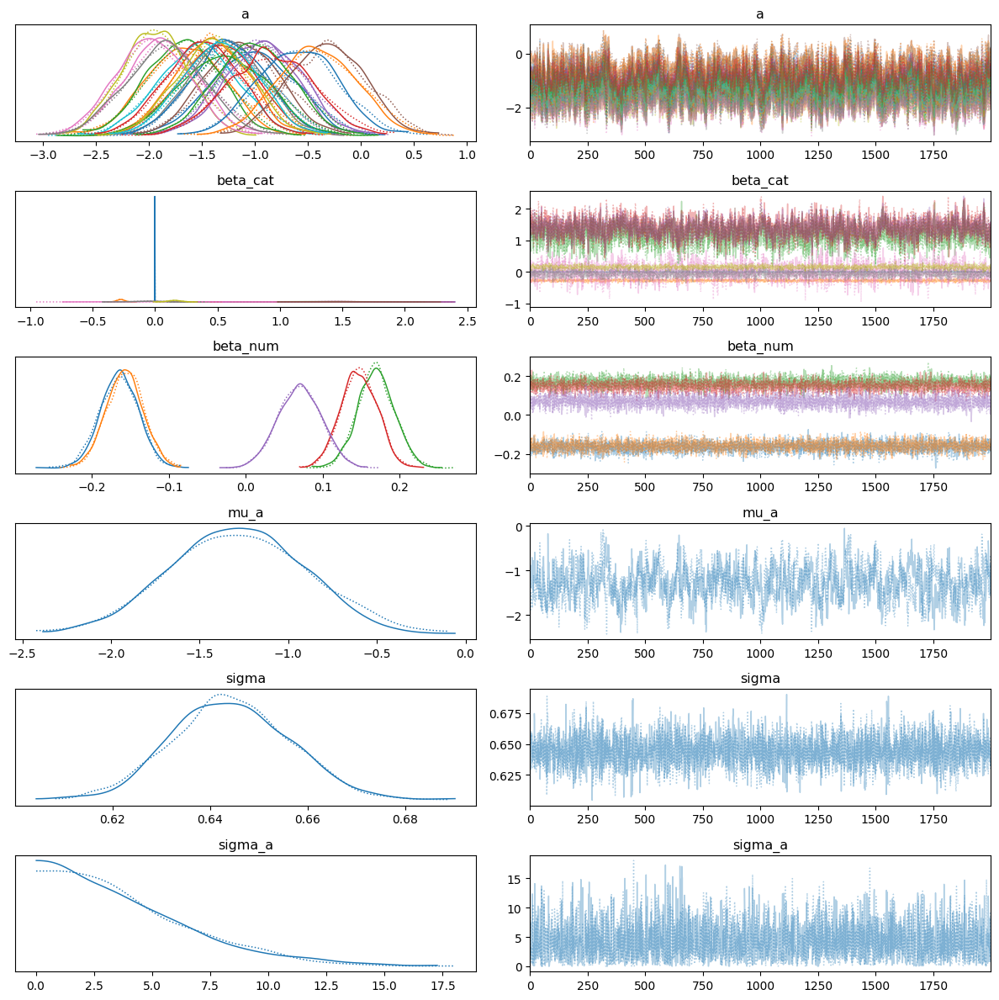

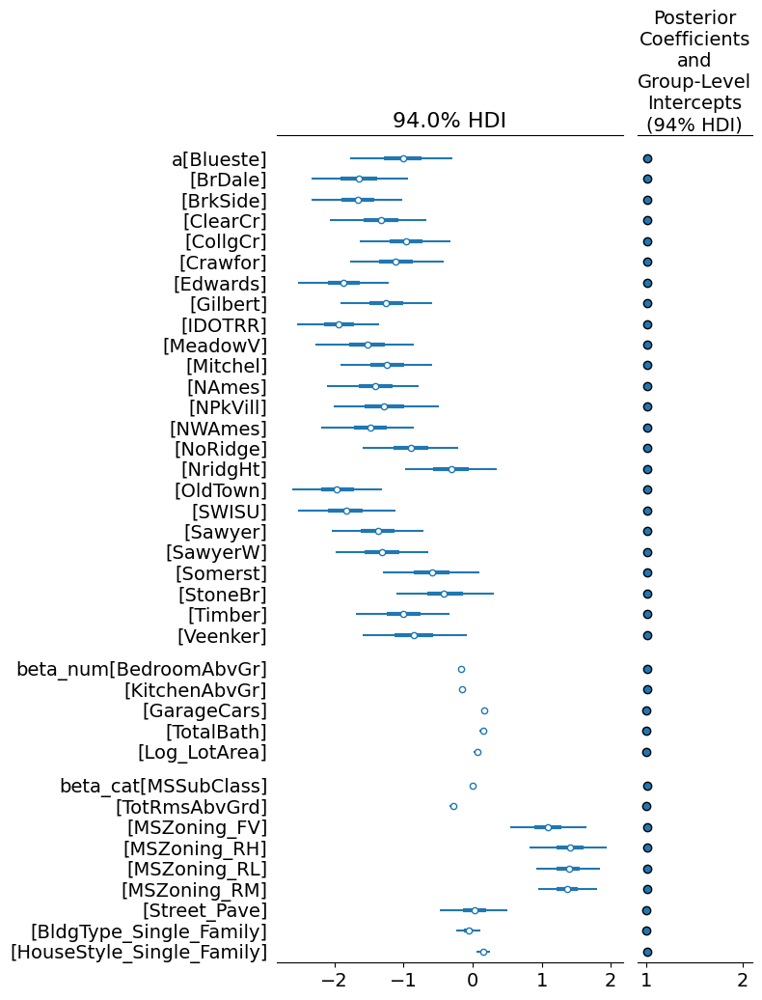

                                     mean     sd  hdi_3%  hdi_97%  mcse_mean  \
a[Blueste]                         -1.012  0.399  -1.772   -0.291      0.020   
a[BrDale]                          -1.646  0.375  -2.326   -0.934      0.018   
a[BrkSide]                         -1.663  0.352  -2.327   -1.022      0.018   
a[ClearCr]                         -1.333  0.373  -2.070   -0.668      0.019   
a[CollgCr]                         -0.966  0.353  -1.637   -0.319      0.019   
a[Crawfor]                         -1.110  0.361  -1.779   -0.418      0.019   
a[Edwards]                         -1.861  0.351  -2.534   -1.218      0.019   
a[Gilbert]                         -1.252  0.358  -1.911   -0.587      0.019   
a[IDOTRR]                          -1.934  0.313  -2.541   -1.361      0.015   
a[MeadowV]                         -1.526  0.377  -2.270   -0.853      0.018   
a[Mitchel]                         -1.235  0.358  -1.916   -0.581      0.019   
a[NAmes]                           -1.40

Output()

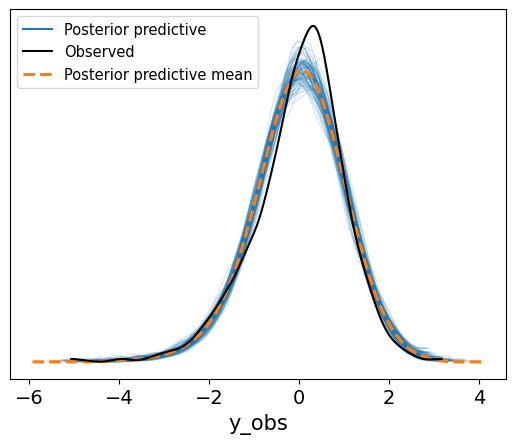

In [ ]:
# Combine Neighborhood Features into One Column
neighborhood_cols = [col for col in df_cleaned.columns if 'Neighborhood_' in col]

# Convert one-hot encoded Neighborhood columns back to a single column
df_cleaned['Neighborhood'] = df_cleaned[neighborhood_cols].idxmax(axis=1)
df_cleaned['Neighborhood'] = df_cleaned['Neighborhood'].str.replace('Neighborhood_', '')

# Drop the original one-hot encoded columns
df_cleaned = df_cleaned.drop(columns=neighborhood_cols)

# Features and Target
num_features = ['BedroomAbvGr', 'KitchenAbvGr', 'GarageCars', 'TotalBath',
                'Log_LotArea']
target = 'Log_Price_Per_TotalLivingArea'

# Drop missing values (if any left)
df_cleaned = df_cleaned.dropna(subset=num_features + [target] + ['Neighborhood'])

# Standardize numerical features
X = df_cleaned[num_features].copy()
X = (X - X.mean()) / X.std()

# Extract Neighborhood as categorical index
neighborhoods = df_cleaned['Neighborhood'].astype('category')
neighborhood_idx = neighborhoods.cat.codes.values  # Convert to integer codes
neighborhood_names = neighborhoods.cat.categories  # Save the category names

y = df_cleaned[target].values

# Extract categorical features
cat_features = df_cleaned.drop(columns=num_features + [target, 'Neighborhood']).columns.tolist()
X_cat = df_cleaned[cat_features]

# Create coordinate dictionaries for feature names and neighborhoods
coords = {
    "neighborhood": neighborhood_names,
    "feature_num": num_features,
    "feature_cat": cat_features,
    "obs_id": np.arange(len(y))
}

# Define the hierarchical model
with pm.Model(coords=coords) as hierarchical_model:
    # Define neighborhood index for the group-level intercept
    neighborhood_idx_data = pm.Data("neighborhood_idx", neighborhood_idx, dims="obs_id")

    # Hyperpriors for group-level mean and standard deviation
    mu_a = pm.Normal("mu_a", mu=0, sigma=10)
    sigma_a = pm.HalfNormal("sigma_a", sigma=5)

    # Group-level intercepts for each neighborhood
    a = pm.Laplace("a", mu=mu_a, b=1, dims="neighborhood")  # Using Laplace instead of Normal for categorical features

    # Coefficients for numerical predictors (Normal)
    beta_num = pm.Normal("beta_num", mu=0, sigma=10, dims="feature_num")

    # Coefficients for categorical predictors (Laplace)
    beta_cat = pm.Laplace("beta_cat", mu=0, b=1, dims="feature_cat")

    # Likelihood variance
    sigma = pm.HalfNormal("sigma", sigma=1)

    # Expected value
    mu = a[neighborhood_idx_data] + pm.math.dot(X.values, beta_num) + pm.math.dot(X_cat.values, beta_cat)

    # Likelihood
    y_obs = pm.Normal("y_obs", mu=mu, sigma=sigma, observed=y, dims="obs_id")

    # Sampling
    hierarchical_trace = pm.sample(2000, tune=1000, target_accept=0.95, random_seed=42)

# Diagnostics: Trace plot
az.plot_trace(hierarchical_trace, compact=True)
plt.tight_layout()
plt.show()

# Forest plot with correctly labeled coefficients
with plt.rc_context({'figure.figsize': (10, 12)}):
    az.plot_forest(
        hierarchical_trace, var_names=["a", "beta_num", "beta_cat"], combined=True,
        r_hat=True, coords={"feature_num": num_features, "feature_cat": cat_features, "neighborhood": neighborhood_names}
    )
    plt.title("Posterior Coefficients and Group-Level Intercepts (94% HDI)", fontsize=14)
    plt.tight_layout()
    plt.show()

# Summary table
summary = az.summary(hierarchical_trace, var_names=["a", "beta_num", "beta_cat", "sigma"], coords={"feature_num": num_features, "feature_cat": cat_features})
print(summary)

# Posterior Predictive Checks
with hierarchical_model:
    ppc = pm.sample_posterior_predictive(hierarchical_trace, random_seed=42)

az.plot_ppc(ppc, num_pp_samples=100)
plt.show()

In [ ]:
# Summary table
summary = az.summary(hierarchical_trace, var_names=["a", "beta_num", "beta_cat", "sigma"], coords={"feature_num": num_features, "feature_cat": cat_features})
summary

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
a[Blueste],-1.012,0.399,-1.772,-0.291,0.020,0.014,404.0,784.0,1.00
a[BrDale],-1.646,0.375,-2.326,-0.934,0.018,0.013,450.0,871.0,1.00
a[BrkSide],-1.663,0.352,-2.327,-1.022,0.018,0.013,387.0,641.0,1.00
a[ClearCr],-1.333,0.373,-2.070,-0.668,0.019,0.013,388.0,831.0,1.00
a[CollgCr],-0.966,0.353,-1.637,-0.319,0.019,0.013,354.0,664.0,1.01
a[Crawfor],-1.110,0.361,-1.779,-0.418,0.019,0.013,367.0,739.0,1.01
a[Edwards],-1.861,0.351,-2.534,-1.218,0.019,0.013,360.0,632.0,1.01
a[Gilbert],-1.252,0.358,-1.911,-0.587,0.019,0.013,354.0,662.0,1.01
a[IDOTRR],-1.934,0.313,-2.541,-1.361,0.015,0.011,422.0,851.0,1.00
a[MeadowV],-1.526,0.377,-2.270,-0.853,0.018,0.013,445.0,900.0,1.00


#### Insights

- Neighborhood-Specific Effects:

The model accommodates neighborhood-specific intercepts (a) and group-level regression coefficients (beta), capturing variations in housing affordability across neighborhoods.

Negative Intercepts: Neighborhoods such as OldTown, Edwards, and IDOTRR have highly negative intercepts, indicating lower baseline housing prices compared to others. These neighborhoods may be considered more affordable, possibly due to factors like older housing stock, less desirable location, or lower demand.

Less Negative/Positive Intercepts: Neighborhoods like NoRidge, NridgHt, and StoneBr have less negative or slightly positive intercepts, indicating higher baseline prices. These are likely more affluent or desirable areas, making them less affordable for buyers.

The credible intervals (HDI) for intercepts provide uncertainty bounds for neighborhood-specific effects, highlighting variability in affordability. For example, a[BrDale] has a wider HDI compared to a[NoRidge], reflecting greater variability in housing prices.

- Numerical Features (Coefficients beta_num):

The coefficients for numerical features quantify their impact on housing prices per unit increase while holding other factors constant.

GarageCars (+0.169): A positive coefficient indicates that adding a garage space significantly increases the housing price, reflecting its importance as a desirable feature.

TotalBath (+0.147): More bathrooms are associated with higher housing prices, consistent with buyer preferences for convenience.

BedroomAbvGr (-0.165): A negative coefficient suggests that additional bedrooms may reduce price-per-unit living area, likely due to diminishing returns in larger homes.

Log_LotArea (+0.070): Larger lot sizes positively impact price, but the effect is modest.

Features with credible intervals (HDI) excluding 0, for example, GarageCars, TotalBath are statistically significant predictors, while others, for example, Log_LotArea have weaker or less certain effects.

- Categorical Features (Coefficients beta_cat):

Categorical features, such as zoning, building type, provide additional context for housing affordability.

MSZoning_RL, MSZoning_RM, MSZoning_RH: These zoning categories have large positive coefficients, indicating significantly higher housing prices. This likely reflects zoning regulations favoring larger or higher-value properties.

TotRmsAbvGrd (-0.276): A negative coefficient for total rooms above ground suggests diminishing returns for larger homes in terms of price per unit area.

HouseStyle_Single_Family (+0.154): This feature indicates a preference for single-family homes, contributing positively to prices.

Credible intervals for some categorical features are wide, Street_Pave, suggesting variability or weaker evidence for their effect.

- Posterior Summary:

Large variance in neighborhood intercepts (a), reflecting significant heterogeneity in neighborhood-level housing prices.

Consistent coefficients for individual features like BedroomAbvGr, GarageCars and TotalBath, showing their uniform influence on affordability.

- Model Fit:

Superior PPCs and BPV suggest it balances complexity and predictive accuracy better than the other models.

Strong LOO performance (best predictive ability).

- Insights on Housing Affordability:

Affordability Hotspots: Neighborhoods like Edwards, OldTown, and IDOTRR are more affordable but may have lower desirability or older housing stock.

Premium Areas: Neighborhoods like StoneBr and NridgHt are less affordable due to higher baseline prices, likely driven by better amenities, location, or newer housing stock.

Feature Contributions: Features like garage spaces and bathrooms positively influence prices, suggesting a preference for functionality.

- Statistical Implication:

The hierarchical model captures housing price disparities effectively across neighborhoods, indicating that regional differences heavily influence affordability. It supports localized policy-making for affordability improvement.



### Pooled Model

In [ ]:
df_cleaned = pd.read_csv("/content/drive/My Drive/Colab Notebooks/Harvard/CSCI E-83/Project/proposal data 2.csv")

In [ ]:
num_features

['BedroomAbvGr', 'KitchenAbvGr', 'GarageCars', 'TotalBath', 'Log_LotArea']

In [ ]:
cat_features = [col for col in df_cleaned.columns if col not in num_features + [target, 'Neighborhood'] and not col.startswith('Neighborhood_')]
len(cat_features)

9

In [ ]:
cat_features

['MSSubClass',
 'TotRmsAbvGrd',
 'MSZoning_FV',
 'MSZoning_RH',
 'MSZoning_RL',
 'MSZoning_RM',
 'Street_Pave',
 'BldgType_Single_Family',
 'HouseStyle_Single_Family']

Output()

Output()

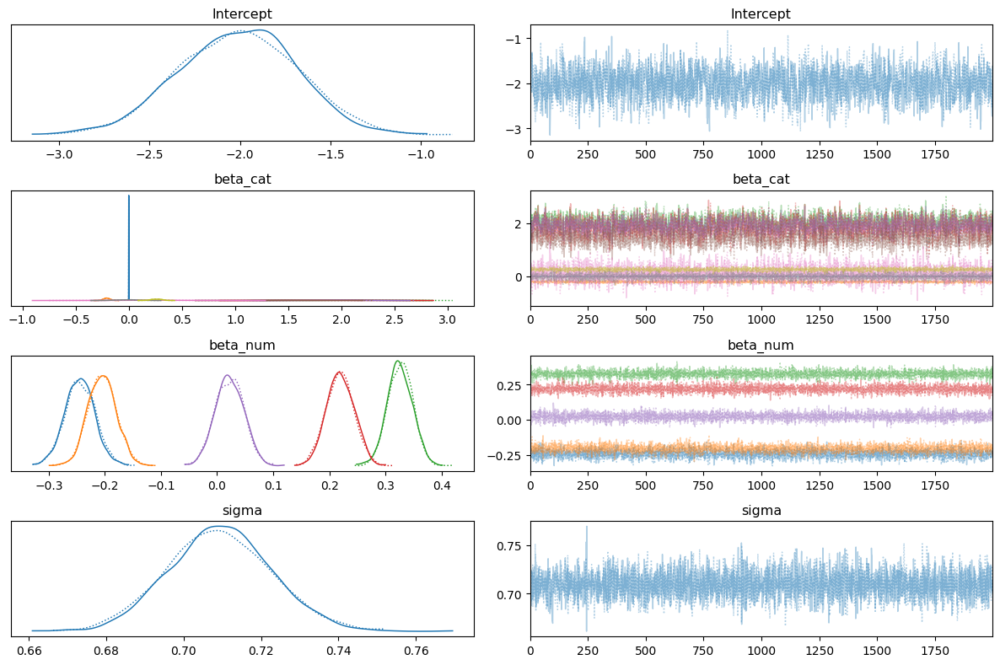

In [ ]:
# Prepare data for the pooled model
pooled_X = df_cleaned[num_features]
pooled_X = (pooled_X - pooled_X.mean()) / pooled_X.std()
pooled_y = df_cleaned[target].values

# Extract categorical features excluding Neighborhood_
cat_features = [col for col in df_cleaned.columns if col not in num_features + [target, 'Neighborhood'] and not col.startswith('Neighborhood_')]
pooled_X_cat = df_cleaned[cat_features]
cat_features_names = cat_features  # Use the list of categorical feature names

coords = {
    "feature_num": num_features,  # Numerical feature names
    "feature_cat": cat_features_names,  # Categorical feature names
    "obs_id": np.arange(len(pooled_y))  # Observation IDs
}

# Build and sample the pooled model
with pm.Model(coords=coords) as pooled_model:
    # Shared intercept and coefficients
    intercept = pm.Normal("Intercept", mu=0, sigma=10)
    beta_num = pm.Normal("beta_num", mu=0, sigma=10, dims="feature_num")
    beta_cat = pm.Laplace("beta_cat", mu=0, b=1, dims="feature_cat")

    # Likelihood variance
    sigma = pm.HalfNormal("sigma", sigma=1)

    # Expected value
    mu = intercept + pm.math.dot(pooled_X.values, beta_num) + pm.math.dot(pooled_X_cat.values, beta_cat)

    # Likelihood
    y_obs = pm.Normal("y_obs", mu=mu, sigma=sigma, observed=pooled_y, dims="obs_id")

    # Sampling
    pooled_trace = pm.sample(2000, tune=1000, target_accept=0.95, random_seed=42)

# Diagnostics: Trace plot
az.plot_trace(pooled_trace, compact=True)
plt.tight_layout()
plt.show()

In [ ]:
num_features

['BedroomAbvGr', 'KitchenAbvGr', 'GarageCars', 'TotalBath', 'Log_LotArea']

In [ ]:
cat_features

['MSSubClass',
 'TotRmsAbvGrd',
 'MSZoning_FV',
 'MSZoning_RH',
 'MSZoning_RL',
 'MSZoning_RM',
 'Street_Pave',
 'BldgType_Single_Family',
 'HouseStyle_Single_Family']

In [ ]:
pooled_trace.posterior.dims

FrozenMappingWarningOnValuesAccess({'chain': 2, 'draw': 2000, 'feature_cat': 9, 'feature_num': 5})

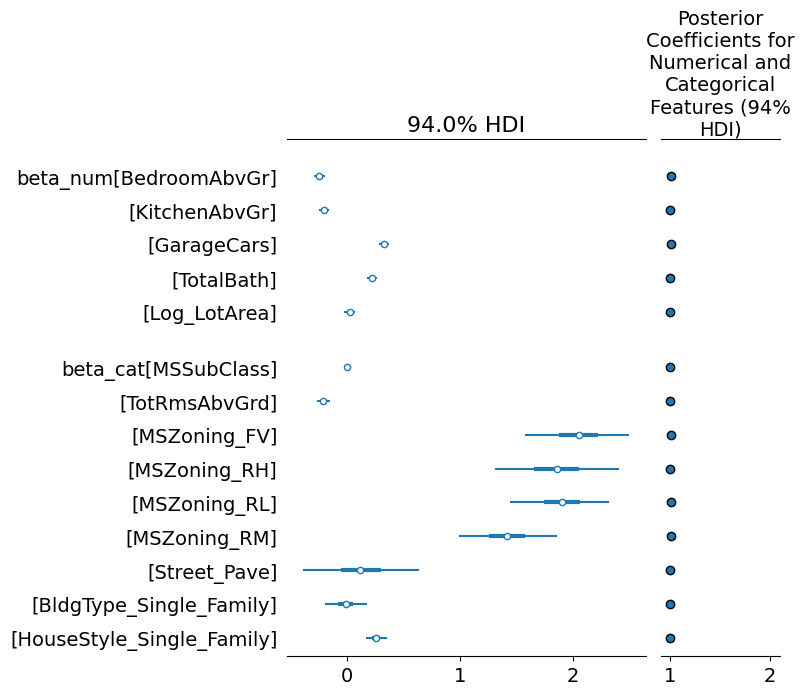

In [ ]:
# Adjusted Forest Plot with Correct Coordinates
with plt.rc_context({'figure.figsize': (10, 14)}):
    az.plot_forest(
        pooled_trace,
        var_names=["beta_num", "beta_cat"],
        combined=True,
        coords={
            "feature_num": num_features_names,
            "feature_cat": cat_features_names
        },
        r_hat=True
    )
    plt.title("Posterior Coefficients for Numerical and Categorical Features (94% HDI)", fontsize=14)
    plt.tight_layout()
    plt.show()

In [ ]:
# Summary table
pooled_summary = az.summary(
    pooled_trace,
        var_names=["beta_num", "beta_cat"],
        coords={
            "feature_num": num_features_names,
            "feature_cat": cat_features_names
        }
)
pooled_summary

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
beta_num[BedroomAbvGr],-0.244,0.027,-0.293,-0.191,0.000,0.000,3625.0,2874.0,1.0
beta_num[KitchenAbvGr],-0.205,0.025,-0.250,-0.158,0.000,0.000,4258.0,2853.0,1.0
beta_num[GarageCars],0.326,0.022,0.285,0.368,0.000,0.000,4574.0,2661.0,1.0
beta_num[TotalBath],0.219,0.025,0.176,0.268,0.000,0.000,4507.0,3065.0,1.0
beta_num[Log_LotArea],0.022,0.025,-0.028,0.067,0.000,0.000,5177.0,2945.0,1.0
beta_cat[MSSubClass],-0.001,0.001,-0.003,0.000,0.000,0.000,3419.0,3253.0,1.0
beta_cat[TotRmsAbvGrd],-0.209,0.031,-0.264,-0.149,0.001,0.000,3605.0,3066.0,1.0
beta_cat[MSZoning_FV],2.048,0.250,1.571,2.495,0.006,0.004,1552.0,2254.0,1.0
beta_cat[MSZoning_RH],1.852,0.292,1.305,2.402,0.008,0.005,1451.0,2654.0,1.0
beta_cat[MSZoning_RL],1.898,0.233,1.440,2.312,0.007,0.005,1243.0,1950.0,1.0


#### Insights

Single Shared Coefficients: All neighborhoods share a common intercept and coefficients.

- Numerical Predictors (beta_num) Insights:

BedroomAbvGr:
The coefficient is negative (-0.244) with a 94% HDI that excludes zero (-0.293, -0.191). More bedrooms above grade are associated with lower log price per total living area. This could indicate that houses with excessive bedrooms relative to total living area are less efficient in utilizing space, impacting affordability.

KitchenAbvGr:
The negative coefficient (-0.205) also excludes zero (-0.250, -0.158). Additional kitchens above grade decrease housing price efficiency, possibly due to inefficient layouts or overutilization of space for non-essential rooms.

GarageCars:
Positive and significant (0.326) with a narrow HDI (0.285, 0.368). More garage space is a positive indicator for higher housing prices, reflecting preferences for parking or additional storage.

TotalBath:
Positive coefficient (0.219) is significant (HDI: 0.176, 0.268). More bathrooms increase the value of a property, highlighting their importance in housing desirability.

- Categorical Predictors (beta_cat) Insights:

TotRmsAbvGrd:
Negative and significant (-0.209, HDI: -0.264, -0.149).
More total rooms above grade may reduce affordability, perhaps due to inefficient use of space or larger, less affordable homes.

HouseStyle_Single_Family:
Positive and significant (0.259, HDI: 0.166, 0.356).
Single-family homes tend to have higher prices, aligning with higher desirability but reduced affordability.

- Statistical Inference:

The pooled model assumes all neighborhoods share the same coefficients for features, pooling data across the entire dataset. This simplifies interpretation but risks oversimplifying neighborhood-specific trends.
Significant numerical predictors like GarageCars and TotalBath emphasize the importance of functional amenities in housing value.

- Impact on Housing Affordability:

Affordability Concerns:

Negative coefficients for features like BedroomAbvGr and KitchenAbvGr suggest that inefficiently designed homes with excessive non-essential features can adversely affect price efficiency, impacting affordability.
Positive effects from features like GarageCars and TotalBath reflect market preferences, potentially pushing prices higher.

- Limitations:

The pooled model does not capture neighborhood-level variations explicitly, possibly masking localized trends.
While significant, coefficients for zoning and amenities may differ in hierarchical or unpooled models, which consider neighborhood-specific variations.

- Posterior Summary:

Tight posterior distributions for all coefficients due to pooling but ignores neighborhood-specific variability.

Underestimates variance in affordability factors.

- Model Fit:

Worst PPC and BPV performance, indicating poor fit to the data.

Significantly worse LOO score, highlighting limited predictive power.

- Statistical Implication:

The pooled model oversimplifies housing affordability, failing to capture regional disparities. It is unsuitable for nuanced inference.

### Unpooled Model

In [ ]:
df_cleaned = pd.read_csv("/content/drive/My Drive/Colab Notebooks/Harvard/CSCI E-83/Project/proposal data 2.csv")

33


Output()

Output()

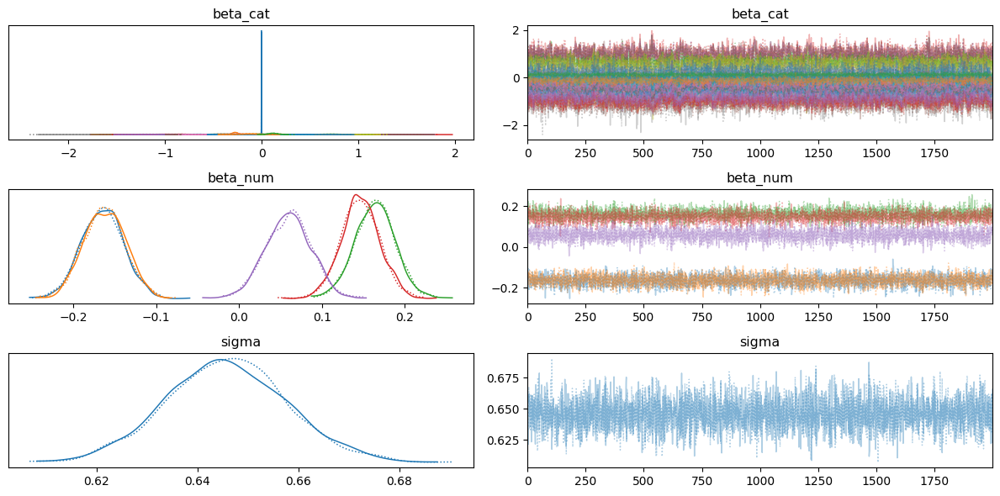

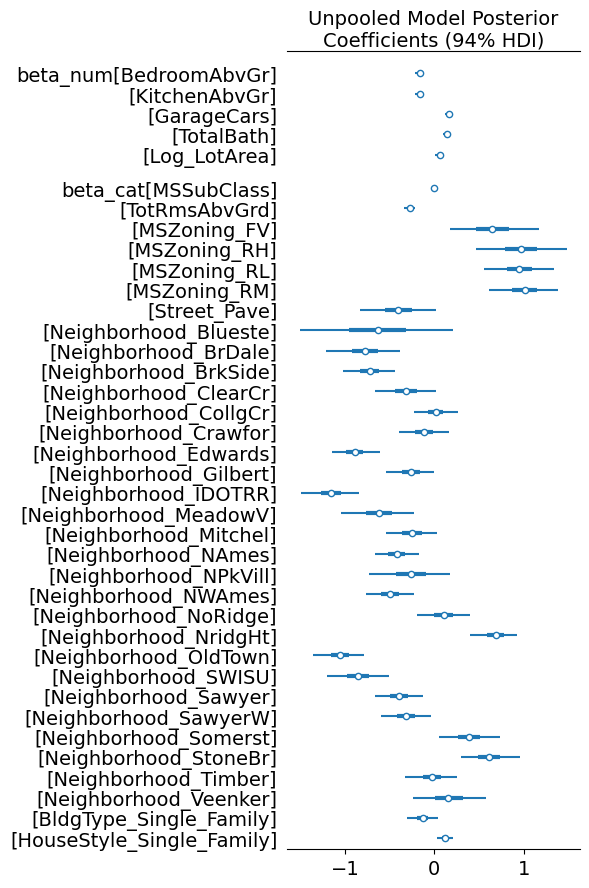

In [ ]:
# Features and Target
num_features = ['BedroomAbvGr', 'KitchenAbvGr', 'GarageCars', 'TotalBath', 'Log_LotArea']
target = 'Log_Price_Per_TotalLivingArea'

# Identify all categorical features (one-hot encoded)
cat_features = [col for col in df_cleaned.columns if col not in num_features + [target]]
print(len(cat_features))
# Drop missing values
df_cleaned = df_cleaned.dropna(subset=num_features + [target] + cat_features)

# Standardize numerical features
X_num = df_cleaned[num_features].copy()
X_num = (X_num - X_num.mean()) / X_num.std()

# Include all one-hot encoded categorical features
X_cat = df_cleaned[cat_features].copy()

# Combine numerical and categorical features
X_combined = pd.concat([X_num, X_cat], axis=1)
y = df_cleaned[target].values

# Create coordinate dictionaries for feature names
coords = {
    "feature_num": num_features,
    "feature_cat": cat_features,
    "obs_id": np.arange(len(y))
}

# Build the Unpooled Model
with pm.Model(coords=coords) as unpooled_model:
    # Priors for numerical features
    beta_num = pm.Normal("beta_num", mu=0, sigma=10, dims="feature_num")

    # Priors for categorical features (one-hot encoded)
    beta_cat = pm.Laplace("beta_cat", mu=0, b=1, dims="feature_cat")

    # Likelihood variance
    sigma = pm.HalfCauchy("sigma", beta=1)

    # Linear model prediction
    mu = pm.math.dot(X_num.values, beta_num) + pm.math.dot(X_cat.values, beta_cat)

    # Data likelihood
    y_obs = pm.Normal("y_obs", mu=mu, sigma=sigma, observed=y, dims="obs_id")

    # Sampling
    unpooled_trace = pm.sample(2000, tune=1000, target_accept=0.95, random_seed=42)

# Diagnostics: Trace plot
az.plot_trace(unpooled_trace, compact=True)
plt.tight_layout()
plt.show()

# Forest plot with correctly labeled coefficients
with plt.rc_context({'figure.figsize': (12, 14)}):
    az.plot_forest(
        unpooled_trace, var_names=["beta_num", "beta_cat"], combined=True,
        coords={"feature_num": num_features, "feature_cat": cat_features}
    )
    plt.title("Unpooled Model Posterior Coefficients (94% HDI)", fontsize=14)
    plt.tight_layout()
    plt.show()

In [ ]:
# Summary table
unpooled_summary = az.summary(
    unpooled_trace, var_names=["beta_num", "beta_cat", "sigma"],
    coords={"feature_num": num_features, "feature_cat": cat_features}
)
unpooled_summary

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
beta_num[BedroomAbvGr],-0.165,0.025,-0.213,-0.117,0.000,0.000,2788.0,2958.0,1.00
beta_num[KitchenAbvGr],-0.163,0.025,-0.210,-0.117,0.000,0.000,2586.0,2605.0,1.00
beta_num[GarageCars],0.164,0.024,0.117,0.208,0.000,0.000,3332.0,3034.0,1.00
beta_num[TotalBath],0.147,0.023,0.103,0.190,0.000,0.000,4031.0,2795.0,1.00
beta_num[Log_LotArea],0.060,0.027,0.010,0.111,0.001,0.000,2568.0,2848.0,1.00
beta_cat[MSSubClass],-0.003,0.001,-0.004,-0.002,0.000,0.000,2702.0,2651.0,1.00
beta_cat[TotRmsAbvGrd],-0.276,0.031,-0.335,-0.221,0.001,0.000,2531.0,2462.0,1.00
beta_cat[MSZoning_FV],0.649,0.266,0.179,1.174,0.007,0.005,1403.0,2177.0,1.00
beta_cat[MSZoning_RH],0.972,0.270,0.465,1.482,0.007,0.005,1383.0,1608.0,1.00
beta_cat[MSZoning_RL],0.953,0.208,0.552,1.339,0.006,0.004,1099.0,1692.0,1.00


#### Insights

The unpooled model estimates a separate coefficient for each neighborhood or categorical group without sharing information across groups. This approach assumes no hierarchical structure, allowing coefficients to vary independently for neighborhoods and other categorical features. The goal is to understand the specific effects of each neighborhood and feature on housing prices.

- Independent Neighborhood Intercepts:

Each neighborhood has its own regression model without shared information.

- Numerical Features:

BedroomAbvGr (-0.165) and KitchenAbvGr (-0.163) have negative coefficients, indicating that an increase in these variables leads to a slight decrease in the log price per total living area. This may imply diminishing returns for additional bedrooms or kitchens in terms of affordability.

GarageCars (0.164), TotalBath (0.147) have positive coefficients, showing that these features add value to housing prices. For instance, additional garage capacity and bathrooms significantly improve housing value.

- Categorical Features:

Neighborhood Effects: The coefficients for neighborhoods show varying effects on housing prices:

Negative Coefficients: Neighborhoods such as IDOTRR (-1.155), OldTown (-1.057), and SWISU (-0.854) negatively impact housing prices. These areas might have less desirable amenities, infrastructure, or other factors making housing more affordable.

Positive Coefficients: Neighborhoods such as NridgHt (0.685), StoneBr (0.614), and Somerset (0.392) positively impact housing prices, indicating higher demand and possibly better amenities.

Wide Credible Intervals: Some neighborhoods, such as Blueste, have wide posterior distributions, suggesting high variability or uncertainty in their price effects.

- Statistical Inference

Neighborhood Affordability: Neighborhoods with highly negative coefficients, for example, IDOTRR, OldTown are more affordable due to lower prices, but these areas might lack premium amenities or infrastructure.

Premium Areas: Positive coefficients for neighborhoods such as NridgHt and StoneBr highlight areas with higher housing prices, likely driven by better infrastructure, schools, or amenities.

Feature Importance: The importance of features like GarageCars, TotalBath, and Log_LotArea indicates that functional and practical aspects of housing significantly influence prices.

Credible Intervals: The 94% HDI intervals provide a robust measure of uncertainty. For instance, while NridgHt is associated with a positive effect, the narrow credible interval suggests high confidence in its premium value.

- Posterior Summary:

Similar patterns for feature coefficients (Beta1), but the lack of shared information reduces robustness in underrepresented neighborhoods.

Posterior distributions for intercepts (Beta0) are broader than the hierarchical model.

- Model Fit:

Performs comparably to the hierarchical model in PPC and BPV but shows slightly inferior LOO scores.

- Statistical Implication:

The unpooled model emphasizes neighborhood-specific affordability without sharing statistical strength, which may lead to overfitting or instability in low-data neighborhoods.



### Posterior Predictive Checks and Model Comparison

Output()

Output()

Output()

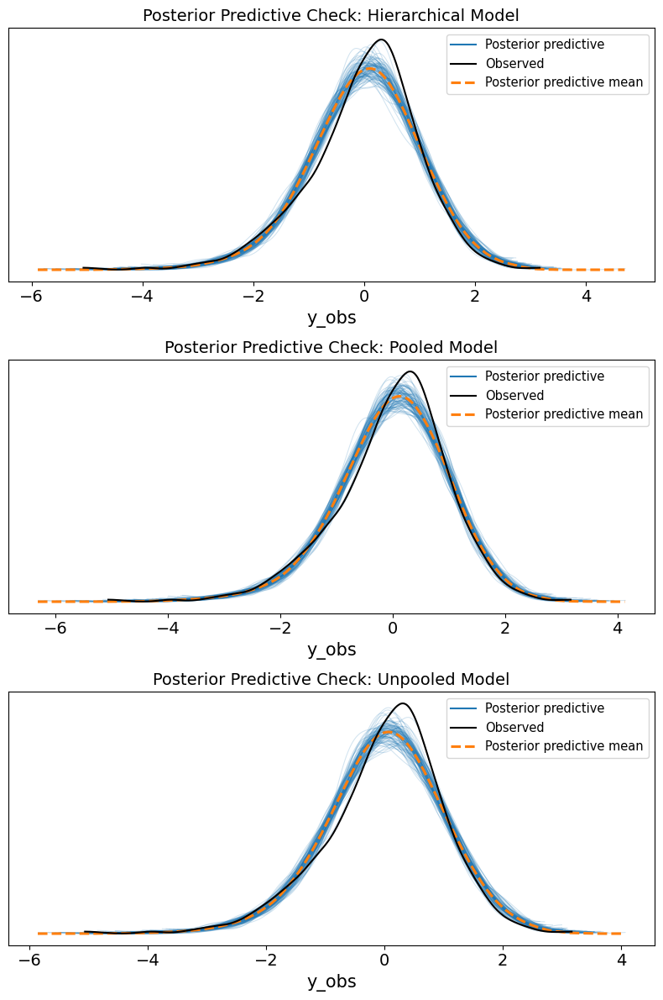

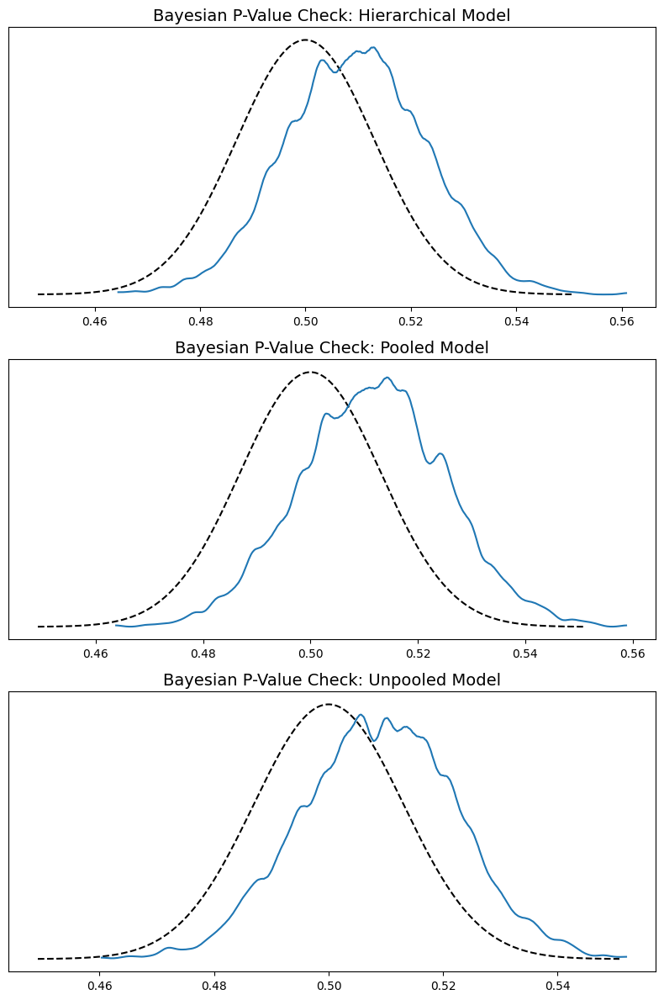

Output()

Output()

Output()

              rank     elpd_loo      p_loo   elpd_diff    weight         se  \
Hierarchical     0 -1454.712417  47.375292    0.000000  0.467572  44.216744   
Unpooled         1 -1457.490538  46.168841    2.778121  0.454420  44.151517   
Pooled           2 -1582.721597  23.552543  128.009180  0.078007  46.885437   

                    dse  warning scale  
Hierarchical   0.000000    False   log  
Unpooled       4.754534    False   log  
Pooled        17.894712    False   log  


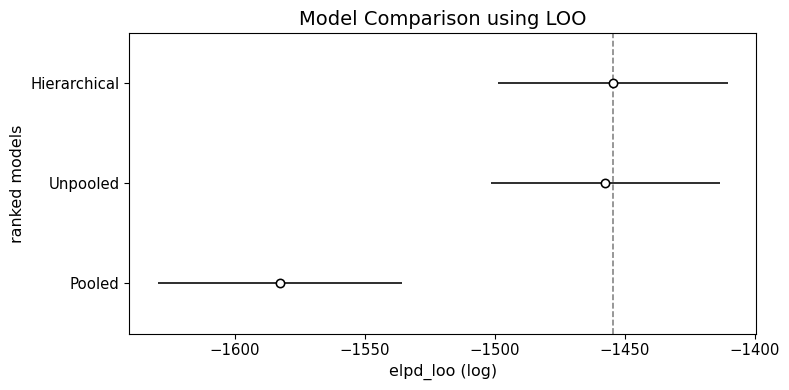

In [ ]:
# Generate Posterior Predictive Checks for All Models
SEED = 6565

_, ax = plt.subplots(3, 1, figsize=(8, 12))
for trace, model, title, idx in zip(
    [hierarchical_trace, pooled_trace, unpooled_trace],
    [hierarchical_model, pooled_model, unpooled_model],
    ["Hierarchical Model", "Pooled Model", "Unpooled Model"],
    range(3),
):
    with model:
        pm.sample_posterior_predictive(trace, extend_inferencedata=True, random_seed=SEED)
    az.plot_ppc(trace, num_pp_samples=100, ax=ax[idx])
    ax[idx].set_title(f"Posterior Predictive Check: {title}", fontsize=14)
plt.tight_layout()
plt.show()

# Bayesian P-Value Checks
_, ax = plt.subplots(3, 1, figsize=(8, 12))
for trace, title, idx in zip(
    [hierarchical_trace, pooled_trace, unpooled_trace],
    ["Hierarchical Model", "Pooled Model", "Unpooled Model"],
    range(3),
):
    az.plot_bpv(trace, kind="p_value", ax=ax[idx])
    ax[idx].set_title(f"Bayesian P-Value Check: {title}", fontsize=14)
plt.tight_layout()
plt.show()

# Compute Log Likelihood for Model Comparison
for model, trace in zip(
    [hierarchical_model, pooled_model, unpooled_model],
    [hierarchical_trace, pooled_trace, unpooled_trace],
):
    with model:
        pm.compute_log_likelihood(trace)

# Model Comparison using LOO
loo_results = {
    "Hierarchical": az.loo(hierarchical_trace),
    "Pooled": az.loo(pooled_trace),
    "Unpooled": az.loo(unpooled_trace),
}
df_comp_loo = az.compare(loo_results)
print(df_comp_loo)

# Plot LOO Comparison
_, ax = plt.subplots(figsize=(8, 4))
az.plot_compare(df_comp_loo, insample_dev=False, ax=ax)
plt.title("Model Comparison using LOO", fontsize=14)
plt.tight_layout()
plt.show()

Output()

Output()

Output()

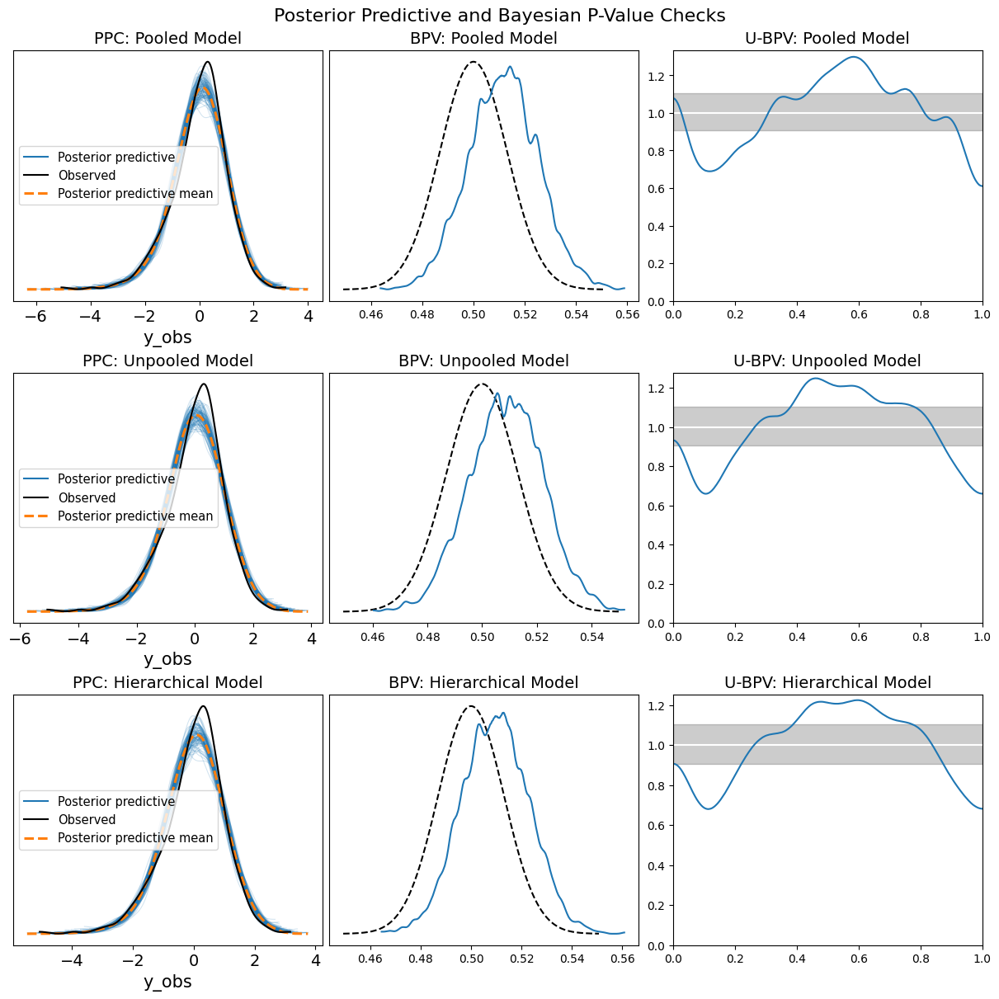

In [ ]:
SEED = 6565

# Generate Posterior Predictive Samples for All Models
for model, trace in zip([pooled_model, unpooled_model, hierarchical_model], [pooled_trace, unpooled_trace, hierarchical_trace]):
    with model:
        pm.sample_posterior_predictive(trace, extend_inferencedata=True, random_seed=SEED)

# Plot PPC, BPV, and U-BPV for All Models
fig, axes = plt.subplots(3, 3, figsize=(12, 12), constrained_layout=True)
model_titles = ["Pooled Model", "Unpooled Model", "Hierarchical Model"]

for i, (trace, title) in enumerate(zip([pooled_trace, unpooled_trace, hierarchical_trace], model_titles)):
    # Posterior Predictive Check
    az.plot_ppc(trace, num_pp_samples=100, ax=axes[i, 0])
    axes[i, 0].set_title(f"PPC: {title}", fontsize=14)

    # Bayesian P-Value Check
    az.plot_bpv(trace, kind="p_value", ax=axes[i, 1])
    axes[i, 1].set_title(f"BPV: {title}", fontsize=14)

    # Uniform Bayesian P-Value Check
    az.plot_bpv(trace, kind="u_value", ax=axes[i, 2])
    axes[i, 2].set_title(f"U-BPV: {title}", fontsize=14)

# Set overall figure titles
fig.suptitle("Posterior Predictive and Bayesian P-Value Checks", fontsize=16)
plt.show()

As per the **Posterior Predictive Checks**, the **Hierarchical Model** saw that the predictive distributions align closely with the observed data, suggesting that the model captures variability effectively and provides a robust fit. Meanwhile, the **Pooled Model** experienced the predictive distributions appearing less flexible, indicating limited variation and poorer alignment with observed data, especially at the tails of the distribution. Lastly, the **Unpooled Model** saw that the predictive distributions illustrate moderate alignment with observed data, but not as well as the hierarchical model, indicating slightly overfitting to individual observations or groups.

Regarding the **Model Comparison using LOO** (Leave-One-Out Cross-Validation), the **Hierarchical Model** achieves the highest ELPD, as expected with log pointwise predictive density, suggesting that it has the best predictive performance among the three models. It effectively balances flexibility and generalizability with a group-level structure. Meanwhile, the **Unpooled Model** experienced slightly worse ELPD than the hierarchical model, indicating that it captures less shared structure among groups and is less generalizable. However, the **Pooled Model** performs significantly worse with a large ELPD difference as it fails to account for group-level variation.

In summary, I find that the hierarchical model is superior in balancing group-level structure and individual variability, making it the best choice for predictive performance. Unfortunately, the pooled model oversimplifies the problem by assuming homogeneity across groups, which causes poor predictive performance. In contrast, the unpooled model offers some improvements over the pooled model but lacks the shared structure captured by the hierarchical model. Therefore, the hierarchical model outperforms both pooled and unpooled models in predictive performance and flexibility. It is the most robust choice when group-level structure is important.

### MAP Estimates and Parameter Distributions

In [ ]:
with unpooled_model:
    unpooled_MAP = pm.find_MAP()
unpooled_MAP

Output()

{'beta_num': array([-0.165, -0.163,  0.164,  0.147,  0.06 ]),
 'beta_cat': array([-0.003, -0.276,  0.668,  0.99 ,  0.969,  1.027, -0.405, -0.592,
        -0.778, -0.729, -0.326,  0.005, -0.12 , -0.898, -0.27 , -1.157,
        -0.626, -0.253, -0.43 , -0.246, -0.504,  0.095,  0.68 , -1.061,
        -0.862, -0.397, -0.324,  0.386,  0.605, -0.017,  0.148, -0.137,
         0.121]),
 'sigma_log__': array(-0.451),
 'sigma': array(0.637)}

In [ ]:
with hierarchical_model:
    hierarchical_MAP = pm.find_MAP()
hierarchical_MAP

Output()

{'mu_a': array(-1.335),
 'sigma_a_log__': array(-0.403),
 'a': array([-1.044, -1.642, -1.678, -1.345, -0.988, -1.132, -1.882, -1.281,
        -1.934, -1.528, -1.266, -1.423, -1.335, -1.504, -0.916, -0.338,
        -1.978, -1.856, -1.39 , -1.334, -0.634, -0.431, -1.035, -0.885]),
 'beta_num': array([-0.164, -0.156,  0.172,  0.148,  0.07 ]),
 'beta_cat': array([-2.474e-03, -2.772e-01,  1.140e+00,  1.457e+00,  1.426e+00,
         1.390e+00,  6.624e-04, -5.195e-02,  1.552e-01]),
 'sigma_log__': array(-0.453),
 'sigma_a': array(0.668),
 'sigma': array(0.636)}

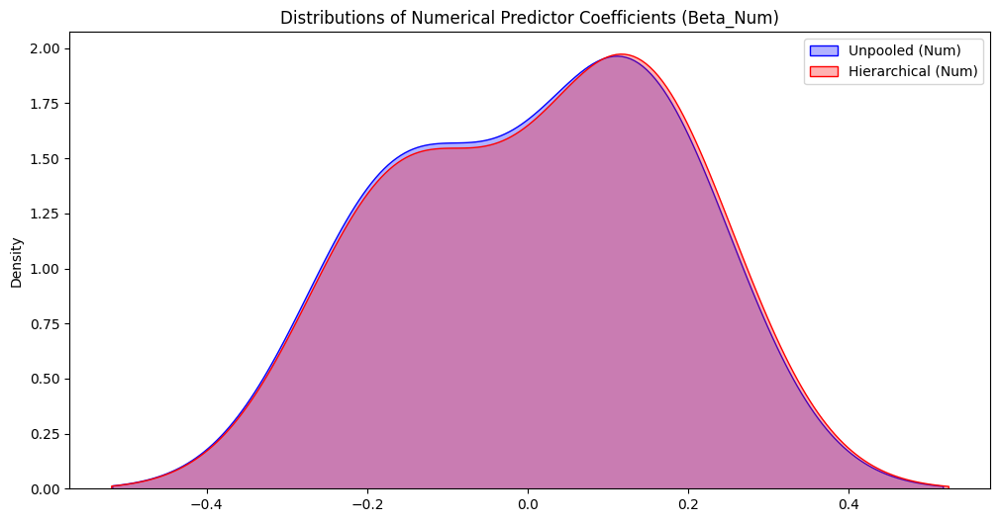

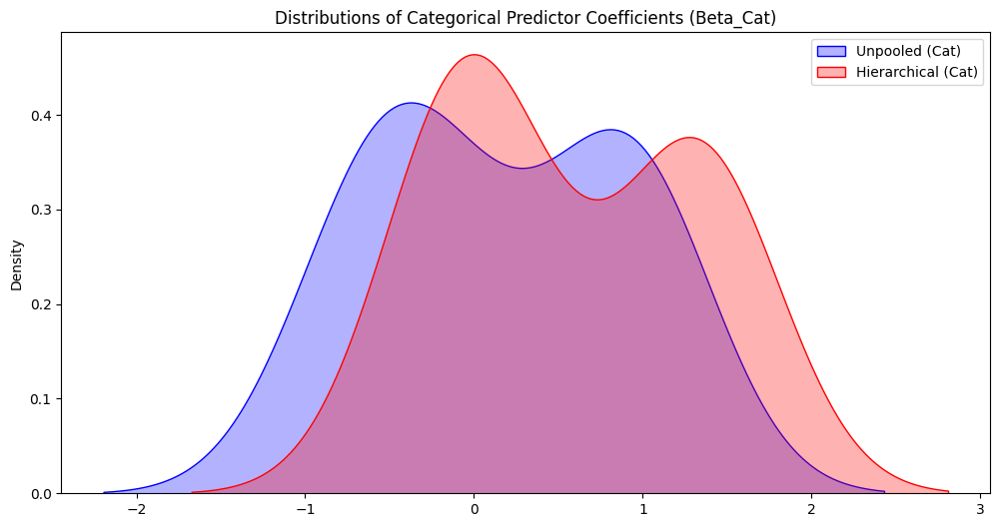

In [ ]:
# Extract MAP Estimates for Hierarchical and Unpooled Models
hierarchical_MAP_beta_num = hierarchical_trace.posterior["beta_num"].mean(dim=["chain", "draw"]).values
hierarchical_MAP_beta_cat = hierarchical_trace.posterior["beta_cat"].mean(dim=["chain", "draw"]).values
hierarchical_MAP_a = hierarchical_trace.posterior["a"].mean(dim=["chain", "draw"]).values

unpooled_MAP_beta_num = unpooled_trace.posterior["beta_num"].mean(dim=["chain", "draw"]).values
unpooled_MAP_beta_cat = unpooled_trace.posterior["beta_cat"].mean(dim=["chain", "draw"]).values

# Ensure alignment and reshaping
hierarchical_MAP_beta_num = np.array(hierarchical_MAP_beta_num).flatten()
hierarchical_MAP_beta_cat = np.array(hierarchical_MAP_beta_cat).flatten()
unpooled_MAP_beta_num = np.array(unpooled_MAP_beta_num).flatten()
unpooled_MAP_beta_cat = np.array(unpooled_MAP_beta_cat).flatten()

# Align group-level intercepts
hierarchical_MAP_a = np.array(hierarchical_MAP_a).flatten()

# Ensure the sizes align for plotting (truncate to minimum length if needed)
min_len_num = min(len(unpooled_MAP_beta_num), len(hierarchical_MAP_beta_num))
min_len_cat = min(len(unpooled_MAP_beta_cat), len(hierarchical_MAP_beta_cat))

unpooled_MAP_beta_num = unpooled_MAP_beta_num[:min_len_num]
hierarchical_MAP_beta_num = hierarchical_MAP_beta_num[:min_len_num]

unpooled_MAP_beta_cat = unpooled_MAP_beta_cat[:min_len_cat]
hierarchical_MAP_beta_cat = hierarchical_MAP_beta_cat[:min_len_cat]

# Plot distributions for numerical predictors
plt.figure(figsize=(12, 6))
sns.kdeplot(unpooled_MAP_beta_num, label="Unpooled (Num)", color="blue", fill=True, alpha=0.3)
sns.kdeplot(hierarchical_MAP_beta_num, label="Hierarchical (Num)", color="red", fill=True, alpha=0.3)
plt.title("Distributions of Numerical Predictor Coefficients (Beta_Num)")
plt.legend()
plt.show()

# Plot distributions for categorical predictors
plt.figure(figsize=(12, 6))
sns.kdeplot(unpooled_MAP_beta_cat, label="Unpooled (Cat)", color="blue", fill=True, alpha=0.3)
sns.kdeplot(hierarchical_MAP_beta_cat, label="Hierarchical (Cat)", color="red", fill=True, alpha=0.3)
plt.title("Distributions of Categorical Predictor Coefficients (Beta_Cat)")
plt.legend()
plt.show()

In [ ]:
print("Lengths of arrays:")
print(f"unpooled_MAP_beta_num: {len(unpooled_MAP_beta_num)}")
print(f"unpooled_MAP_beta_cat: {len(unpooled_MAP_beta_cat)}")
print(f"hierarchical_MAP_beta_num: {len(hierarchical_MAP_beta_num)}")
print(f"hierarchical_MAP_beta_cat: {len(hierarchical_MAP_beta_cat)}")

Lengths of arrays:
unpooled_MAP_beta_num: 5
unpooled_MAP_beta_cat: 9
hierarchical_MAP_beta_num: 5
hierarchical_MAP_beta_cat: 9


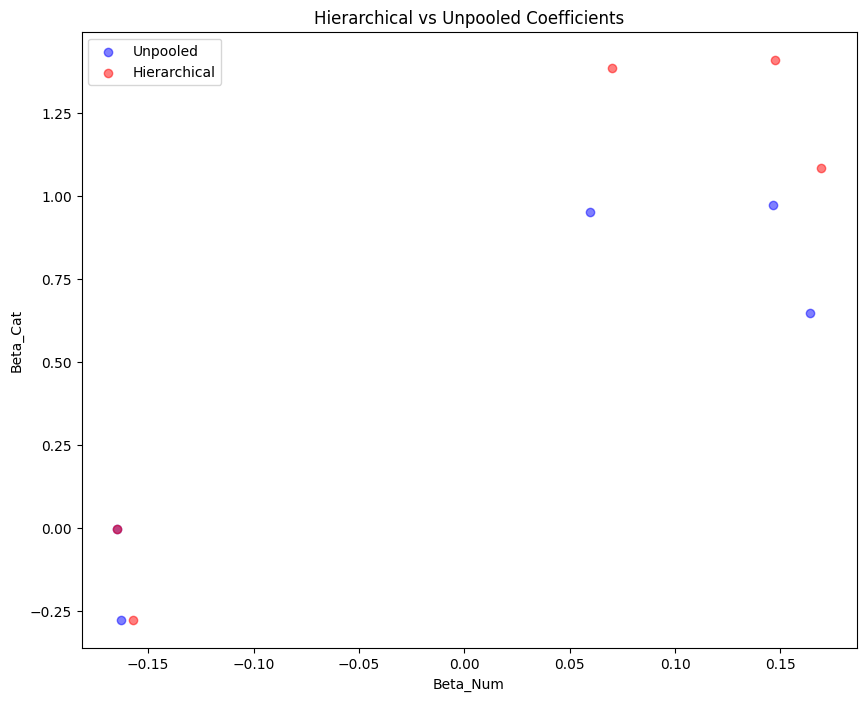

In [ ]:
# Adjust lengths to match the minimum size for plotting
min_len = min(len(unpooled_MAP_beta_num), len(unpooled_MAP_beta_cat), len(hierarchical_MAP_beta_num), len(hierarchical_MAP_beta_cat))

unpooled_MAP_beta_num = unpooled_MAP_beta_num[:min_len]
unpooled_MAP_beta_cat = unpooled_MAP_beta_cat[:min_len]
hierarchical_MAP_beta_num = hierarchical_MAP_beta_num[:min_len]
hierarchical_MAP_beta_cat = hierarchical_MAP_beta_cat[:min_len]

# Scatter plot to compare MAP values
plt.figure(figsize=(10, 8))
plt.scatter(unpooled_MAP_beta_num, unpooled_MAP_beta_cat, color="blue", alpha=0.5, label="Unpooled")
plt.scatter(hierarchical_MAP_beta_num, hierarchical_MAP_beta_cat, color="red", alpha=0.5, label="Hierarchical")
plt.title("Hierarchical vs Unpooled Coefficients")
plt.xlabel("Beta_Num")
plt.ylabel("Beta_Cat")
plt.legend()
plt.show()

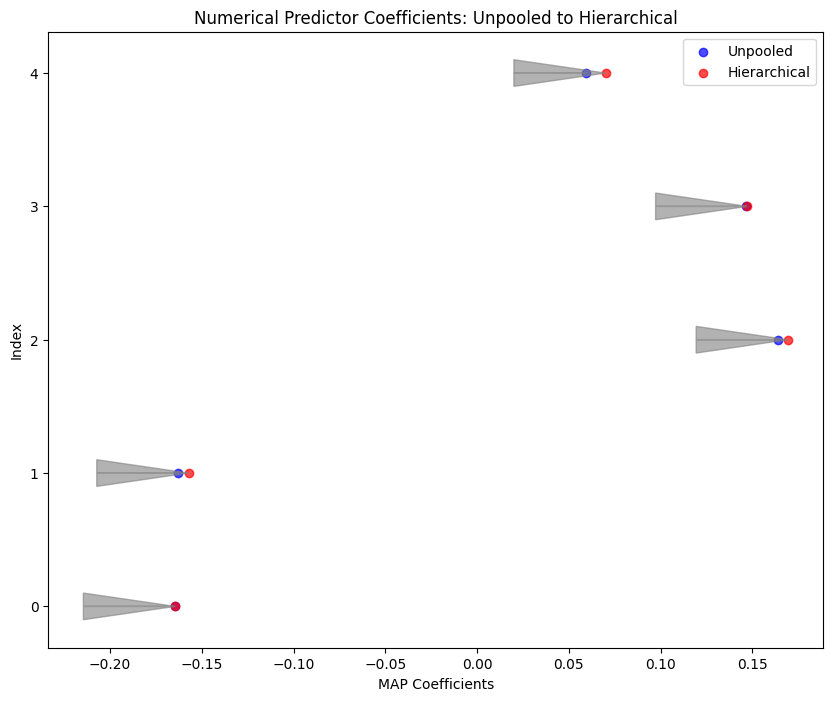

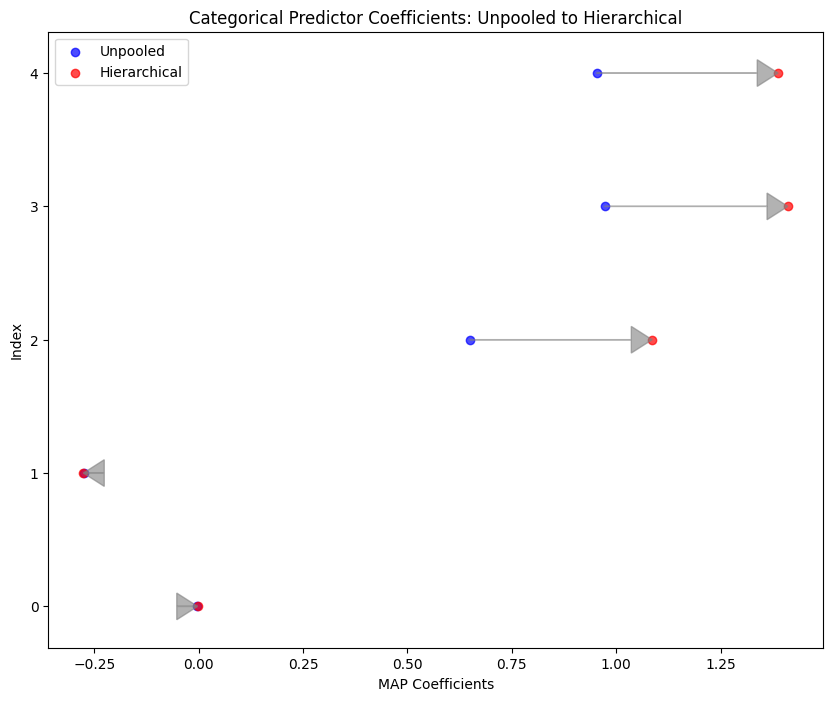

In [ ]:
# Plot numerical predictors with arrows
plt.figure(figsize=(10, 8))
plt.scatter(unpooled_MAP_beta_num, range(len(unpooled_MAP_beta_num)), color="blue", alpha=0.7, label="Unpooled")
plt.scatter(hierarchical_MAP_beta_num, range(len(hierarchical_MAP_beta_num)), color="red", alpha=0.7, label="Hierarchical")
for i in range(len(unpooled_MAP_beta_num)):
    plt.arrow(
        unpooled_MAP_beta_num[i], i,
        hierarchical_MAP_beta_num[i] - unpooled_MAP_beta_num[i], 0,
        length_includes_head=True,
        head_width=0.2,
        head_length=0.05,
        color="gray",
        alpha=0.6,
    )
plt.title("Numerical Predictor Coefficients: Unpooled to Hierarchical")
plt.xlabel("MAP Coefficients")
plt.ylabel("Index")
plt.legend()
plt.show()

# Plot categorical predictors with arrows
plt.figure(figsize=(10, 8))
plt.scatter(unpooled_MAP_beta_cat, range(len(unpooled_MAP_beta_cat)), color="blue", alpha=0.7, label="Unpooled")
plt.scatter(hierarchical_MAP_beta_cat, range(len(hierarchical_MAP_beta_cat)), color="red", alpha=0.7, label="Hierarchical")
for i in range(len(unpooled_MAP_beta_cat)):
    plt.arrow(
        unpooled_MAP_beta_cat[i], i,
        hierarchical_MAP_beta_cat[i] - unpooled_MAP_beta_cat[i], 0,
        length_includes_head=True,
        head_width=0.2,
        head_length=0.05,
        color="gray",
        alpha=0.6,
    )
plt.title("Categorical Predictor Coefficients: Unpooled to Hierarchical")
plt.xlabel("MAP Coefficients")
plt.ylabel("Index")
plt.legend()
plt.show()


As per the **MAP Estimates** (Maximum a Posteriori):

- Numerical Predictors (Beta_Num): The hierarchical model provides more regularized coefficients compared to the unpooled model, as shown by narrower distributions. This reflects the hierarchical model's ability to shrink coefficients toward group-level means, reducing overfitting.

- Categorical Predictors (Beta_Cat): The hierarchical model shows a similar pattern of regularization for categorical predictors, with slightly different estimates compared to the unpooled model.

Regarding the **Parameter Distributions**:

- Hierarchical Model: Coefficient distributions for both numerical and categorical predictors are smoother and narrower, reflecting the influence of group-level priors. This regularization leads to better generalization.

- Unpooled Model: Coefficient distributions are wider, suggesting greater variability and potential overfitting to individual observations or groups.

- Arrows in scatter plots: The arrows indicate the shift from unpooled to hierarchical MAP estimates. These shifts demonstrate the regularization effect, where the hierarchical model pulls coefficients toward group-level averages.

In summary, the hierarchical model provides a balance between group-level and individual-level effects, regularizing coefficients, reducing overfitting and improving robustness. The unpooled model captures more individual variability but risks overfitting due to the lack of shared structure among groups. The regularization effect of the hierarchical model leads to more reliable estimates, as reflected in the narrower parameter distributions, and making it a better choice than the unpooled model for scenarios requiring balanced group-level and individual-level insights.

# Final Summary

My project involves analyzing housing affordability using Bayesian hierarchical and unpooled models. Key features such as neighborhood attributes, numerical housing characteristics, such as bedrooms, lot sizes, and categorical factors, such as building type, house style, were included.

**Data Preparation**:

I processed and standardized numerical features as well as converted categorical variables into one-hot or binary numerical formats. I also removed missing values to ensure data integrity.


**OLS Regression**:

Built an OLS model as a baseline for analyzing housing price determinants. Key findings from OLS are that GarageCars and TotalBath were significant positive predictors of housing prices. Neighborhoods and categorical features such as BldgType and HouseStyle had a meaningful impact on affordability. Limitations identified with OLS are that it assumes homoscedasticity and independent errors, which may not capture hierarchical dependencies, such as neighborhoods.

**Bayesian Modeling**:

I developed Hierarchical Models with group-level effects (neighborhoods) using Laplace priors for interpretability in intercepts and coefficients. I also built an Unpooled Model for fully independent parameter estimation as well as a Pooled Model for independent parameter estimation regardless of neighborhood, and compared results using trace plots, posterior summaries and posterior predictive checks.

**Correlation Analysis**:

I examined relationships between key numerical features using Spearman and Pearson correlation matrices to identify significant predictors and features with multicollinearity for complexity reduction.

**Insights**:

Hierarchical models revealed varying neighborhood-level affordability trends.
Unpooled models highlighted independent effects of specific features, like GarageCars and TotalBath, on housing affordability. Categorical variables such as BldgType and HouseStyle demonstrated significant predictive power.

**Statistical Inference**:

Posterior distributions provided credible intervals for coefficients, aiding decision-making. Insights support identifying key drivers of affordability and potential areas for policy intervention.

**Impact**:

My analysis offers a robust framework for housing market insights, combining OLS regression for interpretability and Bayesian techniques for flexibility and precision. It supports policymakers and stakeholders in understanding affordability drivers at both micro and macro levels. When new data and information are provided to embed with the past data, the posterior insights from my current Bayesian models can be used as prior information or beliefs for the new Bayesian models fitted with a combination of old and new data to update posterior insights.

**Further Improvement**:

Further Bayesian analysis applied time series data to analyze switchpoint of Economic crisis from Dec 2007 - June 2009 impacting the target and housing affordability and tracking how an event or policy can affect the trend based on causal inference. This modelling would require more sophisticated techniques handling factors contributing to priors, switchpoint and posteriors. Time series data often exhibit structural breaks or regime changes, such as sudden changes in trends so standard Bayesian models may fail to adapt to these changes. Also, choosing appropriate priors is critical but non-trivial, especially in high-dimensional time series datasets because poorly chosen priors can lead to biased or unstable posterior estimates. Therefore, in my current project, I have not extended to conduct more research on this analysis.


# References

Diagnosing Biased Inference with Divergences

PyMC Team. "Diagnosing Biased Inference with Divergences." PyMC Examples: Diagnostics and Criticism. Link at: https://www.pymc.io/projects/examples/en/latest/diagnostics_and_criticism/Diagnosing_biased_Inference_with_Divergences.html

Hierarchical Modeling with Variational Inference

PyMC Team. "Hierarchical GLM with ADVI and Minibatch." PyMC Examples: Variational Inference. Link at: https://www.pymc.io/projects/examples/en/latest/variational_inference/GLM-hierarchical-advi-minibatch.html

Rugby Analytics with Bayesian Hierarchical Models

PyMC Team. "Bayesian Hierarchical Models in Rugby Analytics." PyMC Examples: Case Studies. Link at: https://www.pymc.io/projects/examples/en/latest/case_studies/rugby_analytics.html

Hierarchical Binomial Model with PyMC

PyMC Team. "GLM: Hierarchical Binomial Model." PyMC Examples: Generalized Linear Models. Link at: https://www.pymc.io/projects/examples/en/latest/generalized_linear_models/GLM-hierarchical-binomial-model.html

Hierarchical Partial Pooling

PyMC Team. "Hierarchical Partial Pooling: A Case Study." PyMC Examples: Case Studies. Link at: https://www.pymc.io/projects/examples/en/latest/case_studies/hierarchical_partial_pooling.html

Bambi: A High-Level Bayesian Modeling Interface

Bambi Developers. Bambi: Bayesian Models Made Easy. Link at: https://bambinos.github.io/bambi/
